In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
""" import """
import numpy as np # linear algebra
import math
#import pandas as pd
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
from torch import device
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
import torch.nn.functional as F
from torchvision.utils import save_image
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import sys
%matplotlib inline

In [3]:
""" USE CUDA """
print('__Python VERSION:', sys.version)
print('__pyTorch VERSION:', torch.__version__)
print('__CUDA VERSION', )
from subprocess import call
# call(["nvcc", "--version"]) does not work
print('__CUDNN VERSION:', torch.backends.cudnn.version())
print('__Number CUDA Devices:', torch.cuda.device_count())
print('__Devices')
# call(["nvidia-smi", "--format=csv", "--query-gpu=index,name,driver_version,memory.total,memory.used,memory.free"])
print('Active CUDA Device: GPU', torch.cuda.current_device())
print ('Available devices ', torch.cuda.device_count())
print ('Current cuda device ', torch.cuda.current_device())
cuda = True if torch.cuda.is_available() else False
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

__Python VERSION: 3.7.10 (default, May  3 2021, 02:48:31) 
[GCC 7.5.0]
__pyTorch VERSION: 1.8.1+cu101
__CUDA VERSION
__CUDNN VERSION: 7603
__Number CUDA Devices: 1
__Devices
Active CUDA Device: GPU 0
Available devices  1
Current cuda device  0


In [4]:

""" Start with variables"""
n_epochs = 1200
latent_dim = 100
b_size = 64

learning_rate = 0.0002
sample_interval = 400
b1 = 0.5
b2 = 0.999
n_critic = 5
#img_shape = (opt.channels, opt.img_size, opt.img_size)
img_shape = (3,64,64)
img_size = 64
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
mode = "updatedGan" #"updatedGan"

tv_weight = 10 #0.01
tv_weight_jpg = "10" # "0_000001"

In [5]:
""" OS folder """
root_path = "/content/gdrive/MyDrive/5525-final-project"
data_path ="/content/gdrive/MyDrive/5525-final-project/data"
save_path = "/content/gdrive/MyDrive/5525-final-project/{0}_result_labda{1}_epoch_{2}".format(mode,tv_weight,n_epochs)
 


In [6]:
"""Save to CSV file"""
fields = ["EPOCH",  "D_loss", "G_loss"]
filename = "Result_{0}_{1}.csv".format(mode,tv_weight_jpg)
path = "/content/gdrive/MyDrive/5525-final-project/"
os.chdir(path)
os.listdir(path)
#os.makedirs('/content/gdrive/MyDrive/CSCI5525/result',exist_ok = True)
with open(filename, 'w') as csvfile:
    for i in fields:
        csvfile.write(i+",")
    # creating a csv writer object  
    csvfile.write("\n")


In [7]:
print(os.listdir(data_path)[:5])

['subset-7k.zip', 'images']


In [8]:
""" Prepare Training Data"""
train = ImageFolder(data_path, transform=tt.Compose([ tt.Resize(img_size),
                                                        tt.CenterCrop(img_size),
                                                        tt.ToTensor(),
                                                        tt.Normalize(*stats)]))
 
train_dl = DataLoader(train, b_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [9]:
""" generator """
generator = nn.Sequential(
    # in: latent_dim x 1 x 1

    nn.ConvTranspose2d(latent_dim, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh())

In [10]:
""" Discriminator """
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4



    
    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())
    
    # for wgan
    #nn.Linear(512, 1))

In [11]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [12]:
"""TV norm"""
def total_variation_loss(img, weight):
     bs_img, c_img, h_img, w_img = img.size()
     tv_h = torch.sqrt(torch.pow(img[:,:,1:,:]-img[:,:,:-1,:], 2).sum())
     tv_w = torch.sqrt(torch.pow(img[:,:,:,1:]-img[:,:,:,:-1], 2).sum().sqrt())
     return weight*(tv_h+tv_w)/(bs_img*c_img*h_img*w_img)

In [13]:
#To save the samples produced during epochs

os.makedirs(save_path, exist_ok=True)

def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors).to(device)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(save_path, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [14]:
def train_discriminator(real_images, opt_d):
    
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images).to(device) #real images
    real_targets = torch.ones(real_images.size(0), 1).to(device) #setting targets as 1
    
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(b_size, latent_dim, 1, 1).to(device) #generating the random noices for input image
    fake_images = generator(latent).to(device)  #getting the fake images

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1).to(device) #setting 0 as target for fake images
    fake_preds = discriminator(fake_images).to(device)  #getting the predictions for fake images
    
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    if(mode == "wgan"):
      loss = torch.mean(real_preds)-torch.mean(fake_preds)
      #print(loss)
      #print(torch.mean(real_preds),torch.mean(fake_preds))
      #print(real_score,fake_score)
    elif(mode == "updatedGan"):
      #print("Should not be here")
      real_loss = F.binary_cross_entropy(real_preds, real_targets) #getting the loss
      fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)  #Comparing the two scores through loss
      loss = real_loss + fake_loss
    
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [15]:
def train_generator(opt_g):
    
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(b_size, latent_dim, 1,1).to(device) #random noice
    fake_images = generator(latent).to(device) #fake images generated
    #print("Fake image is ",fake_images.shape)
    # Try to fool the discriminator
    preds = discriminator(fake_images).to(device) #getting the predictions of discriminator for fake images
    
    targets = torch.ones(b_size, 1).to(device) #setting 1 as targets so the discriminator can be fooled

    if(mode == "wgan"):
      if(tv_weight == 0):
        loss = -torch.mean(preds)
      else:
        loss =  -torch.mean(preds) - total_variation_loss(fake_images,tv_weight)
    elif(mode == "updatedGan"):
      
      if(tv_weight == 0):
        loss = F.binary_cross_entropy(preds, targets)
      else:
        #print("g Should be here")
        loss = F.binary_cross_entropy(preds, targets) + total_variation_loss(fake_images,tv_weight) #comparing
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item(),latent

In [16]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.to(device).parameters(), lr=lr, betas=(b1, b2))
    opt_g = torch.optim.Adam(generator.to(device).parameters(), lr=lr, betas=(b1, b2))
    batch_done = 0
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            
            # Train discriminator
            real_images= real_images.to(device)
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            
            # Train generator
            loss_g, latent = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {}, loss_d: {}, real_score: {}, fake_score: {}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
        row = [epoch , loss_g, loss_d]
        # Save generated images
        save_samples(epoch+start_idx, latent, show=False)
        with open(filename, 'a') as csvfile:  
          # creating a csv writer object  
          for item in row:
                csvfile.write('{0},'.format(item))
          csvfile.write("\n") 



    
    return losses_g, losses_d, latent, fake_scores

In [17]:
lg,ld,latent,fake_scores = fit(epochs=n_epochs, lr=learning_rate) #.to(device)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Epoch [1/1200], loss_g: 4.917531967163086, loss_d: 0.41346344351768494, real_score: 0.74685138463974, fake_score: 0.048452265560626984
Saving generated-images-0001.png



Epoch [2/1200], loss_g: 6.698919296264648, loss_d: 1.4460374116897583, real_score: 0.8378013372421265, fake_score: 0.6532164812088013
Saving generated-images-0002.png



Epoch [3/1200], loss_g: 3.3059942722320557, loss_d: 0.5367755889892578, real_score: 0.826147198677063, fake_score: 0.2511863708496094
Saving generated-images-0003.png



Epoch [4/1200], loss_g: 2.337360143661499, loss_d: 0.30691176652908325, real_score: 0.848468542098999, fake_score: 0.11493630707263947
Saving generated-images-0004.png



Epoch [5/1200], loss_g: 5.435015678405762, loss_d: 0.5626518726348877, real_score: 0.6613777875900269, fake_score: 0.01723974384367466
Saving generated-images-0005.png



Epoch [6/1200], loss_g: 5.0355634689331055, loss_d: 0.38666725158691406, real_score: 0.8377623558044434, fake_score: 0.16044211387634277
Saving generated-images-0006.png



Epoch [7/1200], loss_g: 8.593151092529297, loss_d: 1.2513433694839478, real_score: 0.98186194896698, fake_score: 0.6335788369178772
Saving generated-images-0007.png



Epoch [8/1200], loss_g: 6.733697414398193, loss_d: 0.5117886066436768, real_score: 0.9609227180480957, fake_score: 0.3514520525932312
Saving generated-images-0008.png



Epoch [9/1200], loss_g: 5.758372783660889, loss_d: 0.2532278895378113, real_score: 0.9030644297599792, fake_score: 0.12770597636699677
Saving generated-images-0009.png



Epoch [10/1200], loss_g: 4.816898345947266, loss_d: 0.24164536595344543, real_score: 0.9035483598709106, fake_score: 0.1157623678445816
Saving generated-images-0010.png



Epoch [11/1200], loss_g: 5.538573265075684, loss_d: 0.19032397866249084, real_score: 0.934651255607605, fake_score: 0.1102304756641388
Saving generated-images-0011.png



Epoch [12/1200], loss_g: 6.98014497756958, loss_d: 0.2894109785556793, real_score: 0.9832029342651367, fake_score: 0.2187480330467224
Saving generated-images-0012.png



Epoch [13/1200], loss_g: 6.671077728271484, loss_d: 2.4905552864074707, real_score: 0.19999921321868896, fake_score: 0.0001794348645489663
Saving generated-images-0013.png



Epoch [14/1200], loss_g: 3.3239243030548096, loss_d: 0.29500770568847656, real_score: 0.8265106081962585, fake_score: 0.05792676657438278
Saving generated-images-0014.png



Epoch [15/1200], loss_g: 9.98564624786377, loss_d: 0.8710993528366089, real_score: 0.9907965660095215, fake_score: 0.48750996589660645
Saving generated-images-0015.png



Epoch [16/1200], loss_g: 5.867405414581299, loss_d: 0.3806338906288147, real_score: 0.8559657335281372, fake_score: 0.17100968956947327
Saving generated-images-0016.png



Epoch [17/1200], loss_g: 17.411344528198242, loss_d: 2.215169668197632, real_score: 0.9899272918701172, fake_score: 0.8277663588523865
Saving generated-images-0017.png



Epoch [18/1200], loss_g: 5.222352027893066, loss_d: 0.2005542814731598, real_score: 0.9760899543762207, fake_score: 0.14734721183776855
Saving generated-images-0018.png



Epoch [19/1200], loss_g: 4.802035808563232, loss_d: 0.19034889340400696, real_score: 0.8643484115600586, fake_score: 0.002385322004556656
Saving generated-images-0019.png



Epoch [20/1200], loss_g: 7.477189064025879, loss_d: 0.13981088995933533, real_score: 0.9118437767028809, fake_score: 0.028238914906978607
Saving generated-images-0020.png



Epoch [21/1200], loss_g: 5.770905017852783, loss_d: 0.13648520410060883, real_score: 0.9069074988365173, fake_score: 0.030226221308112144
Saving generated-images-0021.png



Epoch [22/1200], loss_g: 5.100307941436768, loss_d: 0.13472726941108704, real_score: 0.8916796445846558, fake_score: 0.010520253330469131
Saving generated-images-0022.png



Epoch [23/1200], loss_g: 2.8675830364227295, loss_d: 0.7971939444541931, real_score: 0.5592409372329712, fake_score: 0.0017782084178179502
Saving generated-images-0023.png



Epoch [24/1200], loss_g: 5.28792667388916, loss_d: 0.3192019760608673, real_score: 0.8107565641403198, fake_score: 0.005316626746207476
Saving generated-images-0024.png



Epoch [25/1200], loss_g: 6.130913734436035, loss_d: 0.14453642070293427, real_score: 0.9558409452438354, fake_score: 0.08816327154636383
Saving generated-images-0025.png



Epoch [26/1200], loss_g: 9.656533241271973, loss_d: 0.6466534733772278, real_score: 0.5820223093032837, fake_score: 0.0002657134900800884
Saving generated-images-0026.png



Epoch [27/1200], loss_g: 6.221848964691162, loss_d: 0.1007276400923729, real_score: 0.9733614325523376, fake_score: 0.06275083124637604
Saving generated-images-0027.png



Epoch [28/1200], loss_g: 12.796773910522461, loss_d: 0.02769560180604458, real_score: 0.9776725769042969, fake_score: 0.00024739588843658566
Saving generated-images-0028.png



Epoch [29/1200], loss_g: 5.810875415802002, loss_d: 0.14454913139343262, real_score: 0.9433654546737671, fake_score: 0.0685047134757042
Saving generated-images-0029.png



Epoch [30/1200], loss_g: 7.6128764152526855, loss_d: 0.16195176541805267, real_score: 0.8864984512329102, fake_score: 0.00025120784994214773
Saving generated-images-0030.png



Epoch [31/1200], loss_g: 7.569341659545898, loss_d: 0.1779707819223404, real_score: 0.9996587038040161, fake_score: 0.13434964418411255
Saving generated-images-0031.png



Epoch [32/1200], loss_g: 11.51335620880127, loss_d: 2.456770420074463, real_score: 0.25304633378982544, fake_score: 1.2401110893733858e-07
Saving generated-images-0032.png



Epoch [33/1200], loss_g: 5.377349853515625, loss_d: 0.046801067888736725, real_score: 0.9751736521720886, fake_score: 0.019514508545398712
Saving generated-images-0033.png



Epoch [34/1200], loss_g: 5.784924507141113, loss_d: 0.15210413932800293, real_score: 0.880710244178772, fake_score: 0.0064710876904428005
Saving generated-images-0034.png



Epoch [35/1200], loss_g: 5.520712375640869, loss_d: 0.044374629855155945, real_score: 0.9903429746627808, fake_score: 0.03294849395751953
Saving generated-images-0035.png



Epoch [36/1200], loss_g: 11.808955192565918, loss_d: 0.6447878479957581, real_score: 0.9996351003646851, fake_score: 0.35929054021835327
Saving generated-images-0036.png



Epoch [37/1200], loss_g: 5.181032180786133, loss_d: 0.07863171398639679, real_score: 0.9775557518005371, fake_score: 0.05033297464251518
Saving generated-images-0037.png



Epoch [38/1200], loss_g: 3.592801570892334, loss_d: 0.28206101059913635, real_score: 0.8341350555419922, fake_score: 0.014369181357324123
Saving generated-images-0038.png



Epoch [39/1200], loss_g: 9.053088188171387, loss_d: 0.07325630635023117, real_score: 0.9465057253837585, fake_score: 0.00044100696686655283
Saving generated-images-0039.png



Epoch [40/1200], loss_g: 16.795412063598633, loss_d: 0.9923166632652283, real_score: 0.5352253913879395, fake_score: 4.077010729020003e-08
Saving generated-images-0040.png



Epoch [41/1200], loss_g: 8.406389236450195, loss_d: 0.049686189740896225, real_score: 0.9573902487754822, fake_score: 0.002170589752495289
Saving generated-images-0041.png



Epoch [42/1200], loss_g: 7.312927722930908, loss_d: 0.059824295341968536, real_score: 0.9716221690177917, fake_score: 0.028085758909583092
Saving generated-images-0042.png



Epoch [43/1200], loss_g: 8.165637969970703, loss_d: 0.04678620398044586, real_score: 0.9673265218734741, fake_score: 0.008102647960186005
Saving generated-images-0043.png



Epoch [44/1200], loss_g: 5.60910701751709, loss_d: 0.008578254841268063, real_score: 0.9946774244308472, fake_score: 0.0031884475611150265
Saving generated-images-0044.png



Epoch [45/1200], loss_g: 5.715627193450928, loss_d: 0.09907969832420349, real_score: 0.9458860158920288, fake_score: 0.03036978282034397
Saving generated-images-0045.png



Epoch [46/1200], loss_g: 5.384033679962158, loss_d: 0.198983296751976, real_score: 0.8619038462638855, fake_score: 0.003684313502162695
Saving generated-images-0046.png



Epoch [47/1200], loss_g: 6.029253005981445, loss_d: 0.026542790234088898, real_score: 0.9920007586479187, fake_score: 0.018032507970929146
Saving generated-images-0047.png



Epoch [48/1200], loss_g: 6.892280578613281, loss_d: 0.013817936182022095, real_score: 0.9937040209770203, fake_score: 0.007342198863625526
Saving generated-images-0048.png



Epoch [49/1200], loss_g: 7.774462699890137, loss_d: 0.177509605884552, real_score: 0.9564773440361023, fake_score: 0.11282117664813995
Saving generated-images-0049.png



Epoch [50/1200], loss_g: 6.553408145904541, loss_d: 0.07405224442481995, real_score: 0.978807806968689, fake_score: 0.049080751836299896
Saving generated-images-0050.png



Epoch [51/1200], loss_g: 5.867570400238037, loss_d: 0.04232285916805267, real_score: 0.9956991076469421, fake_score: 0.03622729331254959
Saving generated-images-0051.png



Epoch [52/1200], loss_g: 8.371554374694824, loss_d: 0.04479458928108215, real_score: 0.9796984195709229, fake_score: 0.02036837860941887
Saving generated-images-0052.png



Epoch [53/1200], loss_g: 8.737899780273438, loss_d: 0.13233163952827454, real_score: 0.9727823138237, fake_score: 0.09146947413682938
Saving generated-images-0053.png



Epoch [54/1200], loss_g: 8.688640594482422, loss_d: 0.04804740846157074, real_score: 0.9586304426193237, fake_score: 0.00017013454635161906
Saving generated-images-0054.png



Epoch [55/1200], loss_g: 5.32436990737915, loss_d: 0.04656121879816055, real_score: 0.9677063822746277, fake_score: 0.008772071450948715
Saving generated-images-0055.png



Epoch [56/1200], loss_g: 8.76879596710205, loss_d: 0.001807962078601122, real_score: 0.998409628868103, fake_score: 0.0001955862098839134
Saving generated-images-0056.png



Epoch [57/1200], loss_g: 12.014567375183105, loss_d: 0.15751340985298157, real_score: 0.9982168674468994, fake_score: 0.11993664503097534
Saving generated-images-0057.png



Epoch [58/1200], loss_g: 11.500128746032715, loss_d: 0.20016267895698547, real_score: 0.9989789724349976, fake_score: 0.14126119017601013
Saving generated-images-0058.png



Epoch [59/1200], loss_g: 7.155298709869385, loss_d: 0.03988943248987198, real_score: 0.998974084854126, fake_score: 0.03631516173481941
Saving generated-images-0059.png



Epoch [60/1200], loss_g: 5.272275924682617, loss_d: 0.20852288603782654, real_score: 0.885623574256897, fake_score: 0.018605893477797508
Saving generated-images-0060.png



Epoch [61/1200], loss_g: 8.113831520080566, loss_d: 0.08399748057126999, real_score: 0.9579398036003113, fake_score: 0.012420577928423882
Saving generated-images-0061.png



Epoch [62/1200], loss_g: 8.669650077819824, loss_d: 0.12523314356803894, real_score: 0.9963549375534058, fake_score: 0.10237767547369003
Saving generated-images-0062.png



Epoch [63/1200], loss_g: 8.802688598632812, loss_d: 0.12056770920753479, real_score: 0.9762341380119324, fake_score: 0.08611369878053665
Saving generated-images-0063.png



Epoch [64/1200], loss_g: 21.419204711914062, loss_d: 0.23519164323806763, real_score: 0.832182765007019, fake_score: 3.520271434354072e-07
Saving generated-images-0064.png



Epoch [65/1200], loss_g: 6.534709453582764, loss_d: 0.06282873451709747, real_score: 0.9593586921691895, fake_score: 0.01926789991557598
Saving generated-images-0065.png



Epoch [66/1200], loss_g: 9.471977233886719, loss_d: 0.00927402451634407, real_score: 0.9923974871635437, fake_score: 0.0011850891169160604
Saving generated-images-0066.png



Epoch [67/1200], loss_g: 8.110613822937012, loss_d: 0.10312569886445999, real_score: 0.9883868098258972, fake_score: 0.08512793481349945
Saving generated-images-0067.png



Epoch [68/1200], loss_g: 7.656455039978027, loss_d: 0.03048430010676384, real_score: 0.9845666885375977, fake_score: 0.013985788449645042
Saving generated-images-0068.png



Epoch [69/1200], loss_g: 7.587182998657227, loss_d: 0.09673812985420227, real_score: 0.9876205921173096, fake_score: 0.06591293215751648
Saving generated-images-0069.png



Epoch [70/1200], loss_g: 5.484907627105713, loss_d: 0.031146321445703506, real_score: 0.9790126085281372, fake_score: 0.006647227331995964
Saving generated-images-0070.png



Epoch [71/1200], loss_g: 7.050180435180664, loss_d: 0.0638987272977829, real_score: 0.9850346446037292, fake_score: 0.04455284774303436
Saving generated-images-0071.png



Epoch [72/1200], loss_g: 3.0166289806365967, loss_d: 0.20663459599018097, real_score: 0.8708435893058777, fake_score: 0.01257998775690794
Saving generated-images-0072.png



Epoch [73/1200], loss_g: 6.036623954772949, loss_d: 0.04438980668783188, real_score: 0.9954661130905151, fake_score: 0.03720444068312645
Saving generated-images-0073.png



Epoch [74/1200], loss_g: 7.10795783996582, loss_d: 0.028541769832372665, real_score: 0.991323709487915, fake_score: 0.01925680600106716
Saving generated-images-0074.png



Epoch [75/1200], loss_g: 6.511051177978516, loss_d: 0.06194833666086197, real_score: 0.9773227572441101, fake_score: 0.03687147796154022
Saving generated-images-0075.png



Epoch [76/1200], loss_g: 7.40649938583374, loss_d: 0.03340388834476471, real_score: 0.9964148998260498, fake_score: 0.028596211224794388
Saving generated-images-0076.png



Epoch [77/1200], loss_g: 6.626450538635254, loss_d: 0.19618754088878632, real_score: 0.8902401328086853, fake_score: 0.0038360003381967545
Saving generated-images-0077.png



Epoch [78/1200], loss_g: 6.129947185516357, loss_d: 0.04363444447517395, real_score: 0.9722453951835632, fake_score: 0.009871819987893105
Saving generated-images-0078.png



Epoch [79/1200], loss_g: 9.695679664611816, loss_d: 0.12222306430339813, real_score: 0.9927005767822266, fake_score: 0.10208700597286224
Saving generated-images-0079.png



Epoch [80/1200], loss_g: 5.08297872543335, loss_d: 0.04450716823339462, real_score: 0.9758829474449158, fake_score: 0.017777863889932632
Saving generated-images-0080.png



Epoch [81/1200], loss_g: 7.019784927368164, loss_d: 0.12886309623718262, real_score: 0.9415601491928101, fake_score: 0.051525965332984924
Saving generated-images-0081.png



Epoch [82/1200], loss_g: 7.902815818786621, loss_d: 0.045472003519535065, real_score: 0.980819582939148, fake_score: 0.023600589483976364
Saving generated-images-0082.png



Epoch [83/1200], loss_g: 14.790702819824219, loss_d: 0.01128073688596487, real_score: 0.9893636107444763, fake_score: 0.0004582008405122906
Saving generated-images-0083.png



Epoch [84/1200], loss_g: 7.786903381347656, loss_d: 0.04528938606381416, real_score: 0.9799108505249023, fake_score: 0.023810191079974174
Saving generated-images-0084.png



Epoch [85/1200], loss_g: 10.397510528564453, loss_d: 0.09048335254192352, real_score: 0.9292986392974854, fake_score: 0.0010282371658831835
Saving generated-images-0085.png



Epoch [86/1200], loss_g: 9.177348136901855, loss_d: 0.052148252725601196, real_score: 0.9988960027694702, fake_score: 0.04336312785744667
Saving generated-images-0086.png



Epoch [87/1200], loss_g: 12.189835548400879, loss_d: 0.33110934495925903, real_score: 0.7971567511558533, fake_score: 4.904853267362341e-05
Saving generated-images-0087.png



Epoch [88/1200], loss_g: 4.763360500335693, loss_d: 0.07417604327201843, real_score: 0.9568121433258057, fake_score: 0.022030135616660118
Saving generated-images-0088.png



Epoch [89/1200], loss_g: 15.303468704223633, loss_d: 0.27904605865478516, real_score: 0.998238205909729, fake_score: 0.17467652261257172
Saving generated-images-0089.png



Epoch [90/1200], loss_g: 12.126337051391602, loss_d: 0.22673912346363068, real_score: 0.887772262096405, fake_score: 0.0005273494170978665
Saving generated-images-0090.png



Epoch [91/1200], loss_g: 4.893898963928223, loss_d: 0.04030485451221466, real_score: 0.9825402498245239, fake_score: 0.020017579197883606
Saving generated-images-0091.png



Epoch [92/1200], loss_g: 7.965302467346191, loss_d: 0.1810528188943863, real_score: 0.9519174098968506, fake_score: 0.09979619085788727
Saving generated-images-0092.png



Epoch [93/1200], loss_g: 7.872011661529541, loss_d: 0.07811453193426132, real_score: 0.9962421655654907, fake_score: 0.0674867331981659
Saving generated-images-0093.png



Epoch [94/1200], loss_g: 7.177036285400391, loss_d: 0.09857472777366638, real_score: 0.9609605073928833, fake_score: 0.02654857560992241
Saving generated-images-0094.png



Epoch [95/1200], loss_g: 7.490210056304932, loss_d: 0.0430896021425724, real_score: 0.9881943464279175, fake_score: 0.02940111607313156
Saving generated-images-0095.png



Epoch [96/1200], loss_g: 6.379851341247559, loss_d: 0.07904000580310822, real_score: 0.9965302348136902, fake_score: 0.06976333260536194
Saving generated-images-0096.png



Epoch [97/1200], loss_g: 9.572565078735352, loss_d: 0.1415671706199646, real_score: 0.9787657260894775, fake_score: 0.10264348983764648
Saving generated-images-0097.png



Epoch [98/1200], loss_g: 5.65842342376709, loss_d: 0.06071484088897705, real_score: 0.9548653960227966, fake_score: 0.007686127908527851
Saving generated-images-0098.png



Epoch [99/1200], loss_g: 7.7124552726745605, loss_d: 0.021692056208848953, real_score: 0.9988316297531128, fake_score: 0.019712071865797043
Saving generated-images-0099.png



Epoch [100/1200], loss_g: 7.5172929763793945, loss_d: 0.024677427485585213, real_score: 0.9920339584350586, fake_score: 0.01561780646443367
Saving generated-images-0100.png



Epoch [101/1200], loss_g: 8.11842155456543, loss_d: 0.06622783839702606, real_score: 0.9995368719100952, fake_score: 0.060933321714401245
Saving generated-images-0101.png



Epoch [102/1200], loss_g: 13.203463554382324, loss_d: 0.35648563504219055, real_score: 0.8209137916564941, fake_score: 7.908046200100216e-07
Saving generated-images-0102.png



Epoch [103/1200], loss_g: 6.1722259521484375, loss_d: 0.040258828550577164, real_score: 0.970778226852417, fake_score: 0.005479253362864256
Saving generated-images-0103.png



Epoch [104/1200], loss_g: 0.7835734486579895, loss_d: 0.3715386986732483, real_score: 0.7640582919120789, fake_score: 0.013324201107025146
Saving generated-images-0104.png



Epoch [105/1200], loss_g: 12.964215278625488, loss_d: 0.005525728687644005, real_score: 0.9969178438186646, fake_score: 0.0023830803111195564
Saving generated-images-0105.png



Epoch [106/1200], loss_g: 7.585282325744629, loss_d: 0.007620540447533131, real_score: 0.9946365356445312, fake_score: 0.0021659391932189465
Saving generated-images-0106.png



Epoch [107/1200], loss_g: 11.290823936462402, loss_d: 0.21348503232002258, real_score: 0.8778804540634155, fake_score: 2.3737362653264427e-07
Saving generated-images-0107.png



Epoch [108/1200], loss_g: 6.583862781524658, loss_d: 0.041940171271562576, real_score: 0.964927077293396, fake_score: 0.0010141830425709486
Saving generated-images-0108.png



Epoch [109/1200], loss_g: 7.035651206970215, loss_d: 0.015671003609895706, real_score: 0.993896484375, fake_score: 0.009290712885558605
Saving generated-images-0109.png



Epoch [110/1200], loss_g: 11.872544288635254, loss_d: 0.06156200170516968, real_score: 0.9900326132774353, fake_score: 0.044467829167842865
Saving generated-images-0110.png



Epoch [111/1200], loss_g: 8.132979393005371, loss_d: 0.06623334437608719, real_score: 0.9943084716796875, fake_score: 0.054111048579216
Saving generated-images-0111.png



Epoch [112/1200], loss_g: 9.698114395141602, loss_d: 0.10669192671775818, real_score: 0.9821487665176392, fake_score: 0.07498297840356827
Saving generated-images-0112.png



Epoch [113/1200], loss_g: 9.19113540649414, loss_d: 0.023080773651599884, real_score: 0.9809223413467407, fake_score: 0.00219380552880466
Saving generated-images-0113.png



Epoch [114/1200], loss_g: 6.131943702697754, loss_d: 0.012831665575504303, real_score: 0.9905883073806763, fake_score: 0.0032605240121483803
Saving generated-images-0114.png



Epoch [115/1200], loss_g: 13.947053909301758, loss_d: 0.41571351885795593, real_score: 0.7689030170440674, fake_score: 3.689483492053114e-06
Saving generated-images-0115.png



Epoch [116/1200], loss_g: 9.05370807647705, loss_d: 0.016888149082660675, real_score: 0.9887551069259644, fake_score: 0.004604710265994072
Saving generated-images-0116.png



Epoch [117/1200], loss_g: 8.955345153808594, loss_d: 0.1806921362876892, real_score: 0.9597098231315613, fake_score: 0.11323930323123932
Saving generated-images-0117.png



Epoch [118/1200], loss_g: 14.057029724121094, loss_d: 0.028459765017032623, real_score: 0.9845905303955078, fake_score: 0.011968491598963737
Saving generated-images-0118.png



Epoch [119/1200], loss_g: 6.22715950012207, loss_d: 0.05177275836467743, real_score: 0.980743408203125, fake_score: 0.030856270343065262
Saving generated-images-0119.png



Epoch [120/1200], loss_g: 6.305814743041992, loss_d: 0.07307357341051102, real_score: 0.9518112540245056, fake_score: 0.014040340669453144
Saving generated-images-0120.png



Epoch [121/1200], loss_g: 4.333044528961182, loss_d: 0.10594154894351959, real_score: 0.9552438259124756, fake_score: 0.04627756401896477
Saving generated-images-0121.png



Epoch [122/1200], loss_g: 6.988199710845947, loss_d: 0.04225274547934532, real_score: 0.9691640138626099, fake_score: 0.009300515986979008
Saving generated-images-0122.png



Epoch [123/1200], loss_g: 8.287286758422852, loss_d: 0.03126421570777893, real_score: 0.9830440878868103, fake_score: 0.013025691732764244
Saving generated-images-0123.png



Epoch [124/1200], loss_g: 6.172942161560059, loss_d: 0.06676936894655228, real_score: 0.9912257194519043, fake_score: 0.05241106450557709
Saving generated-images-0124.png



Epoch [125/1200], loss_g: 5.897421836853027, loss_d: 0.04393685236573219, real_score: 0.9717008471488953, fake_score: 0.013406896963715553
Saving generated-images-0125.png



Epoch [126/1200], loss_g: 0.4471147060394287, loss_d: 0.7069591879844666, real_score: 0.7371001243591309, fake_score: 0.01572420448064804
Saving generated-images-0126.png



Epoch [127/1200], loss_g: 6.0411295890808105, loss_d: 0.23057220876216888, real_score: 0.9058739542961121, fake_score: 0.006344211287796497
Saving generated-images-0127.png



Epoch [128/1200], loss_g: 19.059595108032227, loss_d: 0.008891109377145767, real_score: 0.9961270093917847, fake_score: 0.004914341494441032
Saving generated-images-0128.png



Epoch [129/1200], loss_g: 31.093341827392578, loss_d: 1.3113704919815063, real_score: 0.9999896883964539, fake_score: 0.5585801601409912
Saving generated-images-0129.png



Epoch [130/1200], loss_g: 3.467092275619507, loss_d: 0.37029585242271423, real_score: 0.7605788111686707, fake_score: 0.0008242980111390352
Saving generated-images-0130.png



Epoch [131/1200], loss_g: 5.3884711265563965, loss_d: 0.030129358172416687, real_score: 0.9772917628288269, fake_score: 0.004612067714333534
Saving generated-images-0131.png



Epoch [132/1200], loss_g: 3.0987062454223633, loss_d: 0.12410390377044678, real_score: 0.9172646403312683, fake_score: 0.015433394350111485
Saving generated-images-0132.png



Epoch [133/1200], loss_g: 18.384166717529297, loss_d: 0.2939574718475342, real_score: 0.9671168327331543, fake_score: 0.19993631541728973
Saving generated-images-0133.png



Epoch [134/1200], loss_g: 11.911115646362305, loss_d: 0.2085949182510376, real_score: 0.9673134684562683, fake_score: 0.1449626088142395
Saving generated-images-0134.png



Epoch [135/1200], loss_g: 4.020983695983887, loss_d: 0.40545380115509033, real_score: 0.8093690872192383, fake_score: 0.00898209773004055
Saving generated-images-0135.png



Epoch [136/1200], loss_g: 4.34799861907959, loss_d: 0.04372941702604294, real_score: 0.9801688194274902, fake_score: 0.021416619420051575
Saving generated-images-0136.png



Epoch [137/1200], loss_g: 7.503839015960693, loss_d: 0.09997037053108215, real_score: 0.935450553894043, fake_score: 0.01822511851787567
Saving generated-images-0137.png



Epoch [138/1200], loss_g: 5.896684646606445, loss_d: 0.021447081118822098, real_score: 0.9906667470932007, fake_score: 0.011757748201489449
Saving generated-images-0138.png



Epoch [139/1200], loss_g: 5.736371994018555, loss_d: 0.009885627776384354, real_score: 0.9945800304412842, fake_score: 0.004324192646890879
Saving generated-images-0139.png



Epoch [140/1200], loss_g: 8.8883056640625, loss_d: 0.044378116726875305, real_score: 0.9737902879714966, fake_score: 0.01236672792583704
Saving generated-images-0140.png



Epoch [141/1200], loss_g: 10.775952339172363, loss_d: 0.15491259098052979, real_score: 0.9167405962944031, fake_score: 0.02937440760433674
Saving generated-images-0141.png



Epoch [142/1200], loss_g: 7.393242835998535, loss_d: 0.04402105137705803, real_score: 0.9970590472221375, fake_score: 0.03918737173080444
Saving generated-images-0142.png



Epoch [143/1200], loss_g: 7.3886189460754395, loss_d: 0.09156188368797302, real_score: 0.9707092642784119, fake_score: 0.05054812878370285
Saving generated-images-0143.png



Epoch [144/1200], loss_g: 14.831936836242676, loss_d: 0.018713893368840218, real_score: 0.9916431307792664, fake_score: 0.009818620048463345
Saving generated-images-0144.png



Epoch [145/1200], loss_g: 31.01381492614746, loss_d: 0.13103555142879486, real_score: 0.9137301445007324, fake_score: 2.6947265041599167e-07
Saving generated-images-0145.png



Epoch [146/1200], loss_g: 18.685930252075195, loss_d: 0.09135834127664566, real_score: 0.934205174446106, fake_score: 5.443919235403882e-06
Saving generated-images-0146.png



Epoch [147/1200], loss_g: 13.789076805114746, loss_d: 0.19077639281749725, real_score: 0.9960445761680603, fake_score: 0.15462931990623474
Saving generated-images-0147.png



Epoch [148/1200], loss_g: 8.092209815979004, loss_d: 0.054739270359277725, real_score: 0.9979987144470215, fake_score: 0.049824852496385574
Saving generated-images-0148.png



Epoch [149/1200], loss_g: 22.18714141845703, loss_d: 0.6244338154792786, real_score: 0.9981955289840698, fake_score: 0.24513958394527435
Saving generated-images-0149.png



Epoch [150/1200], loss_g: 7.127943992614746, loss_d: 0.08642794191837311, real_score: 0.9732658267021179, fake_score: 0.04771801829338074
Saving generated-images-0150.png



Epoch [151/1200], loss_g: 20.86073112487793, loss_d: 6.502290489152074e-05, real_score: 0.9999947547912598, fake_score: 5.9679900004994124e-05
Saving generated-images-0151.png



Epoch [152/1200], loss_g: 11.739264488220215, loss_d: 0.18856096267700195, real_score: 0.9990895986557007, fake_score: 0.16395747661590576
Saving generated-images-0152.png



Epoch [153/1200], loss_g: 17.308216094970703, loss_d: 0.03642944246530533, real_score: 0.9848856925964355, fake_score: 0.016840949654579163
Saving generated-images-0153.png



Epoch [154/1200], loss_g: 5.289956092834473, loss_d: 0.25630027055740356, real_score: 0.8908720016479492, fake_score: 0.0004878537729382515
Saving generated-images-0154.png



Epoch [155/1200], loss_g: 12.457083702087402, loss_d: 0.08466202020645142, real_score: 0.9970967173576355, fake_score: 0.07082010805606842
Saving generated-images-0155.png



Epoch [156/1200], loss_g: 9.116329193115234, loss_d: 0.016946058720350266, real_score: 0.9970378279685974, fake_score: 0.012882132083177567
Saving generated-images-0156.png



Epoch [157/1200], loss_g: 6.14831018447876, loss_d: 0.10409906506538391, real_score: 0.9495872259140015, fake_score: 0.04403671622276306
Saving generated-images-0157.png



Epoch [158/1200], loss_g: 9.304601669311523, loss_d: 0.020863743498921394, real_score: 0.9989442825317383, fake_score: 0.018902532756328583
Saving generated-images-0158.png



Epoch [159/1200], loss_g: 5.766521453857422, loss_d: 0.017008459195494652, real_score: 0.9953204989433289, fake_score: 0.01183862704783678
Saving generated-images-0159.png



Epoch [160/1200], loss_g: 7.725785255432129, loss_d: 0.062764972448349, real_score: 0.9979895353317261, fake_score: 0.057649970054626465
Saving generated-images-0160.png



Epoch [161/1200], loss_g: 7.240017890930176, loss_d: 0.10617160052061081, real_score: 0.9612967371940613, fake_score: 0.053901396691799164
Saving generated-images-0161.png



Epoch [162/1200], loss_g: 9.211758613586426, loss_d: 0.3246098458766937, real_score: 0.8402705192565918, fake_score: 0.001958161359652877
Saving generated-images-0162.png



Epoch [163/1200], loss_g: 9.390714645385742, loss_d: 0.0675864890217781, real_score: 0.9910191893577576, fake_score: 0.04622970521450043
Saving generated-images-0163.png



Epoch [164/1200], loss_g: 3.4260194301605225, loss_d: 0.4131036698818207, real_score: 0.8466449975967407, fake_score: 0.0027191168628633022
Saving generated-images-0164.png



Epoch [165/1200], loss_g: 5.824736595153809, loss_d: 0.08742943406105042, real_score: 0.9536098837852478, fake_score: 0.015027211979031563
Saving generated-images-0165.png



Epoch [166/1200], loss_g: 8.189840316772461, loss_d: 0.02941802889108658, real_score: 0.9964132308959961, fake_score: 0.02392362803220749
Saving generated-images-0166.png



Epoch [167/1200], loss_g: 18.54892921447754, loss_d: 0.01985420472919941, real_score: 0.9830635786056519, fake_score: 0.002156824106350541
Saving generated-images-0167.png



Epoch [168/1200], loss_g: 6.700557708740234, loss_d: 0.0038469848223030567, real_score: 0.999597430229187, fake_score: 0.0034031332470476627
Saving generated-images-0168.png



Epoch [169/1200], loss_g: 8.346190452575684, loss_d: 0.021275581791996956, real_score: 0.9915520548820496, fake_score: 0.012542469426989555
Saving generated-images-0169.png



Epoch [170/1200], loss_g: 7.988284111022949, loss_d: 0.352293998003006, real_score: 0.818516731262207, fake_score: 0.00025187397841364145
Saving generated-images-0170.png



Epoch [171/1200], loss_g: 6.601318836212158, loss_d: 0.021408716216683388, real_score: 0.9875268936157227, fake_score: 0.007847785949707031
Saving generated-images-0171.png



Epoch [172/1200], loss_g: 5.073241233825684, loss_d: 0.15730321407318115, real_score: 0.8789793848991394, fake_score: 0.00010962581291096285
Saving generated-images-0172.png



Epoch [173/1200], loss_g: 13.359363555908203, loss_d: 0.018900014460086823, real_score: 0.9994128942489624, fake_score: 0.01764368638396263
Saving generated-images-0173.png



Epoch [174/1200], loss_g: 14.462298393249512, loss_d: 0.052753694355487823, real_score: 0.9849469661712646, fake_score: 0.031432513147592545
Saving generated-images-0174.png



Epoch [175/1200], loss_g: 4.762374401092529, loss_d: 0.03582863509654999, real_score: 0.9768549799919128, fake_score: 0.00758421141654253
Saving generated-images-0175.png



Epoch [176/1200], loss_g: 10.118266105651855, loss_d: 0.09199122339487076, real_score: 0.9308599829673767, fake_score: 0.00034839188447222114
Saving generated-images-0176.png



Epoch [177/1200], loss_g: 10.162249565124512, loss_d: 0.04678534343838692, real_score: 0.9670500755310059, fake_score: 0.006111860275268555
Saving generated-images-0177.png



Epoch [178/1200], loss_g: 3.9933741092681885, loss_d: 0.21874269843101501, real_score: 0.8563408851623535, fake_score: 0.0007086556870490313
Saving generated-images-0178.png



Epoch [179/1200], loss_g: 7.430622100830078, loss_d: 0.029519231989979744, real_score: 0.9964897036552429, fake_score: 0.025255832821130753
Saving generated-images-0179.png



Epoch [180/1200], loss_g: 14.088090896606445, loss_d: 0.08041378855705261, real_score: 0.9725849032402039, fake_score: 0.03372756391763687
Saving generated-images-0180.png



Epoch [181/1200], loss_g: 6.82150936126709, loss_d: 0.006785141304135323, real_score: 0.9973710775375366, fake_score: 0.004110368434339762
Saving generated-images-0181.png



Epoch [182/1200], loss_g: 5.006824016571045, loss_d: 0.11188437789678574, real_score: 0.9602383375167847, fake_score: 0.011932671070098877
Saving generated-images-0182.png



Epoch [183/1200], loss_g: 6.933088302612305, loss_d: 0.009517566300928593, real_score: 0.9927085638046265, fake_score: 0.001662439201027155
Saving generated-images-0183.png



Epoch [184/1200], loss_g: 25.036357879638672, loss_d: 0.03222692012786865, real_score: 0.996635377407074, fake_score: 0.02242358773946762
Saving generated-images-0184.png



Epoch [185/1200], loss_g: 1.309051275253296, loss_d: 1.1388752460479736, real_score: 0.5033530592918396, fake_score: 0.0038432700093835592
Saving generated-images-0185.png



Epoch [186/1200], loss_g: 10.294876098632812, loss_d: 0.023735564202070236, real_score: 0.9788558483123779, fake_score: 0.0009623384685255587
Saving generated-images-0186.png



Epoch [187/1200], loss_g: 6.088834285736084, loss_d: 0.08317790180444717, real_score: 0.9446399211883545, fake_score: 0.012849017977714539
Saving generated-images-0187.png



Epoch [188/1200], loss_g: 6.878386974334717, loss_d: 0.02026628516614437, real_score: 0.9991980791091919, fake_score: 0.019026853144168854
Saving generated-images-0188.png



Epoch [189/1200], loss_g: 6.7488508224487305, loss_d: 0.04130689054727554, real_score: 0.9857207536697388, fake_score: 0.02365601807832718
Saving generated-images-0189.png



Epoch [190/1200], loss_g: 0.9973364472389221, loss_d: 0.46247169375419617, real_score: 0.7554724216461182, fake_score: 0.0037843268364667892
Saving generated-images-0190.png



Epoch [191/1200], loss_g: 2.822584390640259, loss_d: 0.11995898187160492, real_score: 0.941769540309906, fake_score: 0.012612057849764824
Saving generated-images-0191.png



Epoch [192/1200], loss_g: 8.68173599243164, loss_d: 0.022136203944683075, real_score: 0.9812473058700562, fake_score: 0.002549951896071434
Saving generated-images-0192.png



Epoch [193/1200], loss_g: 5.583946228027344, loss_d: 0.059709880501031876, real_score: 0.9571599960327148, fake_score: 0.013642413541674614
Saving generated-images-0193.png



Epoch [194/1200], loss_g: 5.743489742279053, loss_d: 0.042525969445705414, real_score: 0.9824881553649902, fake_score: 0.023479025810956955
Saving generated-images-0194.png



Epoch [195/1200], loss_g: 9.340598106384277, loss_d: 0.6415047645568848, real_score: 0.7157618403434753, fake_score: 1.8021151504399313e-07
Saving generated-images-0195.png



Epoch [196/1200], loss_g: 19.227506637573242, loss_d: 0.07247063517570496, real_score: 0.9985453486442566, fake_score: 0.05980512127280235
Saving generated-images-0196.png



Epoch [197/1200], loss_g: 7.543825149536133, loss_d: 0.020686566829681396, real_score: 0.9982678294181824, fake_score: 0.018495939671993256
Saving generated-images-0197.png



Epoch [198/1200], loss_g: 8.81281852722168, loss_d: 0.03733118250966072, real_score: 0.9944757223129272, fake_score: 0.029486963525414467
Saving generated-images-0198.png



Epoch [199/1200], loss_g: 9.578227996826172, loss_d: 0.0995950773358345, real_score: 0.9995085000991821, fake_score: 0.08624552935361862
Saving generated-images-0199.png



Epoch [200/1200], loss_g: 13.287997245788574, loss_d: 0.09947260469198227, real_score: 0.9279860258102417, fake_score: 0.00011288113455520943
Saving generated-images-0200.png



Epoch [201/1200], loss_g: 3.805121898651123, loss_d: 0.21481667459011078, real_score: 0.9195576906204224, fake_score: 0.01781129091978073
Saving generated-images-0201.png



Epoch [202/1200], loss_g: 8.911622047424316, loss_d: 0.03616039454936981, real_score: 0.9938902854919434, fake_score: 0.0278641190379858
Saving generated-images-0202.png



Epoch [203/1200], loss_g: 4.764941692352295, loss_d: 0.06754308938980103, real_score: 0.9483458399772644, fake_score: 0.007705233059823513
Saving generated-images-0203.png



Epoch [204/1200], loss_g: 30.91207504272461, loss_d: 0.01707032322883606, real_score: 0.9950906038284302, fake_score: 0.011403512209653854
Saving generated-images-0204.png



Epoch [205/1200], loss_g: 11.369290351867676, loss_d: 0.38037431240081787, real_score: 0.8846451044082642, fake_score: 0.15296728909015656
Saving generated-images-0205.png



Epoch [206/1200], loss_g: 13.853963851928711, loss_d: 0.014224940910935402, real_score: 0.9956372976303101, fake_score: 0.009502100758254528
Saving generated-images-0206.png



Epoch [207/1200], loss_g: 7.754983425140381, loss_d: 0.02567673847079277, real_score: 0.9980686902999878, fake_score: 0.022994618862867355
Saving generated-images-0207.png



Epoch [208/1200], loss_g: 4.443458080291748, loss_d: 0.1585349142551422, real_score: 0.8961081504821777, fake_score: 0.00471117626875639
Saving generated-images-0208.png



Epoch [209/1200], loss_g: 6.815776348114014, loss_d: 0.0497988685965538, real_score: 0.9625341296195984, fake_score: 0.007430345751345158
Saving generated-images-0209.png



Epoch [210/1200], loss_g: 8.638084411621094, loss_d: 0.044559296220541, real_score: 0.9709660410881042, fake_score: 0.0019945641979575157
Saving generated-images-0210.png



Epoch [211/1200], loss_g: 8.842641830444336, loss_d: 0.03503691405057907, real_score: 0.9842804670333862, fake_score: 0.01588904857635498
Saving generated-images-0211.png



Epoch [212/1200], loss_g: 6.348923683166504, loss_d: 0.026937374845147133, real_score: 0.986850380897522, fake_score: 0.013119732961058617
Saving generated-images-0212.png



Epoch [213/1200], loss_g: 8.046659469604492, loss_d: 0.031933531165122986, real_score: 0.9817225933074951, fake_score: 0.012236381880939007
Saving generated-images-0213.png



Epoch [214/1200], loss_g: 6.446502685546875, loss_d: 0.06541004776954651, real_score: 0.9626563787460327, fake_score: 0.020495034754276276
Saving generated-images-0214.png



Epoch [215/1200], loss_g: 5.876500606536865, loss_d: 0.12471582740545273, real_score: 0.9279237985610962, fake_score: 0.0067438166588544846
Saving generated-images-0215.png



Epoch [216/1200], loss_g: 28.821805953979492, loss_d: 0.0013146445853635669, real_score: 0.9987053871154785, fake_score: 5.745297571024821e-08
Saving generated-images-0216.png



Epoch [217/1200], loss_g: 10.583619117736816, loss_d: 0.03485354781150818, real_score: 0.9706273078918457, fake_score: 0.0013174547348171473
Saving generated-images-0217.png



Epoch [218/1200], loss_g: 6.0632500648498535, loss_d: 0.011538923718035221, real_score: 0.9999336004257202, fake_score: 0.01111839059740305
Saving generated-images-0218.png



Epoch [219/1200], loss_g: 14.065534591674805, loss_d: 0.00873748678714037, real_score: 0.9914031028747559, fake_score: 1.2262891686987132e-05
Saving generated-images-0219.png



Epoch [220/1200], loss_g: 17.030019760131836, loss_d: 0.44763848185539246, real_score: 0.77685546875, fake_score: 3.4274927429578383e-07
Saving generated-images-0220.png



Epoch [221/1200], loss_g: 12.259706497192383, loss_d: 0.036708246916532516, real_score: 0.9978269338607788, fake_score: 0.031561754643917084
Saving generated-images-0221.png



Epoch [222/1200], loss_g: 32.11044692993164, loss_d: 0.001378076383844018, real_score: 0.9986475706100464, fake_score: 1.3146318451617844e-05
Saving generated-images-0222.png



Epoch [223/1200], loss_g: 7.223180770874023, loss_d: 0.04102352261543274, real_score: 0.9715143442153931, fake_score: 0.003028703387826681
Saving generated-images-0223.png



Epoch [224/1200], loss_g: 7.354890823364258, loss_d: 0.05020289495587349, real_score: 0.9695943593978882, fake_score: 0.016986066475510597
Saving generated-images-0224.png



Epoch [225/1200], loss_g: 3.4595131874084473, loss_d: 4.094716548919678, real_score: 0.12694738805294037, fake_score: 2.0547005874504976e-08
Saving generated-images-0225.png



Epoch [226/1200], loss_g: 9.153215408325195, loss_d: 0.21648454666137695, real_score: 0.8942050933837891, fake_score: 0.037120088934898376
Saving generated-images-0226.png



Epoch [227/1200], loss_g: 5.762115478515625, loss_d: 0.06091458350419998, real_score: 0.9558790922164917, fake_score: 0.005816954653710127
Saving generated-images-0227.png



Epoch [228/1200], loss_g: 7.352084636688232, loss_d: 0.020516933873295784, real_score: 0.9819471836090088, fake_score: 0.0013678919058293104
Saving generated-images-0228.png



Epoch [229/1200], loss_g: 12.549867630004883, loss_d: 0.009304532781243324, real_score: 0.9951122999191284, fake_score: 0.004220849834382534
Saving generated-images-0229.png



Epoch [230/1200], loss_g: 6.861911773681641, loss_d: 0.037589117884635925, real_score: 0.9913643598556519, fake_score: 0.02775529772043228
Saving generated-images-0230.png



Epoch [231/1200], loss_g: 5.618710517883301, loss_d: 0.40000808238983154, real_score: 0.8983415365219116, fake_score: 0.08867573738098145
Saving generated-images-0231.png



Epoch [232/1200], loss_g: 7.824557781219482, loss_d: 0.008467543870210648, real_score: 0.9997125864028931, fake_score: 0.008072786033153534
Saving generated-images-0232.png



Epoch [233/1200], loss_g: 10.208165168762207, loss_d: 0.11448520421981812, real_score: 0.9196594953536987, fake_score: 0.002679072320461273
Saving generated-images-0233.png



Epoch [234/1200], loss_g: 6.052560329437256, loss_d: 0.01870792731642723, real_score: 0.9928585886955261, fake_score: 0.011259484104812145
Saving generated-images-0234.png



Epoch [235/1200], loss_g: 22.833621978759766, loss_d: 0.0015213036676868796, real_score: 0.9995378255844116, fake_score: 0.0010508482810109854
Saving generated-images-0235.png



Epoch [236/1200], loss_g: 6.703035354614258, loss_d: 0.011412995867431164, real_score: 0.9967364072799683, fake_score: 0.007979086600244045
Saving generated-images-0236.png



Epoch [237/1200], loss_g: 6.2995524406433105, loss_d: 0.0276566781103611, real_score: 0.9933570623397827, fake_score: 0.02039162442088127
Saving generated-images-0237.png



Epoch [238/1200], loss_g: 25.37765884399414, loss_d: 0.00032731317332945764, real_score: 0.9999995231628418, fake_score: 0.00032645114697515965
Saving generated-images-0238.png



Epoch [239/1200], loss_g: 22.783845901489258, loss_d: 0.15946289896965027, real_score: 0.9453660249710083, fake_score: 0.07542823255062103
Saving generated-images-0239.png



Epoch [240/1200], loss_g: 15.413567543029785, loss_d: 0.003206405322998762, real_score: 0.9986557364463806, fake_score: 0.0018490609945729375
Saving generated-images-0240.png



Epoch [241/1200], loss_g: 9.805632591247559, loss_d: 0.1050652489066124, real_score: 0.9789000749588013, fake_score: 0.0756242424249649
Saving generated-images-0241.png



Epoch [242/1200], loss_g: 27.64108657836914, loss_d: 0.04292972385883331, real_score: 0.9615545272827148, fake_score: 0.0007412361446768045
Saving generated-images-0242.png



Epoch [243/1200], loss_g: 6.55583381652832, loss_d: 0.06316900998353958, real_score: 0.9626886248588562, fake_score: 0.016778672114014626
Saving generated-images-0243.png



Epoch [244/1200], loss_g: 7.330619812011719, loss_d: 0.030543509870767593, real_score: 0.9832087755203247, fake_score: 0.012958841398358345
Saving generated-images-0244.png



Epoch [245/1200], loss_g: 6.827070236206055, loss_d: 0.014223494566977024, real_score: 0.9977533221244812, fake_score: 0.011620660312473774
Saving generated-images-0245.png



Epoch [246/1200], loss_g: 8.5960693359375, loss_d: 0.01990610733628273, real_score: 0.9956871271133423, fake_score: 0.015220477245748043
Saving generated-images-0246.png



Epoch [247/1200], loss_g: 23.22054672241211, loss_d: 0.3895416557788849, real_score: 0.9570027589797974, fake_score: 4.9200070861843415e-06
Saving generated-images-0247.png



Epoch [248/1200], loss_g: 6.453081130981445, loss_d: 0.056495681405067444, real_score: 0.9742070436477661, fake_score: 0.026840101927518845
Saving generated-images-0248.png



Epoch [249/1200], loss_g: 5.491542816162109, loss_d: 0.017054419964551926, real_score: 0.9971643686294556, fake_score: 0.01393802184611559
Saving generated-images-0249.png



Epoch [250/1200], loss_g: 11.419878959655762, loss_d: 0.017512774094939232, real_score: 0.9831929206848145, fake_score: 4.479010385693982e-05
Saving generated-images-0250.png



Epoch [251/1200], loss_g: 9.465352058410645, loss_d: 0.014067324809730053, real_score: 0.9945549964904785, fake_score: 0.008361933752894402
Saving generated-images-0251.png



Epoch [252/1200], loss_g: 9.70236873626709, loss_d: 0.015134970657527447, real_score: 0.9966107606887817, fake_score: 0.011371072381734848
Saving generated-images-0252.png



Epoch [253/1200], loss_g: 9.221577644348145, loss_d: 0.057809412479400635, real_score: 0.9641889333724976, fake_score: 0.017423024401068687
Saving generated-images-0253.png



Epoch [254/1200], loss_g: 7.108094692230225, loss_d: 0.039101582020521164, real_score: 0.9659735560417175, fake_score: 0.0024362322874367237
Saving generated-images-0254.png



Epoch [255/1200], loss_g: 18.761743545532227, loss_d: 0.01168916653841734, real_score: 0.9892286658287048, fake_score: 0.00043123436626046896
Saving generated-images-0255.png



Epoch [256/1200], loss_g: 21.79814910888672, loss_d: 0.030533049255609512, real_score: 0.9977220296859741, fake_score: 0.023789072409272194
Saving generated-images-0256.png



Epoch [257/1200], loss_g: 15.135475158691406, loss_d: 0.21533098816871643, real_score: 0.9984229803085327, fake_score: 0.15580493211746216
Saving generated-images-0257.png



Epoch [258/1200], loss_g: 39.39235305786133, loss_d: 0.13593369722366333, real_score: 0.9143484830856323, fake_score: 1.2477047173220512e-10
Saving generated-images-0258.png



Epoch [259/1200], loss_g: 5.834536552429199, loss_d: 0.02375098504126072, real_score: 0.9945882558822632, fake_score: 0.017849329859018326
Saving generated-images-0259.png



Epoch [260/1200], loss_g: 2.3593056201934814, loss_d: 0.46076545119285583, real_score: 0.7343985438346863, fake_score: 0.0004884091904386878
Saving generated-images-0260.png



Epoch [261/1200], loss_g: 10.022453308105469, loss_d: 0.09644336998462677, real_score: 0.9412891864776611, fake_score: 2.242952905362472e-05
Saving generated-images-0261.png



Epoch [262/1200], loss_g: 6.429792404174805, loss_d: 0.035227011889219284, real_score: 0.968418300151825, fake_score: 0.0006407812470570207
Saving generated-images-0262.png



Epoch [263/1200], loss_g: 9.928744316101074, loss_d: 0.0030125535558909178, real_score: 0.9978939890861511, fake_score: 0.000892271229531616
Saving generated-images-0263.png



Epoch [264/1200], loss_g: 2.485624313354492, loss_d: 0.4784886837005615, real_score: 0.7535094618797302, fake_score: 0.002415107563138008
Saving generated-images-0264.png



Epoch [265/1200], loss_g: 17.486597061157227, loss_d: 0.05437124893069267, real_score: 0.969336211681366, fake_score: 0.014325877651572227
Saving generated-images-0265.png



Epoch [266/1200], loss_g: 27.155153274536133, loss_d: 7.009567980276188e-06, real_score: 0.9999930262565613, fake_score: 1.6726566798297426e-08
Saving generated-images-0266.png



Epoch [267/1200], loss_g: 5.028109550476074, loss_d: 0.14973749220371246, real_score: 0.907748818397522, fake_score: 0.005268024280667305
Saving generated-images-0267.png



Epoch [268/1200], loss_g: 10.00463581085205, loss_d: 0.1105675920844078, real_score: 0.9959676265716553, fake_score: 0.0924076959490776
Saving generated-images-0268.png



Epoch [269/1200], loss_g: 13.359797477722168, loss_d: 0.03798603266477585, real_score: 0.9869780540466309, fake_score: 0.023927370086312294
Saving generated-images-0269.png



Epoch [270/1200], loss_g: 21.812772750854492, loss_d: 0.02356390841305256, real_score: 0.9966363906860352, fake_score: 0.019296862185001373
Saving generated-images-0270.png



Epoch [271/1200], loss_g: 5.807727813720703, loss_d: 0.020507987588644028, real_score: 0.9936050176620483, fake_score: 0.01361011154949665
Saving generated-images-0271.png



Epoch [272/1200], loss_g: 24.72245979309082, loss_d: 0.07103167474269867, real_score: 0.9476447105407715, fake_score: 2.5787796403164975e-05
Saving generated-images-0272.png



Epoch [273/1200], loss_g: 6.2910990715026855, loss_d: 0.03212009370326996, real_score: 0.9768165349960327, fake_score: 0.0038591313641518354
Saving generated-images-0273.png



Epoch [274/1200], loss_g: 9.884498596191406, loss_d: 0.012007580138742924, real_score: 0.9999765753746033, fake_score: 0.011423841118812561
Saving generated-images-0274.png



Epoch [275/1200], loss_g: 11.346091270446777, loss_d: 0.10282085090875626, real_score: 0.971280038356781, fake_score: 0.06391136348247528
Saving generated-images-0275.png



Epoch [276/1200], loss_g: 12.098125457763672, loss_d: 0.00642347289249301, real_score: 0.9940050840377808, fake_score: 0.0003037197748199105
Saving generated-images-0276.png



Epoch [277/1200], loss_g: 8.130176544189453, loss_d: 0.04085531085729599, real_score: 0.9956590533256531, fake_score: 0.03526753932237625
Saving generated-images-0277.png



Epoch [278/1200], loss_g: 14.423457145690918, loss_d: 0.01989792287349701, real_score: 0.9898433685302734, fake_score: 0.00839084293693304
Saving generated-images-0278.png



Epoch [279/1200], loss_g: 7.861279010772705, loss_d: 0.027642657980322838, real_score: 0.9948949813842773, fake_score: 0.020339641720056534
Saving generated-images-0279.png



Epoch [280/1200], loss_g: 6.812349319458008, loss_d: 0.05964653939008713, real_score: 0.987630307674408, fake_score: 0.040751863270998
Saving generated-images-0280.png



Epoch [281/1200], loss_g: 20.742218017578125, loss_d: 0.41249096393585205, real_score: 0.9999865889549255, fake_score: 0.2623575031757355
Saving generated-images-0281.png



Epoch [282/1200], loss_g: 6.418649196624756, loss_d: 0.1547798067331314, real_score: 0.9299022555351257, fake_score: 0.014238791540265083
Saving generated-images-0282.png



Epoch [283/1200], loss_g: 6.389355182647705, loss_d: 0.0171198733150959, real_score: 0.9990627765655518, fake_score: 0.015863332897424698
Saving generated-images-0283.png



Epoch [284/1200], loss_g: 7.31638765335083, loss_d: 0.015009400434792042, real_score: 0.99656081199646, fake_score: 0.011343701742589474
Saving generated-images-0284.png



Epoch [285/1200], loss_g: 6.860415935516357, loss_d: 0.06020750105381012, real_score: 0.9545189738273621, fake_score: 0.002816326217725873
Saving generated-images-0285.png



Epoch [286/1200], loss_g: 23.91752052307129, loss_d: 0.011598214507102966, real_score: 0.9891692996025085, fake_score: 5.395998232415877e-05
Saving generated-images-0286.png



Epoch [287/1200], loss_g: 12.013496398925781, loss_d: 0.08117023855447769, real_score: 0.9890577793121338, fake_score: 0.06527700275182724
Saving generated-images-0287.png



Epoch [288/1200], loss_g: 36.13841247558594, loss_d: 9.313225746154785e-10, real_score: 1.0, fake_score: 7.674557656045522e-10
Saving generated-images-0288.png



Epoch [289/1200], loss_g: 22.81731605529785, loss_d: 0.0012028064811602235, real_score: 0.9988764524459839, fake_score: 7.089448627084494e-05
Saving generated-images-0289.png



Epoch [290/1200], loss_g: 19.024797439575195, loss_d: 0.0005859481170773506, real_score: 0.9999980926513672, fake_score: 0.0005816492484882474
Saving generated-images-0290.png



Epoch [291/1200], loss_g: 16.806581497192383, loss_d: 0.13276249170303345, real_score: 0.9180574417114258, fake_score: 0.011276095174252987
Saving generated-images-0291.png



Epoch [292/1200], loss_g: 11.790191650390625, loss_d: 0.012200123630464077, real_score: 0.9996691942214966, fake_score: 0.00958778616040945
Saving generated-images-0292.png



Epoch [293/1200], loss_g: 9.456693649291992, loss_d: 0.010763976722955704, real_score: 0.9913325309753418, fake_score: 0.0019161829259246588
Saving generated-images-0293.png



Epoch [294/1200], loss_g: 7.091211318969727, loss_d: 0.020060742273926735, real_score: 0.9996055364608765, fake_score: 0.01916152611374855
Saving generated-images-0294.png



Epoch [295/1200], loss_g: 9.590580940246582, loss_d: 0.07358360290527344, real_score: 0.9915056228637695, fake_score: 0.05185367166996002
Saving generated-images-0295.png



Epoch [296/1200], loss_g: 11.072057723999023, loss_d: 0.005118389148265123, real_score: 0.9955479502677917, fake_score: 0.0005834148032590747
Saving generated-images-0296.png



Epoch [297/1200], loss_g: 6.966641426086426, loss_d: 0.04461612552404404, real_score: 0.9981174468994141, fake_score: 0.04091775417327881
Saving generated-images-0297.png



Epoch [298/1200], loss_g: 6.988207817077637, loss_d: 0.009020986035466194, real_score: 0.998201847076416, fake_score: 0.00718003511428833
Saving generated-images-0298.png



Epoch [299/1200], loss_g: 7.131619930267334, loss_d: 0.16262967884540558, real_score: 0.921440839767456, fake_score: 0.0014137374237179756
Saving generated-images-0299.png



Epoch [300/1200], loss_g: 5.181610107421875, loss_d: 0.03069453313946724, real_score: 0.9766201972961426, fake_score: 0.0031143571250140667
Saving generated-images-0300.png



Epoch [301/1200], loss_g: 4.226344108581543, loss_d: 0.09402298182249069, real_score: 0.9507429599761963, fake_score: 0.00521773099899292
Saving generated-images-0301.png



Epoch [302/1200], loss_g: 22.875185012817383, loss_d: 0.0056189876049757, real_score: 0.9960408210754395, fake_score: 0.0015475684776902199
Saving generated-images-0302.png



Epoch [303/1200], loss_g: 27.440902709960938, loss_d: 0.013198955915868282, real_score: 0.9985589385032654, fake_score: 0.011438906192779541
Saving generated-images-0303.png



Epoch [304/1200], loss_g: 3.2029881477355957, loss_d: 0.07870421558618546, real_score: 0.9373224973678589, fake_score: 0.006079452112317085
Saving generated-images-0304.png



Epoch [305/1200], loss_g: 23.62605094909668, loss_d: 0.014476987533271313, real_score: 0.9863144755363464, fake_score: 1.67268774475815e-06
Saving generated-images-0305.png



Epoch [306/1200], loss_g: 21.152687072753906, loss_d: 0.0890386551618576, real_score: 0.9389926195144653, fake_score: 0.006465870421379805
Saving generated-images-0306.png



Epoch [307/1200], loss_g: 5.257162094116211, loss_d: 0.23055118322372437, real_score: 0.9169931411743164, fake_score: 0.006421134807169437
Saving generated-images-0307.png



Epoch [308/1200], loss_g: 19.07245635986328, loss_d: 0.0027976147830486298, real_score: 0.9979636073112488, fake_score: 0.0007438944303430617
Saving generated-images-0308.png



Epoch [309/1200], loss_g: 18.366764068603516, loss_d: 0.7114630341529846, real_score: 0.7027409076690674, fake_score: 3.426829309205459e-08
Saving generated-images-0309.png



Epoch [310/1200], loss_g: 5.883234024047852, loss_d: 0.06371453404426575, real_score: 0.9727058410644531, fake_score: 0.02524431049823761
Saving generated-images-0310.png



Epoch [311/1200], loss_g: 5.992596626281738, loss_d: 0.02340567857027054, real_score: 0.9921895861625671, fake_score: 0.015112541615962982
Saving generated-images-0311.png



Epoch [312/1200], loss_g: 14.947221755981445, loss_d: 0.18679437041282654, real_score: 0.9997929930686951, fake_score: 0.1484558880329132
Saving generated-images-0312.png



Epoch [313/1200], loss_g: 6.249441623687744, loss_d: 0.013880820013582706, real_score: 0.9996718764305115, fake_score: 0.013146141543984413
Saving generated-images-0313.png



Epoch [314/1200], loss_g: 8.25602912902832, loss_d: 0.011403919197618961, real_score: 0.9999105930328369, fake_score: 0.010995388962328434
Saving generated-images-0314.png



Epoch [315/1200], loss_g: 10.198478698730469, loss_d: 0.2951093912124634, real_score: 0.8416678309440613, fake_score: 0.0004543767136055976
Saving generated-images-0315.png



Epoch [316/1200], loss_g: 31.184539794921875, loss_d: 0.0659935250878334, real_score: 0.9644250869750977, fake_score: 1.280426076277763e-08
Saving generated-images-0316.png



Epoch [317/1200], loss_g: 1.0978251695632935, loss_d: 0.3351391851902008, real_score: 0.8215169906616211, fake_score: 0.015058398246765137
Saving generated-images-0317.png



Epoch [318/1200], loss_g: 6.322314262390137, loss_d: 0.012699943967163563, real_score: 0.989414393901825, fake_score: 0.0006545861251652241
Saving generated-images-0318.png



Epoch [319/1200], loss_g: 9.712776184082031, loss_d: 0.04864982143044472, real_score: 0.9993274211883545, fake_score: 0.04627244919538498
Saving generated-images-0319.png



Epoch [320/1200], loss_g: 21.857023239135742, loss_d: 0.5729895234107971, real_score: 0.718765914440155, fake_score: 3.5715487456400297e-08
Saving generated-images-0320.png



Epoch [321/1200], loss_g: 6.255715847015381, loss_d: 0.011228162795305252, real_score: 0.9933633208274841, fake_score: 0.004296198952943087
Saving generated-images-0321.png



Epoch [322/1200], loss_g: 0.3691607713699341, loss_d: 0.5237118601799011, real_score: 0.7480090856552124, fake_score: 0.0050993189215660095
Saving generated-images-0322.png



Epoch [323/1200], loss_g: 20.91826057434082, loss_d: 0.005301233381032944, real_score: 0.9950334429740906, fake_score: 0.0002214334817836061
Saving generated-images-0323.png



Epoch [324/1200], loss_g: 10.325987815856934, loss_d: 0.07368198037147522, real_score: 0.995675265789032, fake_score: 0.061233941465616226
Saving generated-images-0324.png



Epoch [325/1200], loss_g: 6.6667938232421875, loss_d: 0.1088361144065857, real_score: 0.9988946318626404, fake_score: 0.09566099941730499
Saving generated-images-0325.png



Epoch [326/1200], loss_g: 10.349308013916016, loss_d: 0.018147310242056847, real_score: 0.9892610311508179, fake_score: 0.006874856539070606
Saving generated-images-0326.png



Epoch [327/1200], loss_g: 5.302742958068848, loss_d: 0.01572045497596264, real_score: 0.9972927570343018, fake_score: 0.012877012602984905
Saving generated-images-0327.png



Epoch [328/1200], loss_g: 13.699840545654297, loss_d: 0.0781283751130104, real_score: 0.9331471920013428, fake_score: 0.0008324778755195439
Saving generated-images-0328.png



Epoch [329/1200], loss_g: 6.497869491577148, loss_d: 0.007542086765170097, real_score: 0.9991366863250732, fake_score: 0.006561863236129284
Saving generated-images-0329.png



Epoch [330/1200], loss_g: 11.135345458984375, loss_d: 0.08548161387443542, real_score: 0.999795138835907, fake_score: 0.06710940599441528
Saving generated-images-0330.png



Epoch [331/1200], loss_g: 27.78700065612793, loss_d: 0.020853059366345406, real_score: 0.9806714057922363, fake_score: 0.00012807408347725868
Saving generated-images-0331.png



Epoch [332/1200], loss_g: 5.705352306365967, loss_d: 0.08422181010246277, real_score: 0.9623241424560547, fake_score: 0.020527373999357224
Saving generated-images-0332.png



Epoch [333/1200], loss_g: 10.477167129516602, loss_d: 0.10533790290355682, real_score: 0.9850116968154907, fake_score: 0.0755615234375
Saving generated-images-0333.png



Epoch [334/1200], loss_g: 5.3315582275390625, loss_d: 0.027189213782548904, real_score: 0.9882605075836182, fake_score: 0.014122217893600464
Saving generated-images-0334.png



Epoch [335/1200], loss_g: 2.1410927772521973, loss_d: 0.21701453626155853, real_score: 0.8586699962615967, fake_score: 0.0059988172724843025
Saving generated-images-0335.png



Epoch [336/1200], loss_g: 5.862578868865967, loss_d: 0.018949296325445175, real_score: 0.9896978735923767, fake_score: 0.00838995911180973
Saving generated-images-0336.png



Epoch [337/1200], loss_g: 5.819899082183838, loss_d: 0.05309271812438965, real_score: 0.9561629295349121, fake_score: 0.0012358222156763077
Saving generated-images-0337.png



Epoch [338/1200], loss_g: 12.865556716918945, loss_d: 0.053055860102176666, real_score: 0.9587733149528503, fake_score: 0.0005762167857028544
Saving generated-images-0338.png



Epoch [339/1200], loss_g: 12.13418960571289, loss_d: 0.004868505988270044, real_score: 0.9955788850784302, fake_score: 0.00023993595095817
Saving generated-images-0339.png



Epoch [340/1200], loss_g: 16.27836799621582, loss_d: 0.02495505101978779, real_score: 0.9772439002990723, fake_score: 0.0009389167535118759
Saving generated-images-0340.png



Epoch [341/1200], loss_g: 3.7339067459106445, loss_d: 0.02992045134305954, real_score: 0.9780714511871338, fake_score: 0.00647024204954505
Saving generated-images-0341.png



Epoch [342/1200], loss_g: 28.871549606323242, loss_d: 0.08221513032913208, real_score: 0.9743000268936157, fake_score: 0.02885359525680542
Saving generated-images-0342.png



Epoch [343/1200], loss_g: 5.823423862457275, loss_d: 0.07561425119638443, real_score: 0.9666866064071655, fake_score: 0.03707226365804672
Saving generated-images-0343.png



Epoch [344/1200], loss_g: 5.210426330566406, loss_d: 0.028141388669610023, real_score: 0.9946235418319702, fake_score: 0.022093623876571655
Saving generated-images-0344.png



Epoch [345/1200], loss_g: 16.997493743896484, loss_d: 0.004791907034814358, real_score: 0.9955352544784546, fake_score: 0.00022542651277035475
Saving generated-images-0345.png



Epoch [346/1200], loss_g: 24.78446388244629, loss_d: 0.007327656261622906, real_score: 0.9990524649620056, fake_score: 0.005937992595136166
Saving generated-images-0346.png



Epoch [347/1200], loss_g: 9.011923789978027, loss_d: 0.21187259256839752, real_score: 0.8986064791679382, fake_score: 9.503611363470554e-05
Saving generated-images-0347.png



Epoch [348/1200], loss_g: 4.250453472137451, loss_d: 0.026607103645801544, real_score: 0.9827670454978943, fake_score: 0.00823406595736742
Saving generated-images-0348.png



Epoch [349/1200], loss_g: 9.641144752502441, loss_d: 0.21337896585464478, real_score: 0.9047055244445801, fake_score: 0.006568854674696922
Saving generated-images-0349.png



Epoch [350/1200], loss_g: 8.809063911437988, loss_d: 0.019691098481416702, real_score: 0.989689290523529, fake_score: 0.008812123909592628
Saving generated-images-0350.png



Epoch [351/1200], loss_g: 17.426448822021484, loss_d: 0.02165244147181511, real_score: 0.9853352308273315, fake_score: 0.00598708912730217
Saving generated-images-0351.png



Epoch [352/1200], loss_g: 5.770932197570801, loss_d: 0.25606727600097656, real_score: 0.8963503837585449, fake_score: 0.0025197637733072042
Saving generated-images-0352.png



Epoch [353/1200], loss_g: 30.683311462402344, loss_d: 0.024857399985194206, real_score: 0.9998925924301147, fake_score: 0.017250772565603256
Saving generated-images-0353.png



Epoch [354/1200], loss_g: 11.771442413330078, loss_d: 0.01643652841448784, real_score: 0.9885762929916382, fake_score: 0.00463735219091177
Saving generated-images-0354.png



Epoch [355/1200], loss_g: 7.666282653808594, loss_d: 0.061412349343299866, real_score: 0.9835212230682373, fake_score: 0.041467756032943726
Saving generated-images-0355.png



Epoch [356/1200], loss_g: 10.016668319702148, loss_d: 0.04468264803290367, real_score: 0.9985165596008301, fake_score: 0.04129306226968765
Saving generated-images-0356.png



Epoch [357/1200], loss_g: 24.165380477905273, loss_d: 0.09272213280200958, real_score: 0.9635460376739502, fake_score: 0.016984546557068825
Saving generated-images-0357.png



Epoch [358/1200], loss_g: 7.380188941955566, loss_d: 0.008949605748057365, real_score: 0.9996671676635742, fake_score: 0.008295996114611626
Saving generated-images-0358.png



Epoch [359/1200], loss_g: 8.311029434204102, loss_d: 0.019835971295833588, real_score: 0.996229887008667, fake_score: 0.015621304512023926
Saving generated-images-0359.png



Epoch [360/1200], loss_g: 19.151796340942383, loss_d: 0.014706182293593884, real_score: 0.9899287223815918, fake_score: 0.0032096020877361298
Saving generated-images-0360.png



Epoch [361/1200], loss_g: 19.02387237548828, loss_d: 0.006083670537918806, real_score: 0.9952632188796997, fake_score: 0.0012518258299678564
Saving generated-images-0361.png



Epoch [362/1200], loss_g: 8.791207313537598, loss_d: 0.20212359726428986, real_score: 0.8955251574516296, fake_score: 0.0016473557334393263
Saving generated-images-0362.png



Epoch [363/1200], loss_g: 7.128908157348633, loss_d: 0.05144430696964264, real_score: 0.9671933054924011, fake_score: 0.006571017671376467
Saving generated-images-0363.png



Epoch [364/1200], loss_g: 4.955236911773682, loss_d: 0.021181300282478333, real_score: 0.9935068488121033, fake_score: 0.014011992141604424
Saving generated-images-0364.png



Epoch [365/1200], loss_g: 4.413205146789551, loss_d: 0.2017628401517868, real_score: 0.8739137649536133, fake_score: 1.3639279131894e-05
Saving generated-images-0365.png



Epoch [366/1200], loss_g: 5.0003342628479, loss_d: 0.042445108294487, real_score: 0.9764744639396667, fake_score: 0.016759615391492844
Saving generated-images-0366.png



Epoch [367/1200], loss_g: 37.76711654663086, loss_d: 0.06619077175855637, real_score: 0.9999372959136963, fake_score: 0.05606664717197418
Saving generated-images-0367.png



Epoch [368/1200], loss_g: 10.16485595703125, loss_d: 0.12620937824249268, real_score: 0.9227848052978516, fake_score: 0.000980305951088667
Saving generated-images-0368.png



Epoch [369/1200], loss_g: 12.000129699707031, loss_d: 0.01670536957681179, real_score: 0.9859151244163513, fake_score: 0.0018409336917102337
Saving generated-images-0369.png



Epoch [370/1200], loss_g: 1.461328148841858, loss_d: 0.5402992963790894, real_score: 0.7442110776901245, fake_score: 0.024880994111299515
Saving generated-images-0370.png



Epoch [371/1200], loss_g: 10.892255783081055, loss_d: 0.04116484895348549, real_score: 0.9629247188568115, fake_score: 0.002094765193760395
Saving generated-images-0371.png



Epoch [372/1200], loss_g: 20.29479217529297, loss_d: 0.2181546986103058, real_score: 0.9928460121154785, fake_score: 0.1826179474592209
Saving generated-images-0372.png



Epoch [373/1200], loss_g: 12.065518379211426, loss_d: 0.03451060503721237, real_score: 0.971435010433197, fake_score: 0.0006305067799985409
Saving generated-images-0373.png



Epoch [374/1200], loss_g: 16.530658721923828, loss_d: 0.2854231894016266, real_score: 0.8841130137443542, fake_score: 0.01367814838886261
Saving generated-images-0374.png



Epoch [375/1200], loss_g: 17.162166595458984, loss_d: 0.025137003511190414, real_score: 0.978627622127533, fake_score: 0.0012026203330606222
Saving generated-images-0375.png



Epoch [376/1200], loss_g: 7.116701602935791, loss_d: 0.008230892941355705, real_score: 0.9977350234985352, fake_score: 0.005922836251556873
Saving generated-images-0376.png



Epoch [377/1200], loss_g: 6.982490539550781, loss_d: 0.03524939343333244, real_score: 0.9998151659965515, fake_score: 0.03354721516370773
Saving generated-images-0377.png



Epoch [378/1200], loss_g: 19.512441635131836, loss_d: 0.0016034834552556276, real_score: 0.9985489249229431, fake_score: 0.00015006071771495044
Saving generated-images-0378.png



Epoch [379/1200], loss_g: 11.145112037658691, loss_d: 0.0743032693862915, real_score: 0.9924254417419434, fake_score: 0.05869375169277191
Saving generated-images-0379.png



Epoch [380/1200], loss_g: 20.48822593688965, loss_d: 0.011252030730247498, real_score: 0.9907805323600769, fake_score: 0.0014799959026277065
Saving generated-images-0380.png



Epoch [381/1200], loss_g: 17.934663772583008, loss_d: 0.001949567231349647, real_score: 0.9990299940109253, fake_score: 0.0009671223815530539
Saving generated-images-0381.png



Epoch [382/1200], loss_g: 4.31790828704834, loss_d: 0.014565764926373959, real_score: 0.9909075498580933, fake_score: 0.005115875508636236
Saving generated-images-0382.png



Epoch [383/1200], loss_g: 11.838507652282715, loss_d: 0.024353040382266045, real_score: 0.998494029045105, fake_score: 0.02153657004237175
Saving generated-images-0383.png



Epoch [384/1200], loss_g: 4.0082478523254395, loss_d: 0.05492595210671425, real_score: 0.9809339046478271, fake_score: 0.03263792395591736
Saving generated-images-0384.png



Epoch [385/1200], loss_g: 9.506254196166992, loss_d: 0.015453849919140339, real_score: 0.9997595548629761, fake_score: 0.014254755340516567
Saving generated-images-0385.png



Epoch [386/1200], loss_g: 6.7561259269714355, loss_d: 0.006959930527955294, real_score: 0.9999712705612183, fake_score: 0.006887308321893215
Saving generated-images-0386.png



Epoch [387/1200], loss_g: 5.8667731285095215, loss_d: 0.01684536412358284, real_score: 0.9992603063583374, fake_score: 0.015616174787282944
Saving generated-images-0387.png



Epoch [388/1200], loss_g: 4.934505939483643, loss_d: 0.0675022080540657, real_score: 0.9885691404342651, fake_score: 0.05321331322193146
Saving generated-images-0388.png



Epoch [389/1200], loss_g: 7.844258785247803, loss_d: 0.024964632466435432, real_score: 0.9944968223571777, fake_score: 0.018641874194145203
Saving generated-images-0389.png



Epoch [390/1200], loss_g: 10.048917770385742, loss_d: 0.03306383639574051, real_score: 0.9999483823776245, fake_score: 0.031048549339175224
Saving generated-images-0390.png



Epoch [391/1200], loss_g: 12.404614448547363, loss_d: 0.01303091924637556, real_score: 0.9880015254020691, fake_score: 0.0004792740801349282
Saving generated-images-0391.png



Epoch [392/1200], loss_g: 9.017155647277832, loss_d: 0.03537553921341896, real_score: 0.9933966398239136, fake_score: 0.027046144008636475
Saving generated-images-0392.png



Epoch [393/1200], loss_g: 8.63715648651123, loss_d: 0.008172953501343727, real_score: 0.9999736547470093, fake_score: 0.007978937588632107
Saving generated-images-0393.png



Epoch [394/1200], loss_g: 6.296389579772949, loss_d: 0.007379244081676006, real_score: 0.9987339973449707, fake_score: 0.006046140566468239
Saving generated-images-0394.png



Epoch [395/1200], loss_g: 15.068437576293945, loss_d: 0.0038696681149303913, real_score: 0.9962621927261353, fake_score: 2.3991262423805892e-05
Saving generated-images-0395.png



Epoch [396/1200], loss_g: 5.918945789337158, loss_d: 0.02666335180401802, real_score: 0.9982191920280457, fake_score: 0.02394801378250122
Saving generated-images-0396.png



Epoch [397/1200], loss_g: 4.592433452606201, loss_d: 0.017316818237304688, real_score: 0.9889978766441345, fake_score: 0.00512759480625391
Saving generated-images-0397.png



Epoch [398/1200], loss_g: 5.808209419250488, loss_d: 0.023301757872104645, real_score: 0.9967211484909058, fake_score: 0.019516706466674805
Saving generated-images-0398.png



Epoch [399/1200], loss_g: 14.245757102966309, loss_d: 0.11996553838253021, real_score: 0.994799792766571, fake_score: 0.10123082995414734
Saving generated-images-0399.png



Epoch [400/1200], loss_g: 8.331561088562012, loss_d: 0.03950553387403488, real_score: 0.9998032450675964, fake_score: 0.037566255778074265
Saving generated-images-0400.png



Epoch [401/1200], loss_g: 16.235605239868164, loss_d: 0.038672205060720444, real_score: 0.9958361387252808, fake_score: 0.030375923961400986
Saving generated-images-0401.png



Epoch [402/1200], loss_g: 30.553632736206055, loss_d: 0.05456869676709175, real_score: 0.9616865515708923, fake_score: 0.007748885545879602
Saving generated-images-0402.png



Epoch [403/1200], loss_g: 13.21645450592041, loss_d: 0.003089349251240492, real_score: 0.9998468160629272, fake_score: 0.0028826361522078514
Saving generated-images-0403.png



Epoch [404/1200], loss_g: 15.108802795410156, loss_d: 0.03818934038281441, real_score: 0.9977699518203735, fake_score: 0.03388577699661255
Saving generated-images-0404.png



Epoch [405/1200], loss_g: 3.80757474899292, loss_d: 0.019589863717556, real_score: 0.9877147674560547, fake_score: 0.006472765002399683
Saving generated-images-0405.png



Epoch [406/1200], loss_g: 7.803337097167969, loss_d: 0.02197202667593956, real_score: 0.9820599555969238, fake_score: 0.0034158783964812756
Saving generated-images-0406.png



Epoch [407/1200], loss_g: 23.7939510345459, loss_d: 0.002019722480326891, real_score: 0.9980725646018982, fake_score: 7.960224320413545e-05
Saving generated-images-0407.png



Epoch [408/1200], loss_g: 9.693079948425293, loss_d: 0.00809583067893982, real_score: 0.9993710517883301, fake_score: 0.007417087443172932
Saving generated-images-0408.png



Epoch [409/1200], loss_g: 10.403852462768555, loss_d: 0.08594192564487457, real_score: 0.9268585443496704, fake_score: 5.702802445739508e-05
Saving generated-images-0409.png



Epoch [410/1200], loss_g: 4.270378589630127, loss_d: 0.13589730858802795, real_score: 0.9602743983268738, fake_score: 0.014749768190085888
Saving generated-images-0410.png



Epoch [411/1200], loss_g: 6.1799116134643555, loss_d: 0.003118485677987337, real_score: 0.9988972544670105, fake_score: 0.0020044995471835136
Saving generated-images-0411.png



Epoch [412/1200], loss_g: 19.64093780517578, loss_d: 0.0130204688757658, real_score: 0.9996155500411987, fake_score: 0.012200972065329552
Saving generated-images-0412.png



Epoch [413/1200], loss_g: 11.326993942260742, loss_d: 0.05865287780761719, real_score: 0.9998607635498047, fake_score: 0.047100674360990524
Saving generated-images-0413.png



Epoch [414/1200], loss_g: 16.930089950561523, loss_d: 0.006445573177188635, real_score: 0.9999765157699585, fake_score: 0.006331499665975571
Saving generated-images-0414.png



Epoch [415/1200], loss_g: 18.639339447021484, loss_d: 0.011212194338440895, real_score: 0.9999997019767761, fake_score: 0.010933471843600273
Saving generated-images-0415.png



Epoch [416/1200], loss_g: 15.654465675354004, loss_d: 0.12999331951141357, real_score: 0.9272099733352661, fake_score: 0.02178766205906868
Saving generated-images-0416.png



Epoch [417/1200], loss_g: 16.238798141479492, loss_d: 0.024939926341176033, real_score: 0.9982156157493591, fake_score: 0.022134065628051758
Saving generated-images-0417.png



Epoch [418/1200], loss_g: 5.739426136016846, loss_d: 0.18558919429779053, real_score: 0.9276415705680847, fake_score: 0.05220884829759598
Saving generated-images-0418.png



Epoch [419/1200], loss_g: 7.5958027839660645, loss_d: 0.004073400981724262, real_score: 0.9971129298210144, fake_score: 0.0010818782029673457
Saving generated-images-0419.png



Epoch [420/1200], loss_g: 9.272342681884766, loss_d: 0.005848373752087355, real_score: 0.9977188110351562, fake_score: 0.0035264501348137856
Saving generated-images-0420.png



Epoch [421/1200], loss_g: 15.550129890441895, loss_d: 0.020127374678850174, real_score: 0.982096791267395, fake_score: 0.0003145098453387618
Saving generated-images-0421.png



Epoch [422/1200], loss_g: 7.82889986038208, loss_d: 0.03151935338973999, real_score: 0.9797088503837585, fake_score: 0.009179544635117054
Saving generated-images-0422.png



Epoch [423/1200], loss_g: 13.769822120666504, loss_d: 0.009445607662200928, real_score: 0.9910290241241455, fake_score: 6.169703556224704e-05
Saving generated-images-0423.png



Epoch [424/1200], loss_g: 18.317825317382812, loss_d: 0.02804725617170334, real_score: 0.9863700270652771, fake_score: 0.013141250237822533
Saving generated-images-0424.png



Epoch [425/1200], loss_g: 23.496139526367188, loss_d: 0.0015082687605172396, real_score: 0.9995757341384888, fake_score: 0.0010784546611830592
Saving generated-images-0425.png



Epoch [426/1200], loss_g: 12.350603103637695, loss_d: 0.004901077598333359, real_score: 0.9996489882469177, fake_score: 0.004466943442821503
Saving generated-images-0426.png



Epoch [427/1200], loss_g: 6.599521636962891, loss_d: 0.027333587408065796, real_score: 0.9799636602401733, fake_score: 0.0055533722043037415
Saving generated-images-0427.png



Epoch [428/1200], loss_g: 16.036020278930664, loss_d: 0.012098615989089012, real_score: 0.9889666438102722, fake_score: 0.00025743473088368773
Saving generated-images-0428.png



Epoch [429/1200], loss_g: 8.970738410949707, loss_d: 0.0007144076516851783, real_score: 0.9995953440666199, fake_score: 0.0003091046819463372
Saving generated-images-0429.png



Epoch [430/1200], loss_g: 9.29720687866211, loss_d: 0.011921113356947899, real_score: 0.9934298396110535, fake_score: 0.0051932926289737225
Saving generated-images-0430.png



Epoch [431/1200], loss_g: 6.927919864654541, loss_d: 0.021273445338010788, real_score: 0.9811477065086365, fake_score: 0.0010291817598044872
Saving generated-images-0431.png



Epoch [432/1200], loss_g: 22.610881805419922, loss_d: 0.01248953677713871, real_score: 0.9999960660934448, fake_score: 0.011901235207915306
Saving generated-images-0432.png



Epoch [433/1200], loss_g: 28.193588256835938, loss_d: 0.0010954058961942792, real_score: 0.9989108443260193, fake_score: 2.2652493498753756e-06
Saving generated-images-0433.png



Epoch [434/1200], loss_g: 13.573564529418945, loss_d: 0.006735959090292454, real_score: 0.9980594515800476, fake_score: 0.004711117595434189
Saving generated-images-0434.png



Epoch [435/1200], loss_g: 6.1782546043396, loss_d: 0.07708406448364258, real_score: 0.9334012866020203, fake_score: 0.000808960001450032
Saving generated-images-0435.png



Epoch [436/1200], loss_g: 26.304962158203125, loss_d: 0.10543181002140045, real_score: 0.9254114031791687, fake_score: 0.0006799579714424908
Saving generated-images-0436.png



Epoch [437/1200], loss_g: 9.039277076721191, loss_d: 0.039443034678697586, real_score: 0.9868523478507996, fake_score: 0.023311764001846313
Saving generated-images-0437.png



Epoch [438/1200], loss_g: 10.055658340454102, loss_d: 0.007169704884290695, real_score: 0.9939443469047546, fake_score: 0.0009735807543620467
Saving generated-images-0438.png



Epoch [439/1200], loss_g: 10.633752822875977, loss_d: 0.01168382354080677, real_score: 0.9963714480400085, fake_score: 0.007869879715144634
Saving generated-images-0439.png



Epoch [440/1200], loss_g: 31.37891960144043, loss_d: 0.5386617183685303, real_score: 0.9999977946281433, fake_score: 0.2604236602783203
Saving generated-images-0440.png



Epoch [441/1200], loss_g: 5.090914249420166, loss_d: 0.08890126645565033, real_score: 0.9485815763473511, fake_score: 0.025812504813075066
Saving generated-images-0441.png



Epoch [442/1200], loss_g: 12.333609580993652, loss_d: 0.10032111406326294, real_score: 0.9933352470397949, fake_score: 0.08540183305740356
Saving generated-images-0442.png



Epoch [443/1200], loss_g: 8.44536018371582, loss_d: 0.0008728874381631613, real_score: 0.9992658495903015, fake_score: 0.00013569336442742497
Saving generated-images-0443.png



Epoch [444/1200], loss_g: 16.036781311035156, loss_d: 0.0027052415534853935, real_score: 0.997654914855957, fake_score: 0.0003322014817968011
Saving generated-images-0444.png



Epoch [445/1200], loss_g: 4.482693672180176, loss_d: 0.01657506451010704, real_score: 0.9954466819763184, fake_score: 0.01171815861016512
Saving generated-images-0445.png



Epoch [446/1200], loss_g: 26.507099151611328, loss_d: 0.011680835857987404, real_score: 0.9992572069168091, fake_score: 0.010416189208626747
Saving generated-images-0446.png



Epoch [447/1200], loss_g: 16.897092819213867, loss_d: 0.017099978402256966, real_score: 0.9838889837265015, fake_score: 1.6183465049834922e-05
Saving generated-images-0447.png



Epoch [448/1200], loss_g: 6.181021690368652, loss_d: 0.17744937539100647, real_score: 0.881467342376709, fake_score: 6.696795753668994e-05
Saving generated-images-0448.png



Epoch [449/1200], loss_g: 32.503231048583984, loss_d: 0.19268988072872162, real_score: 0.9999850988388062, fake_score: 0.152792289853096
Saving generated-images-0449.png



Epoch [450/1200], loss_g: 6.067160129547119, loss_d: 0.007301970850676298, real_score: 0.9960942268371582, fake_score: 0.0033007822930812836
Saving generated-images-0450.png



Epoch [451/1200], loss_g: 7.581441402435303, loss_d: 0.1498967409133911, real_score: 0.9603936076164246, fake_score: 0.08841834217309952
Saving generated-images-0451.png



Epoch [452/1200], loss_g: 13.822341918945312, loss_d: 0.00844340305775404, real_score: 0.999898374080658, fake_score: 0.00823197141289711
Saving generated-images-0452.png



Epoch [453/1200], loss_g: 10.761011123657227, loss_d: 0.03309311717748642, real_score: 0.9907554388046265, fake_score: 0.02201937511563301
Saving generated-images-0453.png



Epoch [454/1200], loss_g: 9.546985626220703, loss_d: 0.01111477892845869, real_score: 0.9944810271263123, fake_score: 0.005454951897263527
Saving generated-images-0454.png



Epoch [455/1200], loss_g: 12.773429870605469, loss_d: 0.016845043748617172, real_score: 0.9993931651115417, fake_score: 0.01571262627840042
Saving generated-images-0455.png



Epoch [456/1200], loss_g: 14.694955825805664, loss_d: 0.023255083709955215, real_score: 0.9785489439964294, fake_score: 0.00014029852172825485
Saving generated-images-0456.png



Epoch [457/1200], loss_g: 13.036717414855957, loss_d: 0.010903392918407917, real_score: 0.9905508756637573, fake_score: 0.001234495546668768
Saving generated-images-0457.png



Epoch [458/1200], loss_g: 7.774257183074951, loss_d: 0.005525688640773296, real_score: 0.9980483055114746, fake_score: 0.003538957331329584
Saving generated-images-0458.png



Epoch [459/1200], loss_g: 4.442355155944824, loss_d: 0.11608497053384781, real_score: 0.9307369589805603, fake_score: 0.007157617248594761
Saving generated-images-0459.png



Epoch [460/1200], loss_g: 6.817727088928223, loss_d: 0.056367892771959305, real_score: 0.9595626592636108, fake_score: 0.01048104465007782
Saving generated-images-0460.png



Epoch [461/1200], loss_g: 4.887166976928711, loss_d: 0.023297687992453575, real_score: 0.9994441866874695, fake_score: 0.021774306893348694
Saving generated-images-0461.png



Epoch [462/1200], loss_g: 8.241047859191895, loss_d: 0.019524548202753067, real_score: 0.997046947479248, fake_score: 0.016332849860191345
Saving generated-images-0462.png



Epoch [463/1200], loss_g: 8.968173027038574, loss_d: 0.017519289627671242, real_score: 0.9841679334640503, fake_score: 0.001231775269843638
Saving generated-images-0463.png



Epoch [464/1200], loss_g: 12.172693252563477, loss_d: 0.0017286462243646383, real_score: 0.9986586570739746, fake_score: 0.000378547323634848
Saving generated-images-0464.png



Epoch [465/1200], loss_g: 16.472951889038086, loss_d: 0.032583579421043396, real_score: 0.9836189150810242, fake_score: 0.014318144880235195
Saving generated-images-0465.png



Epoch [466/1200], loss_g: 13.920196533203125, loss_d: 0.049742136150598526, real_score: 0.9920061826705933, fake_score: 0.03769492730498314
Saving generated-images-0466.png



Epoch [467/1200], loss_g: 12.245756149291992, loss_d: 0.053024761378765106, real_score: 0.9721698760986328, fake_score: 0.015387650579214096
Saving generated-images-0467.png



Epoch [468/1200], loss_g: 18.50950050354004, loss_d: 0.0004358080914244056, real_score: 0.9995688199996948, fake_score: 2.9117754820617847e-06
Saving generated-images-0468.png



Epoch [469/1200], loss_g: 15.920576095581055, loss_d: 0.0016965944087132812, real_score: 0.9999904632568359, fake_score: 0.0016697156243026257
Saving generated-images-0469.png



Epoch [470/1200], loss_g: 21.524072647094727, loss_d: 0.030368924140930176, real_score: 0.9995719790458679, fake_score: 0.027566298842430115
Saving generated-images-0470.png



Epoch [471/1200], loss_g: 14.576384544372559, loss_d: 0.6391339302062988, real_score: 0.7523872256278992, fake_score: 0.0001261801808141172
Saving generated-images-0471.png



Epoch [472/1200], loss_g: 12.028696060180664, loss_d: 0.004279574379324913, real_score: 0.9987894296646118, fake_score: 0.003048006212338805
Saving generated-images-0472.png



Epoch [473/1200], loss_g: 13.458331108093262, loss_d: 0.0031533995643258095, real_score: 0.9998772144317627, fake_score: 0.003017502836883068
Saving generated-images-0473.png



Epoch [474/1200], loss_g: 14.283843040466309, loss_d: 0.003583194687962532, real_score: 0.9989270567893982, fake_score: 0.0024971410166472197
Saving generated-images-0474.png



Epoch [475/1200], loss_g: 8.964813232421875, loss_d: 0.0051100412383675575, real_score: 0.9997267723083496, fake_score: 0.004815115127712488
Saving generated-images-0475.png



Epoch [476/1200], loss_g: 11.645893096923828, loss_d: 0.007135456427931786, real_score: 0.9939227104187012, fake_score: 0.0008974665543064475
Saving generated-images-0476.png



Epoch [477/1200], loss_g: 4.562884330749512, loss_d: 0.13497333228588104, real_score: 0.9220787882804871, fake_score: 0.005330810789018869
Saving generated-images-0477.png



Epoch [478/1200], loss_g: 6.618955135345459, loss_d: 0.019687939435243607, real_score: 0.9936165809631348, fake_score: 0.012929622083902359
Saving generated-images-0478.png



Epoch [479/1200], loss_g: 5.08426570892334, loss_d: 0.07705976068973541, real_score: 0.9397615194320679, fake_score: 0.007857191376388073
Saving generated-images-0479.png



Epoch [480/1200], loss_g: 8.278093338012695, loss_d: 0.06719031184911728, real_score: 0.9494222402572632, fake_score: 0.0005418276414275169
Saving generated-images-0480.png



Epoch [481/1200], loss_g: 14.752340316772461, loss_d: 0.015219775959849358, real_score: 0.9864848852157593, fake_score: 0.000523789378348738
Saving generated-images-0481.png



Epoch [482/1200], loss_g: 17.578712463378906, loss_d: 0.11204029619693756, real_score: 0.9937135577201843, fake_score: 0.07173562049865723
Saving generated-images-0482.png



Epoch [483/1200], loss_g: 17.639753341674805, loss_d: 0.08255011588335037, real_score: 0.9690672755241394, fake_score: 0.0403662733733654
Saving generated-images-0483.png



Epoch [484/1200], loss_g: 24.771013259887695, loss_d: 0.3817075788974762, real_score: 0.9998247623443604, fake_score: 0.26747265458106995
Saving generated-images-0484.png



Epoch [485/1200], loss_g: 14.015130996704102, loss_d: 2.700965166091919, real_score: 0.30825185775756836, fake_score: 5.529570898943348e-07
Saving generated-images-0485.png



Epoch [486/1200], loss_g: 8.709915161132812, loss_d: 0.011360788717865944, real_score: 0.9949053525924683, fake_score: 0.006142946891486645
Saving generated-images-0486.png



Epoch [487/1200], loss_g: 8.96384334564209, loss_d: 0.006296613719314337, real_score: 0.9999381303787231, fake_score: 0.006187386345118284
Saving generated-images-0487.png



Epoch [488/1200], loss_g: 5.189479827880859, loss_d: 0.025234557688236237, real_score: 0.999733567237854, fake_score: 0.024526776745915413
Saving generated-images-0488.png



Epoch [489/1200], loss_g: 7.122318744659424, loss_d: 0.003127056173980236, real_score: 0.9988908171653748, fake_score: 0.0020067142322659492
Saving generated-images-0489.png



Epoch [490/1200], loss_g: 19.845287322998047, loss_d: 0.03235013037919998, real_score: 0.9805604815483093, fake_score: 0.009217163547873497
Saving generated-images-0490.png



Epoch [491/1200], loss_g: 4.527378559112549, loss_d: 0.021122662350535393, real_score: 0.9861941337585449, fake_score: 0.006850425153970718
Saving generated-images-0491.png



Epoch [492/1200], loss_g: 5.614042282104492, loss_d: 0.030381154268980026, real_score: 0.9810144305229187, fake_score: 0.0105426125228405
Saving generated-images-0492.png



Epoch [493/1200], loss_g: 14.74061393737793, loss_d: 0.011027711443603039, real_score: 0.9896576404571533, fake_score: 0.00018516660202294588
Saving generated-images-0493.png



Epoch [494/1200], loss_g: 8.89216423034668, loss_d: 0.09145313501358032, real_score: 0.9334229230880737, fake_score: 0.0009599532349966466
Saving generated-images-0494.png



Epoch [495/1200], loss_g: 12.265477180480957, loss_d: 0.0016077181790024042, real_score: 0.9997811317443848, fake_score: 0.0013844561763107777
Saving generated-images-0495.png



Epoch [496/1200], loss_g: 31.671661376953125, loss_d: 0.0026161845307797194, real_score: 0.9997700452804565, fake_score: 0.0023673921823501587
Saving generated-images-0496.png



Epoch [497/1200], loss_g: 25.22501564025879, loss_d: 0.012221625074744225, real_score: 0.9999935030937195, fake_score: 0.011731286533176899
Saving generated-images-0497.png



Epoch [498/1200], loss_g: 7.1355814933776855, loss_d: 0.081802137196064, real_score: 0.9597668647766113, fake_score: 0.0016751295188441873
Saving generated-images-0498.png



Epoch [499/1200], loss_g: 26.563196182250977, loss_d: 0.0003050012746825814, real_score: 0.9996997117996216, fake_score: 4.252270628057886e-06
Saving generated-images-0499.png



Epoch [500/1200], loss_g: 24.374483108520508, loss_d: 0.03371356055140495, real_score: 0.9742846488952637, fake_score: 9.455709368921816e-05
Saving generated-images-0500.png



Epoch [501/1200], loss_g: 20.97461700439453, loss_d: 0.2456289529800415, real_score: 0.9992095828056335, fake_score: 0.18075042963027954
Saving generated-images-0501.png



Epoch [502/1200], loss_g: 3.919860601425171, loss_d: 0.11574964970350266, real_score: 0.908433198928833, fake_score: 0.0008907077135518193
Saving generated-images-0502.png



Epoch [503/1200], loss_g: 32.40349578857422, loss_d: 0.02111918106675148, real_score: 0.9876735210418701, fake_score: 0.008109774440526962
Saving generated-images-0503.png



Epoch [504/1200], loss_g: 22.489336013793945, loss_d: 0.006644602864980698, real_score: 0.999322772026062, fake_score: 0.0058499956503510475
Saving generated-images-0504.png



Epoch [505/1200], loss_g: 21.877544403076172, loss_d: 0.05750709027051926, real_score: 0.9655616283416748, fake_score: 0.010161732323467731
Saving generated-images-0505.png



Epoch [506/1200], loss_g: 14.13619327545166, loss_d: 0.0815105140209198, real_score: 0.9636901617050171, fake_score: 0.003963598050177097
Saving generated-images-0506.png



Epoch [507/1200], loss_g: 11.475499153137207, loss_d: 0.01279633492231369, real_score: 0.9891704320907593, fake_score: 0.0012268762802705169
Saving generated-images-0507.png



Epoch [508/1200], loss_g: 3.530207395553589, loss_d: 0.9828991293907166, real_score: 0.6400580406188965, fake_score: 0.00012019710266031325
Saving generated-images-0508.png



Epoch [509/1200], loss_g: 0.6824203729629517, loss_d: 0.18767409026622772, real_score: 0.868443489074707, fake_score: 0.006719155237078667
Saving generated-images-0509.png



Epoch [510/1200], loss_g: 8.768794059753418, loss_d: 0.0050195991061627865, real_score: 0.9996272325515747, fake_score: 0.004464138764888048
Saving generated-images-0510.png



Epoch [511/1200], loss_g: 8.62037467956543, loss_d: 0.019258275628089905, real_score: 0.9877309799194336, fake_score: 0.005773625336587429
Saving generated-images-0511.png



Epoch [512/1200], loss_g: 6.379482269287109, loss_d: 0.018949739634990692, real_score: 0.9992653727531433, fake_score: 0.017924942076206207
Saving generated-images-0512.png



Epoch [513/1200], loss_g: 27.376001358032227, loss_d: 0.06523210555315018, real_score: 0.9611809253692627, fake_score: 0.00016720977146178484
Saving generated-images-0513.png



Epoch [514/1200], loss_g: 17.689199447631836, loss_d: 0.00015771572361700237, real_score: 0.9999997019767761, fake_score: 0.00015718612121418118
Saving generated-images-0514.png



Epoch [515/1200], loss_g: 15.296710968017578, loss_d: 0.08130329847335815, real_score: 0.9983453750610352, fake_score: 0.0696193277835846
Saving generated-images-0515.png



Epoch [516/1200], loss_g: 27.300613403320312, loss_d: 0.14228589832782745, real_score: 0.9998733997344971, fake_score: 0.07777227461338043
Saving generated-images-0516.png



Epoch [517/1200], loss_g: 10.53164291381836, loss_d: 0.025912459939718246, real_score: 0.9990214705467224, fake_score: 0.02400849759578705
Saving generated-images-0517.png



Epoch [518/1200], loss_g: 6.7310614585876465, loss_d: 0.022815966978669167, real_score: 0.9990501403808594, fake_score: 0.021040212363004684
Saving generated-images-0518.png



Epoch [519/1200], loss_g: 6.289262294769287, loss_d: 0.004796416498720646, real_score: 0.9976637363433838, fake_score: 0.0024202908389270306
Saving generated-images-0519.png



Epoch [520/1200], loss_g: 13.414982795715332, loss_d: 0.037814751267433167, real_score: 0.9670390486717224, fake_score: 1.7047461369656958e-05
Saving generated-images-0520.png



Epoch [521/1200], loss_g: 24.87468719482422, loss_d: 0.053211603313684464, real_score: 0.965532660484314, fake_score: 0.0014270194806158543
Saving generated-images-0521.png



Epoch [522/1200], loss_g: 5.163630962371826, loss_d: 0.013074852526187897, real_score: 0.9943215250968933, fake_score: 0.006954824551939964
Saving generated-images-0522.png



Epoch [523/1200], loss_g: 33.487213134765625, loss_d: 0.1375409960746765, real_score: 0.9583069682121277, fake_score: 0.00044348277151584625
Saving generated-images-0523.png



Epoch [524/1200], loss_g: 11.669248580932617, loss_d: 0.017543068155646324, real_score: 0.9855424761772156, fake_score: 0.0007270447677001357
Saving generated-images-0524.png



Epoch [525/1200], loss_g: 18.283151626586914, loss_d: 0.06450562179088593, real_score: 0.9580333232879639, fake_score: 9.189401680487208e-06
Saving generated-images-0525.png



Epoch [526/1200], loss_g: 7.066497325897217, loss_d: 0.012957709841430187, real_score: 0.9984239935874939, fake_score: 0.011263249441981316
Saving generated-images-0526.png



Epoch [527/1200], loss_g: 11.72230339050293, loss_d: 0.0718102678656578, real_score: 0.9848402738571167, fake_score: 0.04859831929206848
Saving generated-images-0527.png



Epoch [528/1200], loss_g: 7.137077808380127, loss_d: 0.0530908964574337, real_score: 0.9584188461303711, fake_score: 0.0038942310493439436
Saving generated-images-0528.png



Epoch [529/1200], loss_g: 28.5562801361084, loss_d: 0.05148882418870926, real_score: 0.9947371482849121, fake_score: 0.03949848935008049
Saving generated-images-0529.png



Epoch [530/1200], loss_g: 5.372575759887695, loss_d: 0.14799487590789795, real_score: 0.9393643140792847, fake_score: 0.010217290371656418
Saving generated-images-0530.png



Epoch [531/1200], loss_g: 6.297382831573486, loss_d: 0.05236169323325157, real_score: 0.9991798400878906, fake_score: 0.0479593351483345
Saving generated-images-0531.png



Epoch [532/1200], loss_g: 8.163392066955566, loss_d: 0.035253871232271194, real_score: 0.9750221967697144, fake_score: 0.00533366808667779
Saving generated-images-0532.png



Epoch [533/1200], loss_g: 5.928001403808594, loss_d: 0.06151440739631653, real_score: 0.9670454859733582, fake_score: 0.01579492911696434
Saving generated-images-0533.png



Epoch [534/1200], loss_g: 8.43002986907959, loss_d: 0.1605498492717743, real_score: 0.9240099191665649, fake_score: 0.0005588539643213153
Saving generated-images-0534.png



Epoch [535/1200], loss_g: 28.24492835998535, loss_d: 0.004641104489564896, real_score: 0.9967174530029297, fake_score: 0.0013284950982779264
Saving generated-images-0535.png



Epoch [536/1200], loss_g: 1.881744146347046, loss_d: 0.0897955447435379, real_score: 0.9236916303634644, fake_score: 0.0025952968280762434
Saving generated-images-0536.png



Epoch [537/1200], loss_g: 7.389815807342529, loss_d: 0.015168648213148117, real_score: 0.989026665687561, fake_score: 0.002941929968073964
Saving generated-images-0537.png



Epoch [538/1200], loss_g: 18.385757446289062, loss_d: 0.1837211698293686, real_score: 0.9992697238922119, fake_score: 0.15738588571548462
Saving generated-images-0538.png



Epoch [539/1200], loss_g: 6.272702217102051, loss_d: 0.15818987786769867, real_score: 0.9107746481895447, fake_score: 0.0030139524023979902
Saving generated-images-0539.png



Epoch [540/1200], loss_g: 11.301313400268555, loss_d: 0.05127999186515808, real_score: 0.962962806224823, fake_score: 6.723339902237058e-05
Saving generated-images-0540.png



Epoch [541/1200], loss_g: 4.393163204193115, loss_d: 0.14984838664531708, real_score: 0.9362534284591675, fake_score: 0.0013745503965765238
Saving generated-images-0541.png



Epoch [542/1200], loss_g: 5.486575603485107, loss_d: 0.2511465847492218, real_score: 0.844251811504364, fake_score: 0.016004115343093872
Saving generated-images-0542.png



Epoch [543/1200], loss_g: 9.17202091217041, loss_d: 0.07232163846492767, real_score: 0.9869092702865601, fake_score: 0.0550861582159996
Saving generated-images-0543.png



Epoch [544/1200], loss_g: 8.369729042053223, loss_d: 0.0738602951169014, real_score: 0.9365533590316772, fake_score: 0.0023186278995126486
Saving generated-images-0544.png



Epoch [545/1200], loss_g: 20.888822555541992, loss_d: 0.00702549796551466, real_score: 0.9995883703231812, fake_score: 0.006448858417570591
Saving generated-images-0545.png



Epoch [546/1200], loss_g: 52.05754089355469, loss_d: 7.897649538790574e-07, real_score: 0.9999992251396179, fake_score: 8.674658383376211e-15
Saving generated-images-0546.png



Epoch [547/1200], loss_g: 20.982084274291992, loss_d: 0.07329343259334564, real_score: 0.9965919256210327, fake_score: 0.06089156121015549
Saving generated-images-0547.png



Epoch [548/1200], loss_g: 4.158881664276123, loss_d: 0.10644939541816711, real_score: 0.928217887878418, fake_score: 0.01854642666876316
Saving generated-images-0548.png



Epoch [549/1200], loss_g: 20.13484001159668, loss_d: 0.000568151765037328, real_score: 0.9995502233505249, fake_score: 0.00011604778410401195
Saving generated-images-0549.png



Epoch [550/1200], loss_g: 30.562719345092773, loss_d: 0.0060698832385241985, real_score: 0.9940075874328613, fake_score: 1.7239137894975443e-09
Saving generated-images-0550.png



Epoch [551/1200], loss_g: 15.897685050964355, loss_d: 0.0015832979697734118, real_score: 0.9986491203308105, fake_score: 0.00022186155547387898
Saving generated-images-0551.png



Epoch [552/1200], loss_g: 8.482617378234863, loss_d: 0.0745890885591507, real_score: 0.9525409936904907, fake_score: 0.011365879327058792
Saving generated-images-0552.png



Epoch [553/1200], loss_g: 9.544755935668945, loss_d: 0.009806793183088303, real_score: 0.9954519271850586, fake_score: 0.00506432494148612
Saving generated-images-0553.png



Epoch [554/1200], loss_g: 20.454008102416992, loss_d: 0.0032951112370938063, real_score: 0.9967608451843262, fake_score: 2.535339444875717e-05
Saving generated-images-0554.png



Epoch [555/1200], loss_g: 11.702905654907227, loss_d: 0.13234589993953705, real_score: 0.9896774291992188, fake_score: 0.10105417668819427
Saving generated-images-0555.png



Epoch [556/1200], loss_g: 7.623970985412598, loss_d: 0.01870086044073105, real_score: 0.9836187362670898, fake_score: 0.0013056594179943204
Saving generated-images-0556.png



Epoch [557/1200], loss_g: 8.438257217407227, loss_d: 0.15609210729599, real_score: 0.8883931636810303, fake_score: 0.0036709641572088003
Saving generated-images-0557.png



Epoch [558/1200], loss_g: 6.208850383758545, loss_d: 0.005254948511719704, real_score: 0.9999488592147827, fake_score: 0.00517051387578249
Saving generated-images-0558.png



Epoch [559/1200], loss_g: 6.513272762298584, loss_d: 0.0533195436000824, real_score: 0.9628739356994629, fake_score: 0.011008809320628643
Saving generated-images-0559.png



Epoch [560/1200], loss_g: 11.72537899017334, loss_d: 0.045282769948244095, real_score: 0.9637967944145203, fake_score: 0.001228454988449812
Saving generated-images-0560.png



Epoch [561/1200], loss_g: 6.254974842071533, loss_d: 0.033109307289123535, real_score: 0.9867525100708008, fake_score: 0.018260745331645012
Saving generated-images-0561.png



Epoch [562/1200], loss_g: 32.80303192138672, loss_d: 0.138617604970932, real_score: 0.9458033442497253, fake_score: 0.004195475950837135
Saving generated-images-0562.png



Epoch [563/1200], loss_g: 8.282970428466797, loss_d: 0.006756879854947329, real_score: 0.9962539672851562, fake_score: 0.0029092219192534685
Saving generated-images-0563.png



Epoch [564/1200], loss_g: 24.808456420898438, loss_d: 0.006609844043850899, real_score: 0.9966039657592773, fake_score: 0.0031510002445429564
Saving generated-images-0564.png



Epoch [565/1200], loss_g: 4.136472225189209, loss_d: 0.11994530260562897, real_score: 0.9512812495231628, fake_score: 0.03777693584561348
Saving generated-images-0565.png



Epoch [566/1200], loss_g: 11.060896873474121, loss_d: 0.10365262627601624, real_score: 0.9998273849487305, fake_score: 0.09077056497335434
Saving generated-images-0566.png



Epoch [567/1200], loss_g: 13.966886520385742, loss_d: 0.027353307232260704, real_score: 0.9999486804008484, fake_score: 0.024907132610678673
Saving generated-images-0567.png



Epoch [568/1200], loss_g: 10.925992965698242, loss_d: 0.020654739812016487, real_score: 0.9973902702331543, fake_score: 0.017591025680303574
Saving generated-images-0568.png



Epoch [569/1200], loss_g: 8.83653736114502, loss_d: 0.4127618670463562, real_score: 0.8151787519454956, fake_score: 0.018502116203308105
Saving generated-images-0569.png



Epoch [570/1200], loss_g: 12.937243461608887, loss_d: 0.008413059636950493, real_score: 0.9965426325798035, fake_score: 0.004861867520958185
Saving generated-images-0570.png



Epoch [571/1200], loss_g: 7.070215702056885, loss_d: 0.021984156221151352, real_score: 0.9998046159744263, fake_score: 0.02083786576986313
Saving generated-images-0571.png



Epoch [572/1200], loss_g: 0.6336965560913086, loss_d: 0.27626845240592957, real_score: 0.8221330642700195, fake_score: 0.0018450617790222168
Saving generated-images-0572.png



Epoch [573/1200], loss_g: 18.71793556213379, loss_d: 0.022786660119891167, real_score: 1.0, fake_score: 0.018752437084913254
Saving generated-images-0573.png



Epoch [574/1200], loss_g: 24.271968841552734, loss_d: 0.00916532427072525, real_score: 0.9916818141937256, fake_score: 0.00031073292484506965
Saving generated-images-0574.png



Epoch [575/1200], loss_g: 4.205235004425049, loss_d: 0.07240777462720871, real_score: 0.9480075240135193, fake_score: 0.005119649693369865
Saving generated-images-0575.png



Epoch [576/1200], loss_g: 23.373859405517578, loss_d: 0.019608192145824432, real_score: 0.9817067980766296, fake_score: 7.664791041861463e-07
Saving generated-images-0576.png



Epoch [577/1200], loss_g: 3.540004253387451, loss_d: 0.0606796070933342, real_score: 0.9607186317443848, fake_score: 0.001925620366819203
Saving generated-images-0577.png



Epoch [578/1200], loss_g: 7.955677032470703, loss_d: 0.04728857800364494, real_score: 0.9645437002182007, fake_score: 0.0030613248236477375
Saving generated-images-0578.png



Epoch [579/1200], loss_g: 8.38400936126709, loss_d: 0.01023294311016798, real_score: 0.9994914531707764, fake_score: 0.009190341457724571
Saving generated-images-0579.png



Epoch [580/1200], loss_g: 11.048087120056152, loss_d: 0.0007418218883685768, real_score: 1.0, fake_score: 0.0007409195532090962
Saving generated-images-0580.png



Epoch [581/1200], loss_g: 20.760141372680664, loss_d: 0.01035892590880394, real_score: 0.9912147521972656, fake_score: 0.0007870319532230496
Saving generated-images-0581.png



Epoch [582/1200], loss_g: 10.198878288269043, loss_d: 0.0010369822848588228, real_score: 0.9994575381278992, fake_score: 0.0004929584683850408
Saving generated-images-0582.png



Epoch [583/1200], loss_g: 9.02431869506836, loss_d: 0.015127548016607761, real_score: 0.9874852895736694, fake_score: 0.00038392256828956306
Saving generated-images-0583.png



Epoch [584/1200], loss_g: 5.933149814605713, loss_d: 0.05581766739487648, real_score: 0.9664868712425232, fake_score: 0.0025914963334798813
Saving generated-images-0584.png



Epoch [585/1200], loss_g: 9.217836380004883, loss_d: 0.023421162739396095, real_score: 0.9783004522323608, fake_score: 0.0008634309633634984
Saving generated-images-0585.png



Epoch [586/1200], loss_g: 5.6690144538879395, loss_d: 0.5727263689041138, real_score: 0.7654480934143066, fake_score: 0.000995027832686901
Saving generated-images-0586.png



Epoch [587/1200], loss_g: 17.040258407592773, loss_d: 0.007245144806802273, real_score: 0.9929490089416504, fake_score: 1.0193074558628723e-05
Saving generated-images-0587.png



Epoch [588/1200], loss_g: 7.870543956756592, loss_d: 0.00916304625570774, real_score: 0.9983549118041992, fake_score: 0.007374825421720743
Saving generated-images-0588.png



Epoch [589/1200], loss_g: 13.01723861694336, loss_d: 0.051363080739974976, real_score: 0.9568347930908203, fake_score: 0.0024616853334009647
Saving generated-images-0589.png



Epoch [590/1200], loss_g: 7.907466411590576, loss_d: 0.003869194770231843, real_score: 0.9979049563407898, fake_score: 0.0017468116711825132
Saving generated-images-0590.png



Epoch [591/1200], loss_g: 7.196660041809082, loss_d: 0.011208432726562023, real_score: 0.9919157028198242, fake_score: 0.0026139060501009226
Saving generated-images-0591.png



Epoch [592/1200], loss_g: 4.419029235839844, loss_d: 0.015790507197380066, real_score: 0.9894298315048218, fake_score: 0.004761103540658951
Saving generated-images-0592.png



Epoch [593/1200], loss_g: 11.761838912963867, loss_d: 0.010123406536877155, real_score: 0.9922925233840942, fake_score: 0.002111149253323674
Saving generated-images-0593.png



Epoch [594/1200], loss_g: 19.867084503173828, loss_d: 0.0014252241235226393, real_score: 0.9997725486755371, fake_score: 0.0011917634401470423
Saving generated-images-0594.png



Epoch [595/1200], loss_g: 5.157325744628906, loss_d: 0.04757263511419296, real_score: 0.963977038860321, fake_score: 0.005143612157553434
Saving generated-images-0595.png



Epoch [596/1200], loss_g: 10.5469388961792, loss_d: 0.0011699313763529062, real_score: 0.9998876452445984, fake_score: 0.0010535377077758312
Saving generated-images-0596.png



Epoch [597/1200], loss_g: 6.082646369934082, loss_d: 0.03476511687040329, real_score: 0.9833811521530151, fake_score: 0.014107894152402878
Saving generated-images-0597.png



Epoch [598/1200], loss_g: 22.140769958496094, loss_d: 0.013830314390361309, real_score: 0.9998816251754761, fake_score: 0.013428778387606144
Saving generated-images-0598.png



Epoch [599/1200], loss_g: 10.65217113494873, loss_d: 0.02827950194478035, real_score: 0.9757417440414429, fake_score: 0.0001414171711076051
Saving generated-images-0599.png



Epoch [600/1200], loss_g: 7.782848358154297, loss_d: 0.008180762641131878, real_score: 0.9982885122299194, fake_score: 0.006411021109670401
Saving generated-images-0600.png



Epoch [601/1200], loss_g: 22.874256134033203, loss_d: 0.007195932790637016, real_score: 0.9930520057678223, fake_score: 2.9564146188931772e-06
Saving generated-images-0601.png



Epoch [602/1200], loss_g: 10.82001781463623, loss_d: 0.006422142032533884, real_score: 0.9940488338470459, fake_score: 0.0003205931861884892
Saving generated-images-0602.png



Epoch [603/1200], loss_g: 6.028202533721924, loss_d: 0.026690341532230377, real_score: 0.98271244764328, fake_score: 0.006662249099463224
Saving generated-images-0603.png



Epoch [604/1200], loss_g: 10.499018669128418, loss_d: 0.016735611483454704, real_score: 0.9937481880187988, fake_score: 0.009924149140715599
Saving generated-images-0604.png



Epoch [605/1200], loss_g: 18.698095321655273, loss_d: 2.4329452514648438, real_score: 0.41723060607910156, fake_score: 1.5415837495424967e-09
Saving generated-images-0605.png



Epoch [606/1200], loss_g: 11.151185035705566, loss_d: 0.0223270021378994, real_score: 0.9825915098190308, fake_score: 0.0006737104267813265
Saving generated-images-0606.png



Epoch [607/1200], loss_g: 25.81072998046875, loss_d: 0.0003900493902619928, real_score: 0.9997191429138184, fake_score: 0.00010886530799325556
Saving generated-images-0607.png



Epoch [608/1200], loss_g: 26.380666732788086, loss_d: 0.009408604353666306, real_score: 0.9911879897117615, fake_score: 1.539465483801905e-05
Saving generated-images-0608.png



Epoch [609/1200], loss_g: 8.467963218688965, loss_d: 0.005802339408546686, real_score: 0.9989269971847534, fake_score: 0.004704243037849665
Saving generated-images-0609.png



Epoch [610/1200], loss_g: 12.873167991638184, loss_d: 0.36306631565093994, real_score: 0.9229941368103027, fake_score: 0.06227322667837143
Saving generated-images-0610.png



Epoch [611/1200], loss_g: 37.257076263427734, loss_d: 0.002590369898825884, real_score: 0.9974527359008789, fake_score: 6.703515964545659e-07
Saving generated-images-0611.png



Epoch [612/1200], loss_g: 30.659765243530273, loss_d: 0.46364545822143555, real_score: 0.9999996423721313, fake_score: 0.28244614601135254
Saving generated-images-0612.png



Epoch [613/1200], loss_g: 13.686525344848633, loss_d: 0.07062400877475739, real_score: 0.9559995532035828, fake_score: 0.012341014109551907
Saving generated-images-0613.png



Epoch [614/1200], loss_g: 15.540030479431152, loss_d: 0.0375087670981884, real_score: 0.9945709705352783, fake_score: 0.030552715063095093
Saving generated-images-0614.png



Epoch [615/1200], loss_g: 13.694669723510742, loss_d: 0.03703656420111656, real_score: 0.9966912269592285, fake_score: 0.03219497948884964
Saving generated-images-0615.png



Epoch [616/1200], loss_g: 19.516334533691406, loss_d: 0.0018234128365293145, real_score: 0.9982312917709351, fake_score: 4.19733660237398e-05
Saving generated-images-0616.png



Epoch [617/1200], loss_g: 6.551935195922852, loss_d: 0.049736276268959045, real_score: 0.9625627398490906, fake_score: 0.009353375062346458
Saving generated-images-0617.png



Epoch [618/1200], loss_g: 14.394968032836914, loss_d: 0.0001812977425288409, real_score: 0.9998874664306641, fake_score: 6.863574526505545e-05
Saving generated-images-0618.png



Epoch [619/1200], loss_g: 34.5681266784668, loss_d: 0.18284951150417328, real_score: 0.9524596929550171, fake_score: 0.02508878894150257
Saving generated-images-0619.png



Epoch [620/1200], loss_g: 21.549545288085938, loss_d: 0.017433730885386467, real_score: 0.9992506504058838, fake_score: 0.015765734016895294
Saving generated-images-0620.png



Epoch [621/1200], loss_g: 8.037154197692871, loss_d: 0.02303466759622097, real_score: 0.9852501749992371, fake_score: 0.007700667716562748
Saving generated-images-0621.png



Epoch [622/1200], loss_g: 7.8507080078125, loss_d: 0.5762893557548523, real_score: 0.7995561957359314, fake_score: 4.7918292693793774e-05
Saving generated-images-0622.png



Epoch [623/1200], loss_g: 18.444725036621094, loss_d: 0.02269640378654003, real_score: 0.9788910746574402, fake_score: 6.98398616805207e-06
Saving generated-images-0623.png



Epoch [624/1200], loss_g: 11.400676727294922, loss_d: 0.08434110879898071, real_score: 0.9834389090538025, fake_score: 0.05888922140002251
Saving generated-images-0624.png



Epoch [625/1200], loss_g: 5.902581691741943, loss_d: 0.22201475501060486, real_score: 0.92462557554245, fake_score: 0.00576273538172245
Saving generated-images-0625.png



Epoch [626/1200], loss_g: 4.511419296264648, loss_d: 0.1664484739303589, real_score: 0.9160960912704468, fake_score: 0.005633062683045864
Saving generated-images-0626.png



Epoch [627/1200], loss_g: 9.158401489257812, loss_d: 0.04638364911079407, real_score: 0.9609619975090027, fake_score: 6.245888653211296e-05
Saving generated-images-0627.png



Epoch [628/1200], loss_g: 18.883956909179688, loss_d: 0.015267048962414265, real_score: 0.9967664480209351, fake_score: 0.01170860230922699
Saving generated-images-0628.png



Epoch [629/1200], loss_g: 8.3555326461792, loss_d: 0.056372687220573425, real_score: 0.9767820239067078, fake_score: 0.026428576558828354
Saving generated-images-0629.png



Epoch [630/1200], loss_g: 5.428524494171143, loss_d: 0.05862626060843468, real_score: 0.9635355472564697, fake_score: 0.006527936551719904
Saving generated-images-0630.png



Epoch [631/1200], loss_g: 4.02267599105835, loss_d: 0.10481700301170349, real_score: 0.9280127286911011, fake_score: 0.0006159743061289191
Saving generated-images-0631.png



Epoch [632/1200], loss_g: 7.054388999938965, loss_d: 0.022852318361401558, real_score: 0.9985572695732117, fake_score: 0.02050008997321129
Saving generated-images-0632.png



Epoch [633/1200], loss_g: 13.403519630432129, loss_d: 0.11714283376932144, real_score: 0.9999780654907227, fake_score: 0.09849277138710022
Saving generated-images-0633.png



Epoch [634/1200], loss_g: 38.90618896484375, loss_d: 0.0031956364400684834, real_score: 0.9968876838684082, fake_score: 4.858303509536199e-05
Saving generated-images-0634.png



Epoch [635/1200], loss_g: 6.589681148529053, loss_d: 0.005273458547890186, real_score: 0.9961232542991638, fake_score: 0.0013149856822565198
Saving generated-images-0635.png



Epoch [636/1200], loss_g: 6.6488423347473145, loss_d: 0.07784710824489594, real_score: 0.9533165693283081, fake_score: 0.02027500420808792
Saving generated-images-0636.png



Epoch [637/1200], loss_g: 11.122081756591797, loss_d: 0.0013576499186456203, real_score: 0.9990300536155701, fake_score: 0.0003829427296295762
Saving generated-images-0637.png



Epoch [638/1200], loss_g: 45.506595611572266, loss_d: 1.6936269998550415, real_score: 0.9999933242797852, fake_score: 0.7677425742149353
Saving generated-images-0638.png



Epoch [639/1200], loss_g: 12.849474906921387, loss_d: 0.031452544033527374, real_score: 0.9713640213012695, fake_score: 0.00013561097148340195
Saving generated-images-0639.png



Epoch [640/1200], loss_g: 4.011835098266602, loss_d: 0.0016057678731158376, real_score: 0.9992630481719971, fake_score: 0.0008655018173158169
Saving generated-images-0640.png



Epoch [641/1200], loss_g: 28.261993408203125, loss_d: 0.01764817163348198, real_score: 0.9841873645782471, fake_score: 2.0262646103219595e-06
Saving generated-images-0641.png



Epoch [642/1200], loss_g: 7.827240943908691, loss_d: 0.021446246653795242, real_score: 0.9865016341209412, fake_score: 0.00636516185477376
Saving generated-images-0642.png



Epoch [643/1200], loss_g: 10.890156745910645, loss_d: 0.10701844096183777, real_score: 0.9313807487487793, fake_score: 0.014759499579668045
Saving generated-images-0643.png



Epoch [644/1200], loss_g: 2.30829119682312, loss_d: 0.025317799299955368, real_score: 0.9882254600524902, fake_score: 0.012721815146505833
Saving generated-images-0644.png



Epoch [645/1200], loss_g: 10.964174270629883, loss_d: 0.019139161333441734, real_score: 0.998140275478363, fake_score: 0.016318494454026222
Saving generated-images-0645.png



Epoch [646/1200], loss_g: 3.543860912322998, loss_d: 0.48152998089790344, real_score: 0.8110505938529968, fake_score: 0.04019681364297867
Saving generated-images-0646.png



Epoch [647/1200], loss_g: 10.32833480834961, loss_d: 0.20140980184078217, real_score: 0.9991094470024109, fake_score: 0.16735881567001343
Saving generated-images-0647.png



Epoch [648/1200], loss_g: 5.233969688415527, loss_d: 0.031700726598501205, real_score: 0.9726864695549011, fake_score: 0.0031076334416866302
Saving generated-images-0648.png



Epoch [649/1200], loss_g: 17.580888748168945, loss_d: 0.03432459384202957, real_score: 0.9690958857536316, fake_score: 4.94570213049883e-06
Saving generated-images-0649.png



Epoch [650/1200], loss_g: 8.420846939086914, loss_d: 0.0194857120513916, real_score: 0.9996414184570312, fake_score: 0.01875162497162819
Saving generated-images-0650.png



Epoch [651/1200], loss_g: 7.51345682144165, loss_d: 0.016510503366589546, real_score: 0.9996387362480164, fake_score: 0.015838926658034325
Saving generated-images-0651.png



Epoch [652/1200], loss_g: 20.14695167541504, loss_d: 0.0028076921589672565, real_score: 0.9981483221054077, fake_score: 0.000940062862355262
Saving generated-images-0652.png



Epoch [653/1200], loss_g: 22.320127487182617, loss_d: 0.009566440246999264, real_score: 0.994936466217041, fake_score: 0.004183638840913773
Saving generated-images-0653.png



Epoch [654/1200], loss_g: 9.550660133361816, loss_d: 0.0016201389953494072, real_score: 0.9995514750480652, fake_score: 0.0011679928284138441
Saving generated-images-0654.png



Epoch [655/1200], loss_g: 10.405535697937012, loss_d: 0.22234590351581573, real_score: 0.9030992388725281, fake_score: 0.00017927298904396594
Saving generated-images-0655.png



Epoch [656/1200], loss_g: 13.654287338256836, loss_d: 0.22644777595996857, real_score: 0.8764966726303101, fake_score: 1.998800325964112e-05
Saving generated-images-0656.png



Epoch [657/1200], loss_g: 29.71272850036621, loss_d: 0.321384459733963, real_score: 0.9247125387191772, fake_score: 6.350929879772593e-07
Saving generated-images-0657.png



Epoch [658/1200], loss_g: 25.127901077270508, loss_d: 0.015291532501578331, real_score: 0.9878300428390503, fake_score: 0.0022170827724039555
Saving generated-images-0658.png



Epoch [659/1200], loss_g: 18.410375595092773, loss_d: 0.009500726126134396, real_score: 0.9912986755371094, fake_score: 0.00022559425269719213
Saving generated-images-0659.png



Epoch [660/1200], loss_g: 10.255380630493164, loss_d: 0.013642408885061741, real_score: 0.9943385124206543, fake_score: 0.007510552182793617
Saving generated-images-0660.png



Epoch [661/1200], loss_g: 12.190794944763184, loss_d: 0.08068446069955826, real_score: 0.9317836761474609, fake_score: 0.0001086527481675148
Saving generated-images-0661.png



Epoch [662/1200], loss_g: 18.484973907470703, loss_d: 1.9683035134221427e-05, real_score: 0.9999966025352478, fake_score: 1.6243777281488292e-05
Saving generated-images-0662.png



Epoch [663/1200], loss_g: 6.677639961242676, loss_d: 0.019181063398718834, real_score: 0.9985439777374268, fake_score: 0.017343230545520782
Saving generated-images-0663.png



Epoch [664/1200], loss_g: 24.218233108520508, loss_d: 0.0004841872723773122, real_score: 0.9999315738677979, fake_score: 0.00041319572483189404
Saving generated-images-0664.png



Epoch [665/1200], loss_g: 9.424989700317383, loss_d: 0.036667123436927795, real_score: 0.9666983485221863, fake_score: 0.00019146395788993686
Saving generated-images-0665.png



Epoch [666/1200], loss_g: 6.336341381072998, loss_d: 0.005733205005526543, real_score: 0.9992297887802124, fake_score: 0.0049348436295986176
Saving generated-images-0666.png



Epoch [667/1200], loss_g: 5.268124103546143, loss_d: 0.0056611523032188416, real_score: 0.9999141693115234, fake_score: 0.005474820267409086
Saving generated-images-0667.png



Epoch [668/1200], loss_g: 36.49403762817383, loss_d: 0.0004344392800703645, real_score: 0.9996137022972107, fake_score: 4.6667591959703714e-05
Saving generated-images-0668.png



Epoch [669/1200], loss_g: 32.400169372558594, loss_d: 2.508694706193637e-06, real_score: 0.9999982714653015, fake_score: 7.703963547101011e-07
Saving generated-images-0669.png



Epoch [670/1200], loss_g: 19.660249710083008, loss_d: 0.025630174204707146, real_score: 0.9774028658866882, fake_score: 0.00041031779255717993
Saving generated-images-0670.png



Epoch [671/1200], loss_g: 17.001420974731445, loss_d: 0.09645415842533112, real_score: 0.9372806549072266, fake_score: 2.7130292892252328e-06
Saving generated-images-0671.png



Epoch [672/1200], loss_g: 9.299271583557129, loss_d: 0.00998908095061779, real_score: 0.9990626573562622, fake_score: 0.00890872161835432
Saving generated-images-0672.png



Epoch [673/1200], loss_g: 42.975440979003906, loss_d: 0.09207689762115479, real_score: 0.9616770148277283, fake_score: 3.0884951485177226e-08
Saving generated-images-0673.png



Epoch [674/1200], loss_g: 6.7018537521362305, loss_d: 0.0017181431176140904, real_score: 0.9999179840087891, fake_score: 0.0016320361755788326
Saving generated-images-0674.png



Epoch [675/1200], loss_g: 14.972506523132324, loss_d: 0.0012941199820488691, real_score: 0.9997003078460693, fake_score: 0.000992434099316597
Saving generated-images-0675.png



Epoch [676/1200], loss_g: 22.050914764404297, loss_d: 0.001909142709337175, real_score: 0.9981185793876648, fake_score: 1.201260784000624e-05
Saving generated-images-0676.png



Epoch [677/1200], loss_g: 7.5321807861328125, loss_d: 0.01921963319182396, real_score: 0.995200514793396, fake_score: 0.012357886880636215
Saving generated-images-0677.png



Epoch [678/1200], loss_g: 9.80715560913086, loss_d: 0.006306920200586319, real_score: 0.9951021671295166, fake_score: 0.0012907393975183368
Saving generated-images-0678.png



Epoch [679/1200], loss_g: 4.557989597320557, loss_d: 0.06754732131958008, real_score: 0.9549457430839539, fake_score: 0.0005590382497757673
Saving generated-images-0679.png



Epoch [680/1200], loss_g: 3.9689908027648926, loss_d: 0.10941198468208313, real_score: 0.9272828102111816, fake_score: 0.0016115843318402767
Saving generated-images-0680.png



Epoch [681/1200], loss_g: 5.679845333099365, loss_d: 0.025798948481678963, real_score: 0.981259286403656, fake_score: 0.006032660603523254
Saving generated-images-0681.png



Epoch [682/1200], loss_g: 6.800638198852539, loss_d: 0.025117721408605576, real_score: 0.9946789145469666, fake_score: 0.019436065107584
Saving generated-images-0682.png



Epoch [683/1200], loss_g: 22.892982482910156, loss_d: 0.03629035875201225, real_score: 0.9713138341903687, fake_score: 0.0014045898569747806
Saving generated-images-0683.png



Epoch [684/1200], loss_g: 14.52344799041748, loss_d: 0.5388436317443848, real_score: 0.8351868391036987, fake_score: 2.368234845562256e-06
Saving generated-images-0684.png



Epoch [685/1200], loss_g: 14.897963523864746, loss_d: 4.09868049621582, real_score: 0.19271144270896912, fake_score: 1.2616141908949885e-08
Saving generated-images-0685.png



Epoch [686/1200], loss_g: 9.861021995544434, loss_d: 0.010320480912923813, real_score: 0.9998922348022461, fake_score: 0.010097198188304901
Saving generated-images-0686.png



Epoch [687/1200], loss_g: 9.179858207702637, loss_d: 0.04476815462112427, real_score: 0.9630548357963562, fake_score: 0.0032074423506855965
Saving generated-images-0687.png



Epoch [688/1200], loss_g: 11.055390357971191, loss_d: 0.00017432239837944508, real_score: 0.9998558759689331, fake_score: 3.0090292057138868e-05
Saving generated-images-0688.png



Epoch [689/1200], loss_g: 20.412853240966797, loss_d: 0.016095086932182312, real_score: 0.999995231628418, fake_score: 0.015402311459183693
Saving generated-images-0689.png



Epoch [690/1200], loss_g: 14.52390193939209, loss_d: 0.015376253053545952, real_score: 0.9857959151268005, fake_score: 0.0004629395843949169
Saving generated-images-0690.png



Epoch [691/1200], loss_g: 9.065627098083496, loss_d: 0.005502080079168081, real_score: 0.999444842338562, fake_score: 0.004906773567199707
Saving generated-images-0691.png



Epoch [692/1200], loss_g: 9.604731559753418, loss_d: 0.0018849081825464964, real_score: 0.9983627200126648, fake_score: 0.00023693832918070257
Saving generated-images-0692.png



Epoch [693/1200], loss_g: 13.499703407287598, loss_d: 0.1799752116203308, real_score: 0.8762959837913513, fake_score: 4.4705620894092135e-06
Saving generated-images-0693.png



Epoch [694/1200], loss_g: 16.255001068115234, loss_d: 0.00041152583435177803, real_score: 0.9999716281890869, fake_score: 0.0003828189801424742
Saving generated-images-0694.png



Epoch [695/1200], loss_g: 16.528411865234375, loss_d: 0.0005149064236320555, real_score: 0.9994918704032898, fake_score: 5.337087259249529e-06
Saving generated-images-0695.png



Epoch [696/1200], loss_g: 11.331265449523926, loss_d: 0.11404845863580704, real_score: 0.9896897077560425, fake_score: 0.09226343035697937
Saving generated-images-0696.png



Epoch [697/1200], loss_g: 7.47094202041626, loss_d: 0.008303909562528133, real_score: 0.9992632865905762, fake_score: 0.007493744138628244
Saving generated-images-0697.png



Epoch [698/1200], loss_g: 20.298233032226562, loss_d: 0.0001457866164855659, real_score: 0.9999600648880005, fake_score: 0.00010568496509222314
Saving generated-images-0698.png



Epoch [699/1200], loss_g: 29.128372192382812, loss_d: 0.024084482342004776, real_score: 0.9815444946289062, fake_score: 0.0021815774962306023
Saving generated-images-0699.png



Epoch [700/1200], loss_g: 23.544710159301758, loss_d: 0.02856185846030712, real_score: 0.9989895820617676, fake_score: 0.02429482340812683
Saving generated-images-0700.png



Epoch [701/1200], loss_g: 16.622406005859375, loss_d: 0.00030802778201177716, real_score: 0.9996923804283142, fake_score: 1.498354009754621e-07
Saving generated-images-0701.png



Epoch [702/1200], loss_g: 11.941301345825195, loss_d: 0.05871228501200676, real_score: 0.9544264674186707, fake_score: 0.0013910296838730574
Saving generated-images-0702.png



Epoch [703/1200], loss_g: 15.635183334350586, loss_d: 0.04154621437191963, real_score: 0.9698740839958191, fake_score: 3.856154933146172e-07
Saving generated-images-0703.png



Epoch [704/1200], loss_g: 4.985973358154297, loss_d: 0.03557366877794266, real_score: 0.9794639348983765, fake_score: 0.008096159435808659
Saving generated-images-0704.png



Epoch [705/1200], loss_g: 8.597530364990234, loss_d: 0.1933772712945938, real_score: 0.862623393535614, fake_score: 1.4879135960654821e-05
Saving generated-images-0705.png



Epoch [706/1200], loss_g: 35.7481803894043, loss_d: 0.003379286965355277, real_score: 0.999811589717865, fake_score: 0.0031609523575752974
Saving generated-images-0706.png



Epoch [707/1200], loss_g: 27.42643928527832, loss_d: 0.00019125972175970674, real_score: 0.9998445510864258, fake_score: 3.560980985639617e-05
Saving generated-images-0707.png



Epoch [708/1200], loss_g: 24.997438430786133, loss_d: 0.0414072684943676, real_score: 0.9832667112350464, fake_score: 0.019601404666900635
Saving generated-images-0708.png



Epoch [709/1200], loss_g: 14.403608322143555, loss_d: 0.016472090035676956, real_score: 0.9853224158287048, fake_score: 0.0003665663825813681
Saving generated-images-0709.png



Epoch [710/1200], loss_g: 12.553865432739258, loss_d: 0.009606960229575634, real_score: 0.9910599589347839, fake_score: 0.0004737562849186361
Saving generated-images-0710.png



Epoch [711/1200], loss_g: 6.201440811157227, loss_d: 0.02777533046901226, real_score: 0.9930633902549744, fake_score: 0.019791074097156525
Saving generated-images-0711.png



Epoch [712/1200], loss_g: 5.7406768798828125, loss_d: 0.052776407450437546, real_score: 0.998649001121521, fake_score: 0.04898247867822647
Saving generated-images-0712.png



Epoch [713/1200], loss_g: 11.804436683654785, loss_d: 0.03014613315463066, real_score: 0.9881932139396667, fake_score: 0.016107790172100067
Saving generated-images-0713.png



Epoch [714/1200], loss_g: 9.997703552246094, loss_d: 0.058277830481529236, real_score: 0.999165415763855, fake_score: 0.05373813211917877
Saving generated-images-0714.png



Epoch [715/1200], loss_g: 14.981322288513184, loss_d: 0.030142365023493767, real_score: 0.9816011190414429, fake_score: 0.00988776795566082
Saving generated-images-0715.png



Epoch [716/1200], loss_g: 23.31006622314453, loss_d: 0.08652585744857788, real_score: 0.9272252917289734, fake_score: 9.063507491191558e-07
Saving generated-images-0716.png



Epoch [717/1200], loss_g: 27.6162166595459, loss_d: 0.0013818427687510848, real_score: 0.9996709823608398, fake_score: 0.0010469622211530805
Saving generated-images-0717.png



Epoch [718/1200], loss_g: 7.407780170440674, loss_d: 0.095380499958992, real_score: 0.9185723066329956, fake_score: 0.0023351942654699087
Saving generated-images-0718.png



Epoch [719/1200], loss_g: 6.612643718719482, loss_d: 0.015633616596460342, real_score: 0.9913365244865417, fake_score: 0.006068697199225426
Saving generated-images-0719.png



Epoch [720/1200], loss_g: 7.815199375152588, loss_d: 0.020435964688658714, real_score: 0.9990586042404175, fake_score: 0.018875155597925186
Saving generated-images-0720.png



Epoch [721/1200], loss_g: 36.029205322265625, loss_d: 0.029574982821941376, real_score: 0.9778467416763306, fake_score: 2.2624959683525958e-08
Saving generated-images-0721.png



Epoch [722/1200], loss_g: 10.961479187011719, loss_d: 0.010199861600995064, real_score: 0.9908539056777954, fake_score: 0.0005157501436769962
Saving generated-images-0722.png



Epoch [723/1200], loss_g: 13.27725887298584, loss_d: 0.001356083550490439, real_score: 0.9995015859603882, fake_score: 0.0008542247815057635
Saving generated-images-0723.png



Epoch [724/1200], loss_g: 7.796831130981445, loss_d: 0.006014995276927948, real_score: 0.9953403472900391, fake_score: 0.0011295175645500422
Saving generated-images-0724.png



Epoch [725/1200], loss_g: 9.379836082458496, loss_d: 0.007229560054838657, real_score: 0.9941875338554382, fake_score: 0.0012622345238924026
Saving generated-images-0725.png



Epoch [726/1200], loss_g: 5.889808654785156, loss_d: 0.021080348640680313, real_score: 0.985451340675354, fake_score: 0.005751394666731358
Saving generated-images-0726.png



Epoch [727/1200], loss_g: 4.10039758682251, loss_d: 0.0027481212746351957, real_score: 0.9983100891113281, fake_score: 0.0010485709644854069
Saving generated-images-0727.png



Epoch [728/1200], loss_g: 6.750001430511475, loss_d: 0.016854427754878998, real_score: 0.9982492327690125, fake_score: 0.014905065298080444
Saving generated-images-0728.png



Epoch [729/1200], loss_g: 6.768488883972168, loss_d: 0.10662945359945297, real_score: 0.9330528974533081, fake_score: 0.0019056434975937009
Saving generated-images-0729.png



Epoch [730/1200], loss_g: 27.215158462524414, loss_d: 0.03795576095581055, real_score: 0.9993358850479126, fake_score: 0.03431963920593262
Saving generated-images-0730.png



Epoch [731/1200], loss_g: 5.174231052398682, loss_d: 0.024502914398908615, real_score: 0.9812459945678711, fake_score: 0.00244855135679245
Saving generated-images-0731.png



Epoch [732/1200], loss_g: 22.452260971069336, loss_d: 0.002069746144115925, real_score: 0.9995495676994324, fake_score: 0.001611919142305851
Saving generated-images-0732.png



Epoch [733/1200], loss_g: 14.202604293823242, loss_d: 0.009940257295966148, real_score: 0.9911233186721802, fake_score: 0.0004960608202964067
Saving generated-images-0733.png



Epoch [734/1200], loss_g: 6.617080211639404, loss_d: 0.010990124195814133, real_score: 0.9998997449874878, fake_score: 0.010738862678408623
Saving generated-images-0734.png



Epoch [735/1200], loss_g: 20.67293930053711, loss_d: 9.266529377782717e-05, real_score: 0.9999984502792358, fake_score: 9.1055131633766e-05
Saving generated-images-0735.png



Epoch [736/1200], loss_g: 6.675652503967285, loss_d: 0.0751916691660881, real_score: 0.9419006109237671, fake_score: 0.00020961424161214381
Saving generated-images-0736.png



Epoch [737/1200], loss_g: 7.252396106719971, loss_d: 0.009323088452219963, real_score: 0.9946842193603516, fake_score: 0.003921688999980688
Saving generated-images-0737.png



Epoch [738/1200], loss_g: 36.4837760925293, loss_d: 0.2469421923160553, real_score: 0.9082449674606323, fake_score: 4.307816256488017e-12
Saving generated-images-0738.png



Epoch [739/1200], loss_g: 14.76673698425293, loss_d: 0.039089154452085495, real_score: 0.9660531878471375, fake_score: 6.365559238474816e-05
Saving generated-images-0739.png



Epoch [740/1200], loss_g: 17.503965377807617, loss_d: 0.00833631306886673, real_score: 0.992164134979248, fake_score: 0.0001723151362966746
Saving generated-images-0740.png



Epoch [741/1200], loss_g: 19.54059600830078, loss_d: 0.0020766481757164, real_score: 0.9992316961288452, fake_score: 0.0013024231884628534
Saving generated-images-0741.png



Epoch [742/1200], loss_g: 8.607255935668945, loss_d: 0.024713782593607903, real_score: 0.9996415972709656, fake_score: 0.02366526797413826
Saving generated-images-0742.png



Epoch [743/1200], loss_g: 5.811853408813477, loss_d: 0.017925119027495384, real_score: 0.9888460636138916, fake_score: 0.006480720359832048
Saving generated-images-0743.png



Epoch [744/1200], loss_g: 29.519132614135742, loss_d: 0.0009420061251148582, real_score: 0.9990913271903992, fake_score: 2.9287313736858778e-05
Saving generated-images-0744.png



Epoch [745/1200], loss_g: 6.593132972717285, loss_d: 0.0015393260400742292, real_score: 0.9996166229248047, fake_score: 0.001154246972873807
Saving generated-images-0745.png



Epoch [746/1200], loss_g: 46.956016540527344, loss_d: 0.0008094279328361154, real_score: 0.9991976022720337, fake_score: 5.692469336616296e-14
Saving generated-images-0746.png



Epoch [747/1200], loss_g: 4.235629558563232, loss_d: 0.04495001584291458, real_score: 0.97282475233078, fake_score: 0.012897156178951263
Saving generated-images-0747.png



Epoch [748/1200], loss_g: 10.295005798339844, loss_d: 0.005078090354800224, real_score: 0.9954785108566284, fake_score: 0.0003063487820327282
Saving generated-images-0748.png



Epoch [749/1200], loss_g: 18.290542602539062, loss_d: 0.0025914665311574936, real_score: 0.9982852935791016, fake_score: 0.0008569664787501097
Saving generated-images-0749.png



Epoch [750/1200], loss_g: 9.073589324951172, loss_d: 0.012580489739775658, real_score: 0.9893600940704346, fake_score: 0.0011949916370213032
Saving generated-images-0750.png



Epoch [751/1200], loss_g: 21.14082908630371, loss_d: 0.0026559450197964907, real_score: 0.9997901916503906, fake_score: 0.0024348050355911255
Saving generated-images-0751.png



Epoch [752/1200], loss_g: 12.980315208435059, loss_d: 0.03140107914805412, real_score: 0.9991797208786011, fake_score: 0.029045401141047478
Saving generated-images-0752.png



Epoch [753/1200], loss_g: 7.88528299331665, loss_d: 0.05672140419483185, real_score: 0.995872437953949, fake_score: 0.04965170472860336
Saving generated-images-0753.png



Epoch [754/1200], loss_g: 0.008395026437938213, loss_d: 1.103391408920288, real_score: 0.5512336492538452, fake_score: 0.012949412688612938
Saving generated-images-0754.png



Epoch [755/1200], loss_g: 29.631471633911133, loss_d: 0.008266756311058998, real_score: 0.9920451045036316, fake_score: 6.067668891773792e-07
Saving generated-images-0755.png



Epoch [756/1200], loss_g: 3.1330060958862305, loss_d: 0.10944364964962006, real_score: 0.9279211759567261, fake_score: 0.002556503750383854
Saving generated-images-0756.png



Epoch [757/1200], loss_g: 8.522459983825684, loss_d: 0.029750315472483635, real_score: 0.9830740690231323, fake_score: 0.011637018993496895
Saving generated-images-0757.png



Epoch [758/1200], loss_g: 6.244754314422607, loss_d: 0.034126587212085724, real_score: 0.9807476997375488, fake_score: 0.013555746525526047
Saving generated-images-0758.png



Epoch [759/1200], loss_g: 21.866535186767578, loss_d: 0.02145475707948208, real_score: 0.9802824258804321, fake_score: 0.0008115950040519238
Saving generated-images-0759.png



Epoch [760/1200], loss_g: 7.71591329574585, loss_d: 0.0257599875330925, real_score: 0.994139552116394, fake_score: 0.019114062190055847
Saving generated-images-0760.png



Epoch [761/1200], loss_g: 9.36771011352539, loss_d: 0.03945928066968918, real_score: 0.9670688509941101, fake_score: 0.00027284666430205107
Saving generated-images-0761.png



Epoch [762/1200], loss_g: 46.939571380615234, loss_d: 0.19357669353485107, real_score: 0.9994828104972839, fake_score: 0.12056667357683182
Saving generated-images-0762.png



Epoch [763/1200], loss_g: 35.82466506958008, loss_d: 0.0048460285179317, real_score: 0.9970630407333374, fake_score: 0.0018370451871305704
Saving generated-images-0763.png



Epoch [764/1200], loss_g: 9.087059020996094, loss_d: 0.018388258293271065, real_score: 0.98259437084198, fake_score: 0.00016321077418979257
Saving generated-images-0764.png



Epoch [765/1200], loss_g: 28.11078453063965, loss_d: 0.0024533479008823633, real_score: 0.9977229833602905, fake_score: 0.00012443159357644618
Saving generated-images-0765.png



Epoch [766/1200], loss_g: 33.625526428222656, loss_d: 0.004276664461940527, real_score: 0.9958900213241577, fake_score: 3.106077929260209e-05
Saving generated-images-0766.png



Epoch [767/1200], loss_g: 2.591586112976074, loss_d: 0.13928943872451782, real_score: 0.9299079775810242, fake_score: 0.015854982659220695
Saving generated-images-0767.png



Epoch [768/1200], loss_g: 22.53652572631836, loss_d: 0.02728867530822754, real_score: 0.9792761206626892, fake_score: 6.439227036025841e-06
Saving generated-images-0768.png



Epoch [769/1200], loss_g: 15.4453763961792, loss_d: 0.0055006411857903, real_score: 0.9948846101760864, fake_score: 0.00029589160112664104
Saving generated-images-0769.png



Epoch [770/1200], loss_g: 6.761265277862549, loss_d: 0.028200920671224594, real_score: 0.9844457507133484, fake_score: 0.010980105958878994
Saving generated-images-0770.png



Epoch [771/1200], loss_g: 17.240798950195312, loss_d: 0.0930192619562149, real_score: 0.9498047828674316, fake_score: 2.536536703701131e-05
Saving generated-images-0771.png



Epoch [772/1200], loss_g: 27.45046615600586, loss_d: 0.015184776857495308, real_score: 0.9855548739433289, fake_score: 8.156015418592233e-09
Saving generated-images-0772.png



Epoch [773/1200], loss_g: 36.23672866821289, loss_d: 0.3431330621242523, real_score: 0.8294262886047363, fake_score: 1.0949823270323122e-09
Saving generated-images-0773.png



Epoch [774/1200], loss_g: 9.326837539672852, loss_d: 0.005288681015372276, real_score: 0.9952195882797241, fake_score: 0.00045582075836136937
Saving generated-images-0774.png



Epoch [775/1200], loss_g: 13.537403106689453, loss_d: 0.004622113890945911, real_score: 0.996048092842102, fake_score: 0.0006073312251828611
Saving generated-images-0775.png



Epoch [776/1200], loss_g: 15.411355972290039, loss_d: 0.012485834769904613, real_score: 0.9999210834503174, fake_score: 0.012192676775157452
Saving generated-images-0776.png



Epoch [777/1200], loss_g: 6.9650468826293945, loss_d: 0.007608748506754637, real_score: 0.9961485862731934, fake_score: 0.0036884623114019632
Saving generated-images-0777.png



Epoch [778/1200], loss_g: 15.895174026489258, loss_d: 0.19665466248989105, real_score: 0.9997862577438354, fake_score: 0.14207103848457336
Saving generated-images-0778.png



Epoch [779/1200], loss_g: 12.752166748046875, loss_d: 0.1259743571281433, real_score: 0.95282381772995, fake_score: 0.03522157669067383
Saving generated-images-0779.png



Epoch [780/1200], loss_g: 15.492431640625, loss_d: 0.002239348366856575, real_score: 0.99998939037323, fake_score: 0.0022145092952996492
Saving generated-images-0780.png



Epoch [781/1200], loss_g: 10.013872146606445, loss_d: 0.011127588339149952, real_score: 0.999632716178894, fake_score: 0.010376140475273132
Saving generated-images-0781.png



Epoch [782/1200], loss_g: 10.326643943786621, loss_d: 0.002846249844878912, real_score: 0.9979300498962402, fake_score: 0.0007483582012355328
Saving generated-images-0782.png



Epoch [783/1200], loss_g: 1.7500333786010742, loss_d: 0.22853703796863556, real_score: 0.8963939547538757, fake_score: 0.00042114988900721073
Saving generated-images-0783.png



Epoch [784/1200], loss_g: 11.2057466506958, loss_d: 0.004912626463919878, real_score: 0.9963685274124146, fake_score: 0.0011262086918577552
Saving generated-images-0784.png



Epoch [785/1200], loss_g: 7.163286209106445, loss_d: 0.16262902319431305, real_score: 0.9025583267211914, fake_score: 0.026719706133008003
Saving generated-images-0785.png



Epoch [786/1200], loss_g: 17.112483978271484, loss_d: 0.20019793510437012, real_score: 0.9280211925506592, fake_score: 6.471484084613621e-05
Saving generated-images-0786.png



Epoch [787/1200], loss_g: 8.221370697021484, loss_d: 0.016383202746510506, real_score: 0.9863371849060059, fake_score: 0.001205167267471552
Saving generated-images-0787.png



Epoch [788/1200], loss_g: 6.904564380645752, loss_d: 0.017885521054267883, real_score: 0.9845482707023621, fake_score: 0.0015283320099115372
Saving generated-images-0788.png



Epoch [789/1200], loss_g: 6.854266166687012, loss_d: 0.060621585696935654, real_score: 0.9490072131156921, fake_score: 3.1121739993977826e-06
Saving generated-images-0789.png



Epoch [790/1200], loss_g: 39.61125564575195, loss_d: 0.1602342128753662, real_score: 0.9037768840789795, fake_score: 2.409346507192822e-06
Saving generated-images-0790.png



Epoch [791/1200], loss_g: 25.51498031616211, loss_d: 0.0029520532116293907, real_score: 0.9972323179244995, fake_score: 0.0001254369708476588
Saving generated-images-0791.png



Epoch [792/1200], loss_g: 29.19087791442871, loss_d: 0.002030220814049244, real_score: 0.9979928731918335, fake_score: 3.985212060797494e-06
Saving generated-images-0792.png



Epoch [793/1200], loss_g: 5.968283653259277, loss_d: 0.019519340246915817, real_score: 0.9913105964660645, fake_score: 0.010450671426951885
Saving generated-images-0793.png



Epoch [794/1200], loss_g: 40.26687240600586, loss_d: 0.1663735955953598, real_score: 0.9954379796981812, fake_score: 0.10377280414104462
Saving generated-images-0794.png



Epoch [795/1200], loss_g: 9.556779861450195, loss_d: 0.05590797960758209, real_score: 0.9966144561767578, fake_score: 0.050244756042957306
Saving generated-images-0795.png



Epoch [796/1200], loss_g: 26.620698928833008, loss_d: 0.005212642252445221, real_score: 0.9997500777244568, fake_score: 0.004900804255157709
Saving generated-images-0796.png



Epoch [797/1200], loss_g: 16.74146842956543, loss_d: 0.03170201927423477, real_score: 0.9999852180480957, fake_score: 0.0299824271351099
Saving generated-images-0797.png



Epoch [798/1200], loss_g: 0.8004855513572693, loss_d: 0.21454091370105743, real_score: 0.8889948129653931, fake_score: 0.021386578679084778
Saving generated-images-0798.png



Epoch [799/1200], loss_g: 9.345113754272461, loss_d: 0.0021909610368311405, real_score: 0.9993831515312195, fake_score: 0.0015690125292167068
Saving generated-images-0799.png



Epoch [800/1200], loss_g: 5.477557182312012, loss_d: 0.023995133116841316, real_score: 0.9817966222763062, fake_score: 0.005137540400028229
Saving generated-images-0800.png



Epoch [801/1200], loss_g: 18.784164428710938, loss_d: 0.0244586318731308, real_score: 0.9819176197052002, fake_score: 0.005176725797355175
Saving generated-images-0801.png



Epoch [802/1200], loss_g: 10.362443923950195, loss_d: 0.001819387311115861, real_score: 0.9990469217300415, fake_score: 0.0008571167127229273
Saving generated-images-0802.png



Epoch [803/1200], loss_g: 17.936492919921875, loss_d: 0.10259705781936646, real_score: 0.944351851940155, fake_score: 0.00011567033652681857
Saving generated-images-0803.png



Epoch [804/1200], loss_g: 22.743356704711914, loss_d: 0.5300875306129456, real_score: 0.7586788535118103, fake_score: 0.0053292084485292435
Saving generated-images-0804.png



Epoch [805/1200], loss_g: 9.211139678955078, loss_d: 0.05189225822687149, real_score: 0.9581024646759033, fake_score: 0.004084210842847824
Saving generated-images-0805.png



Epoch [806/1200], loss_g: 15.397948265075684, loss_d: 0.0982934832572937, real_score: 0.9990350604057312, fake_score: 0.050438057631254196
Saving generated-images-0806.png



Epoch [807/1200], loss_g: 9.808473587036133, loss_d: 0.03459809347987175, real_score: 0.9983463287353516, fake_score: 0.0315372608602047
Saving generated-images-0807.png



Epoch [808/1200], loss_g: 13.667550086975098, loss_d: 0.14560849964618683, real_score: 0.9995468854904175, fake_score: 0.1282704770565033
Saving generated-images-0808.png



Epoch [809/1200], loss_g: 10.020188331604004, loss_d: 0.020961899310350418, real_score: 0.9999272227287292, fake_score: 0.020300842821598053
Saving generated-images-0809.png



Epoch [810/1200], loss_g: 12.198001861572266, loss_d: 0.014924276620149612, real_score: 0.9879097938537598, fake_score: 0.0018470212817192078
Saving generated-images-0810.png



Epoch [811/1200], loss_g: 10.691704750061035, loss_d: 0.003067217767238617, real_score: 0.9998266100883484, fake_score: 0.0028863619081676006
Saving generated-images-0811.png



Epoch [812/1200], loss_g: 8.091323852539062, loss_d: 0.007800953462719917, real_score: 0.995893657207489, fake_score: 0.0036435388028621674
Saving generated-images-0812.png



Epoch [813/1200], loss_g: 5.481531143188477, loss_d: 0.013975133188068867, real_score: 0.9999308586120605, fake_score: 0.013729505240917206
Saving generated-images-0813.png



Epoch [814/1200], loss_g: 7.967338562011719, loss_d: 0.05382920056581497, real_score: 0.9840909242630005, fake_score: 0.03325805813074112
Saving generated-images-0814.png



Epoch [815/1200], loss_g: 30.284740447998047, loss_d: 0.0001498124038334936, real_score: 0.9999856352806091, fake_score: 0.00013537018094211817
Saving generated-images-0815.png



Epoch [816/1200], loss_g: 30.36662483215332, loss_d: 0.12705354392528534, real_score: 0.9999937415122986, fake_score: 0.10298328101634979
Saving generated-images-0816.png



Epoch [817/1200], loss_g: 7.807083606719971, loss_d: 0.009498834609985352, real_score: 0.9977445602416992, fake_score: 0.007138475310057402
Saving generated-images-0817.png



Epoch [818/1200], loss_g: 8.688040733337402, loss_d: 0.010123486630618572, real_score: 0.9909505248069763, fake_score: 0.0003642310621216893
Saving generated-images-0818.png



Epoch [819/1200], loss_g: 16.991846084594727, loss_d: 0.0010906626703217626, real_score: 0.9997729063034058, fake_score: 0.0008615803672000766
Saving generated-images-0819.png



Epoch [820/1200], loss_g: 26.009790420532227, loss_d: 0.006318316794931889, real_score: 0.9939620494842529, fake_score: 0.00012417881225701421
Saving generated-images-0820.png



Epoch [821/1200], loss_g: 17.486177444458008, loss_d: 0.016041692346334457, real_score: 0.9957088232040405, fake_score: 0.011343813501298428
Saving generated-images-0821.png



Epoch [822/1200], loss_g: 30.148618698120117, loss_d: 0.004423989448696375, real_score: 0.999762773513794, fake_score: 0.004145205952227116
Saving generated-images-0822.png



Epoch [823/1200], loss_g: 19.277528762817383, loss_d: 0.05050421878695488, real_score: 0.9703478813171387, fake_score: 9.642513032304123e-05
Saving generated-images-0823.png



Epoch [824/1200], loss_g: 8.715924263000488, loss_d: 0.007670718245208263, real_score: 0.9946548342704773, fake_score: 0.002178689930588007
Saving generated-images-0824.png



Epoch [825/1200], loss_g: 13.360335350036621, loss_d: 0.0017250095261260867, real_score: 0.9988741278648376, fake_score: 0.0005952174542471766
Saving generated-images-0825.png



Epoch [826/1200], loss_g: 11.257364273071289, loss_d: 0.002235557185485959, real_score: 0.9991402626037598, fake_score: 0.0013677442912012339
Saving generated-images-0826.png



Epoch [827/1200], loss_g: 18.698984146118164, loss_d: 0.03764261305332184, real_score: 0.9778029322624207, fake_score: 0.012286314740777016
Saving generated-images-0827.png



Epoch [828/1200], loss_g: 7.447364807128906, loss_d: 0.03130533546209335, real_score: 0.979478120803833, fake_score: 0.004761526361107826
Saving generated-images-0828.png



Epoch [829/1200], loss_g: 9.66864013671875, loss_d: 0.024436848238110542, real_score: 0.9781863689422607, fake_score: 0.0005116152460686862
Saving generated-images-0829.png



Epoch [830/1200], loss_g: 5.9494524002075195, loss_d: 0.011334456503391266, real_score: 0.990109384059906, fake_score: 0.0011652341345325112
Saving generated-images-0830.png



Epoch [831/1200], loss_g: 2.1394011974334717, loss_d: 0.1125965267419815, real_score: 0.9447400569915771, fake_score: 0.002767725382000208
Saving generated-images-0831.png



Epoch [832/1200], loss_g: 2.060598850250244, loss_d: 0.3982086479663849, real_score: 0.8111764788627625, fake_score: 0.00011942531273234636
Saving generated-images-0832.png



Epoch [833/1200], loss_g: 25.885746002197266, loss_d: 0.0003214647003915161, real_score: 0.9999914169311523, fake_score: 0.000312042364384979
Saving generated-images-0833.png



Epoch [834/1200], loss_g: 7.429187297821045, loss_d: 0.11631403863430023, real_score: 0.9782165288925171, fake_score: 0.05653234198689461
Saving generated-images-0834.png



Epoch [835/1200], loss_g: 14.545085906982422, loss_d: 0.001234640832990408, real_score: 0.9996616244316101, fake_score: 0.0008942980784922838
Saving generated-images-0835.png



Epoch [836/1200], loss_g: 10.337526321411133, loss_d: 0.020030289888381958, real_score: 0.9824755191802979, fake_score: 0.0007448014803230762
Saving generated-images-0836.png



Epoch [837/1200], loss_g: 6.647156715393066, loss_d: 0.00043952505802735686, real_score: 0.9998401403427124, fake_score: 0.0002794233150780201
Saving generated-images-0837.png



Epoch [838/1200], loss_g: 20.144617080688477, loss_d: 0.016601817682385445, real_score: 0.9859223365783691, fake_score: 5.240648170001805e-05
Saving generated-images-0838.png



Epoch [839/1200], loss_g: 14.475700378417969, loss_d: 0.00041500997031107545, real_score: 0.9999803900718689, fake_score: 0.00039424403803423047
Saving generated-images-0839.png



Epoch [840/1200], loss_g: 7.527279376983643, loss_d: 0.14096218347549438, real_score: 0.9312623739242554, fake_score: 0.0010635918006300926
Saving generated-images-0840.png



Epoch [841/1200], loss_g: 5.819671154022217, loss_d: 0.017660751938819885, real_score: 0.9963170289993286, fake_score: 0.0136549212038517
Saving generated-images-0841.png



Epoch [842/1200], loss_g: 12.092517852783203, loss_d: 0.07341872900724411, real_score: 0.95085209608078, fake_score: 0.003238617442548275
Saving generated-images-0842.png



Epoch [843/1200], loss_g: 28.304813385009766, loss_d: 0.0010434725554659963, real_score: 0.9999966025352478, fake_score: 0.0010332732927054167
Saving generated-images-0843.png



Epoch [844/1200], loss_g: 24.02802276611328, loss_d: 0.0006150636472739279, real_score: 0.9994322657585144, fake_score: 4.5769142161589116e-05
Saving generated-images-0844.png



Epoch [845/1200], loss_g: 3.6575560569763184, loss_d: 0.046897996217012405, real_score: 0.9685602188110352, fake_score: 0.0026427169796079397
Saving generated-images-0845.png



Epoch [846/1200], loss_g: 12.282536506652832, loss_d: 0.04555843770503998, real_score: 0.9969329833984375, fake_score: 0.040316641330718994
Saving generated-images-0846.png



Epoch [847/1200], loss_g: 22.280832290649414, loss_d: 0.004822968505322933, real_score: 0.9955759048461914, fake_score: 0.00031579905771650374
Saving generated-images-0847.png



Epoch [848/1200], loss_g: 23.27025604248047, loss_d: 0.060423970222473145, real_score: 0.9619809985160828, fake_score: 0.00025702378479763865
Saving generated-images-0848.png



Epoch [849/1200], loss_g: 9.880966186523438, loss_d: 0.033269934356212616, real_score: 0.9696059226989746, fake_score: 5.610907464870252e-05
Saving generated-images-0849.png



Epoch [850/1200], loss_g: 7.135522842407227, loss_d: 0.022947687655687332, real_score: 0.9880587458610535, fake_score: 0.008850662037730217
Saving generated-images-0850.png



Epoch [851/1200], loss_g: 9.715509414672852, loss_d: 0.048257242888212204, real_score: 0.966575026512146, fake_score: 0.003254097420722246
Saving generated-images-0851.png



Epoch [852/1200], loss_g: 35.75918960571289, loss_d: 0.06856929510831833, real_score: 0.9991545081138611, fake_score: 0.05450678989291191
Saving generated-images-0852.png



Epoch [853/1200], loss_g: 16.973684310913086, loss_d: 0.0017551523633301258, real_score: 0.9998496770858765, fake_score: 0.0016008727252483368
Saving generated-images-0853.png



Epoch [854/1200], loss_g: 47.57627868652344, loss_d: 0.01641513966023922, real_score: 0.9858888387680054, fake_score: 8.85709284777561e-14
Saving generated-images-0854.png



Epoch [855/1200], loss_g: 11.375885963439941, loss_d: 0.0016124506946653128, real_score: 0.9999844431877136, fake_score: 0.0015653796726837754
Saving generated-images-0855.png



Epoch [856/1200], loss_g: 8.2250394821167, loss_d: 0.08718574792146683, real_score: 0.9296950101852417, fake_score: 0.00017445796402171254
Saving generated-images-0856.png



Epoch [857/1200], loss_g: 11.501654624938965, loss_d: 0.08712342381477356, real_score: 0.9819754362106323, fake_score: 0.06461280584335327
Saving generated-images-0857.png



Epoch [858/1200], loss_g: 7.694509983062744, loss_d: 0.006628050003200769, real_score: 0.9970097541809082, fake_score: 0.0035686930641531944
Saving generated-images-0858.png



Epoch [859/1200], loss_g: 17.23306655883789, loss_d: 0.0008559589623473585, real_score: 0.9999487400054932, fake_score: 0.0008032724726945162
Saving generated-images-0859.png



Epoch [860/1200], loss_g: 4.853663921356201, loss_d: 0.09474866837263107, real_score: 0.9603056907653809, fake_score: 0.00039610598469153047
Saving generated-images-0860.png



Epoch [861/1200], loss_g: 16.92991065979004, loss_d: 0.0018631613347679377, real_score: 0.9999356269836426, fake_score: 0.0017950108740478754
Saving generated-images-0861.png



Epoch [862/1200], loss_g: 16.070762634277344, loss_d: 0.03461352363228798, real_score: 0.9833266735076904, fake_score: 0.014355937018990517
Saving generated-images-0862.png



Epoch [863/1200], loss_g: 3.3199403285980225, loss_d: 0.13659793138504028, real_score: 0.9192519187927246, fake_score: 0.0033135160338133574
Saving generated-images-0863.png



Epoch [864/1200], loss_g: 27.530872344970703, loss_d: 0.004926660098135471, real_score: 0.9957062602043152, fake_score: 0.0004242375725880265
Saving generated-images-0864.png



Epoch [865/1200], loss_g: 11.600855827331543, loss_d: 0.02649492211639881, real_score: 0.9782581329345703, fake_score: 0.0017260343302041292
Saving generated-images-0865.png



Epoch [866/1200], loss_g: 38.61730194091797, loss_d: 0.09542389959096909, real_score: 0.9995726943016052, fake_score: 0.04868919402360916
Saving generated-images-0866.png



Epoch [867/1200], loss_g: 1.8182977437973022, loss_d: 0.22497844696044922, real_score: 0.8676315546035767, fake_score: 0.0012572994455695152
Saving generated-images-0867.png



Epoch [868/1200], loss_g: 6.160594463348389, loss_d: 0.055770330131053925, real_score: 0.9887183904647827, fake_score: 0.042292140424251556
Saving generated-images-0868.png



Epoch [869/1200], loss_g: 24.191341400146484, loss_d: 0.009325495921075344, real_score: 0.9998664855957031, fake_score: 0.009016688913106918
Saving generated-images-0869.png



Epoch [870/1200], loss_g: 14.19162654876709, loss_d: 0.005265934392809868, real_score: 0.9996228218078613, fake_score: 0.004810204729437828
Saving generated-images-0870.png



Epoch [871/1200], loss_g: 6.140998840332031, loss_d: 0.008578402921557426, real_score: 0.9952720403671265, fake_score: 0.0036534324754029512
Saving generated-images-0871.png



Epoch [872/1200], loss_g: 23.318822860717773, loss_d: 0.010768186300992966, real_score: 0.9916507005691528, fake_score: 0.002177865942940116
Saving generated-images-0872.png



Epoch [873/1200], loss_g: 14.803115844726562, loss_d: 0.17668235301971436, real_score: 0.9494373202323914, fake_score: 0.10059328377246857
Saving generated-images-0873.png



Epoch [874/1200], loss_g: 14.195984840393066, loss_d: 0.007587919011712074, real_score: 0.9989678263664246, fake_score: 0.005837396718561649
Saving generated-images-0874.png



Epoch [875/1200], loss_g: 16.732975006103516, loss_d: 0.015838518738746643, real_score: 0.9996387362480164, fake_score: 0.015101853758096695
Saving generated-images-0875.png



Epoch [876/1200], loss_g: 17.25218963623047, loss_d: 0.020269116386771202, real_score: 0.9812471270561218, fake_score: 0.00020216676057316363
Saving generated-images-0876.png



Epoch [877/1200], loss_g: 9.764978408813477, loss_d: 0.008255358785390854, real_score: 0.992686927318573, fake_score: 0.0003169939445797354
Saving generated-images-0877.png



Epoch [878/1200], loss_g: 6.376727104187012, loss_d: 0.004638698883354664, real_score: 0.9965865015983582, fake_score: 0.001179952872917056
Saving generated-images-0878.png



Epoch [879/1200], loss_g: 20.186779022216797, loss_d: 0.0028723138384521008, real_score: 0.9992281794548035, fake_score: 0.0020908061414957047
Saving generated-images-0879.png



Epoch [880/1200], loss_g: 5.803466796875, loss_d: 0.006538594141602516, real_score: 0.9959224462509155, fake_score: 0.002425014041364193
Saving generated-images-0880.png



Epoch [881/1200], loss_g: 8.52521800994873, loss_d: 0.04899714142084122, real_score: 0.9927043318748474, fake_score: 0.03949862718582153
Saving generated-images-0881.png



Epoch [882/1200], loss_g: 5.8453168869018555, loss_d: 0.1896647959947586, real_score: 0.9469344615936279, fake_score: 0.019001193344593048
Saving generated-images-0882.png



Epoch [883/1200], loss_g: 21.654150009155273, loss_d: 0.17405538260936737, real_score: 0.9993466734886169, fake_score: 0.14555291831493378
Saving generated-images-0883.png



Epoch [884/1200], loss_g: 9.608073234558105, loss_d: 1.1083474159240723, real_score: 0.5664485692977905, fake_score: 1.8414514357800726e-08
Saving generated-images-0884.png



Epoch [885/1200], loss_g: 7.746599197387695, loss_d: 0.06337512284517288, real_score: 0.9471406936645508, fake_score: 0.0001472329458920285
Saving generated-images-0885.png



Epoch [886/1200], loss_g: 30.307405471801758, loss_d: 4.9903683247976005e-05, real_score: 0.9999551773071289, fake_score: 5.005958428228041e-06
Saving generated-images-0886.png



Epoch [887/1200], loss_g: 25.712724685668945, loss_d: 0.051656145602464676, real_score: 0.9983634352684021, fake_score: 0.0468667671084404
Saving generated-images-0887.png



Epoch [888/1200], loss_g: 7.967342853546143, loss_d: 0.0010554068721830845, real_score: 0.9989883303642273, fake_score: 3.195530371158384e-05
Saving generated-images-0888.png



Epoch [889/1200], loss_g: 26.21389389038086, loss_d: 0.00010851863771677017, real_score: 0.9999999403953552, fake_score: 0.00010840101458597928
Saving generated-images-0889.png



Epoch [890/1200], loss_g: 29.68133544921875, loss_d: 0.07146681845188141, real_score: 0.9975437521934509, fake_score: 0.057508282363414764
Saving generated-images-0890.png



Epoch [891/1200], loss_g: 14.51605224609375, loss_d: 0.003647242207080126, real_score: 0.9999508857727051, fake_score: 0.003573875641450286
Saving generated-images-0891.png



Epoch [892/1200], loss_g: 64.5593490600586, loss_d: 7.043670393613866e-06, real_score: 0.9999930262565613, fake_score: 9.779054933055001e-17
Saving generated-images-0892.png



Epoch [893/1200], loss_g: 62.44017791748047, loss_d: 1.440446624201286e-07, real_score: 0.9999998807907104, fake_score: 1.5447157207257666e-19
Saving generated-images-0893.png



Epoch [894/1200], loss_g: 61.410247802734375, loss_d: 1.271574319616775e-06, real_score: 0.9999987483024597, fake_score: 6.849265369019504e-19
Saving generated-images-0894.png



Epoch [895/1200], loss_g: 58.692596435546875, loss_d: 0.00015830571646802127, real_score: 0.9998420476913452, fake_score: 4.988171649706593e-18
Saving generated-images-0895.png



Epoch [896/1200], loss_g: 60.50299835205078, loss_d: 2.0916060748277232e-05, real_score: 0.9999791383743286, fake_score: 1.0695559057644874e-19
Saving generated-images-0896.png



Epoch [897/1200], loss_g: 57.010189056396484, loss_d: 2.925661192421103e-06, real_score: 0.999997079372406, fake_score: 1.3763198477557486e-17
Saving generated-images-0897.png



Epoch [898/1200], loss_g: 54.64620590209961, loss_d: 1.4901164746561335e-08, real_score: 1.0, fake_score: 2.2698825978212183e-16
Saving generated-images-0898.png



Epoch [899/1200], loss_g: 26.91805648803711, loss_d: 0.4512101113796234, real_score: 0.8954398036003113, fake_score: 5.8707360039989e-07
Saving generated-images-0899.png



Epoch [900/1200], loss_g: 17.903335571289062, loss_d: 0.0011560602579265833, real_score: 0.9989299774169922, fake_score: 8.163009624695405e-05
Saving generated-images-0900.png



Epoch [901/1200], loss_g: 11.666611671447754, loss_d: 0.005425885319709778, real_score: 0.9948052167892456, fake_score: 1.2315147614572197e-05
Saving generated-images-0901.png



Epoch [902/1200], loss_g: 18.806211471557617, loss_d: 0.004027992952615023, real_score: 0.9969326257705688, fake_score: 0.0009096288704313338
Saving generated-images-0902.png



Epoch [903/1200], loss_g: 10.923008918762207, loss_d: 0.008920012041926384, real_score: 0.9937070608139038, fake_score: 0.002449715044349432
Saving generated-images-0903.png



Epoch [904/1200], loss_g: 9.166572570800781, loss_d: 0.012326951138675213, real_score: 0.9970605373382568, fake_score: 0.009167926385998726
Saving generated-images-0904.png



Epoch [905/1200], loss_g: 9.165586471557617, loss_d: 0.029592443257570267, real_score: 0.9799255132675171, fake_score: 0.005731968674808741
Saving generated-images-0905.png



Epoch [906/1200], loss_g: 4.580543041229248, loss_d: 0.04666990414261818, real_score: 0.9701897501945496, fake_score: 0.004699871875345707
Saving generated-images-0906.png



Epoch [907/1200], loss_g: 9.509588241577148, loss_d: 0.001997100654989481, real_score: 0.998445987701416, fake_score: 0.0004283125454094261
Saving generated-images-0907.png



Epoch [908/1200], loss_g: 5.851083278656006, loss_d: 0.07374485582113266, real_score: 0.9447265863418579, fake_score: 0.003680442925542593
Saving generated-images-0908.png



Epoch [909/1200], loss_g: 5.6440839767456055, loss_d: 0.006515968590974808, real_score: 0.9995683431625366, fake_score: 0.006039595231413841
Saving generated-images-0909.png



Epoch [910/1200], loss_g: 5.752578258514404, loss_d: 0.17003822326660156, real_score: 0.9246701002120972, fake_score: 0.0038490486331284046
Saving generated-images-0910.png



Epoch [911/1200], loss_g: 28.276212692260742, loss_d: 0.012965377420186996, real_score: 0.9996041059494019, fake_score: 0.012057363986968994
Saving generated-images-0911.png



Epoch [912/1200], loss_g: 6.397554874420166, loss_d: 0.3550928235054016, real_score: 0.8155436515808105, fake_score: 0.0012792532797902822
Saving generated-images-0912.png



Epoch [913/1200], loss_g: 22.494529724121094, loss_d: 0.10236211866140366, real_score: 0.9886719584465027, fake_score: 0.07603715360164642
Saving generated-images-0913.png



Epoch [914/1200], loss_g: 8.608503341674805, loss_d: 0.009713055565953255, real_score: 0.9979825019836426, fake_score: 0.00759204663336277
Saving generated-images-0914.png



Epoch [915/1200], loss_g: 3.0183539390563965, loss_d: 0.2792460024356842, real_score: 0.8490840792655945, fake_score: 0.0004004474903922528
Saving generated-images-0915.png



Epoch [916/1200], loss_g: 11.260002136230469, loss_d: 0.01380813866853714, real_score: 0.999896764755249, fake_score: 0.012209094129502773
Saving generated-images-0916.png



Epoch [917/1200], loss_g: 14.998455047607422, loss_d: 0.044419530779123306, real_score: 0.9968528747558594, fake_score: 0.03827399015426636
Saving generated-images-0917.png



Epoch [918/1200], loss_g: 40.65806579589844, loss_d: 0.010102545842528343, real_score: 0.990233302116394, fake_score: 9.845697590549207e-10
Saving generated-images-0918.png



Epoch [919/1200], loss_g: 36.23838424682617, loss_d: 0.0021532969549298286, real_score: 0.99788498878479, fake_score: 4.592488949128892e-06
Saving generated-images-0919.png



Epoch [920/1200], loss_g: 5.214410305023193, loss_d: 0.11780921369791031, real_score: 0.9252704977989197, fake_score: 0.01845432072877884
Saving generated-images-0920.png



Epoch [921/1200], loss_g: 4.283428192138672, loss_d: 0.011791473254561424, real_score: 0.9998501539230347, fake_score: 0.011521529406309128
Saving generated-images-0921.png



Epoch [922/1200], loss_g: 37.14308166503906, loss_d: 0.0035908573772758245, real_score: 0.9964874982833862, fake_score: 1.1644129216392685e-08
Saving generated-images-0922.png



Epoch [923/1200], loss_g: 22.64299964904785, loss_d: 0.06817424297332764, real_score: 0.9712452292442322, fake_score: 0.02383359521627426
Saving generated-images-0923.png



Epoch [924/1200], loss_g: 5.50130033493042, loss_d: 0.004628886468708515, real_score: 0.996641993522644, fake_score: 0.0011734752915799618
Saving generated-images-0924.png



Epoch [925/1200], loss_g: 22.488645553588867, loss_d: 0.002358951373025775, real_score: 0.9994584918022156, fake_score: 0.0018124685157090425
Saving generated-images-0925.png



Epoch [926/1200], loss_g: 9.64963150024414, loss_d: 0.6494212746620178, real_score: 0.8104829788208008, fake_score: 0.00025840260786935687
Saving generated-images-0926.png



Epoch [927/1200], loss_g: 6.61058235168457, loss_d: 0.1531212031841278, real_score: 0.9361261129379272, fake_score: 0.00696508027613163
Saving generated-images-0927.png



Epoch [928/1200], loss_g: 8.69957447052002, loss_d: 0.009179721586406231, real_score: 0.9966859221458435, fake_score: 0.005752776749432087
Saving generated-images-0928.png



Epoch [929/1200], loss_g: 6.376310348510742, loss_d: 0.0657932460308075, real_score: 0.9688701629638672, fake_score: 0.026430632919073105
Saving generated-images-0929.png



Epoch [930/1200], loss_g: 23.576271057128906, loss_d: 0.00010707446199376136, real_score: 0.9998944997787476, fake_score: 1.420225544279674e-06
Saving generated-images-0930.png



Epoch [931/1200], loss_g: 5.8402791023254395, loss_d: 0.01717766374349594, real_score: 0.9843666553497314, fake_score: 2.4837569071678445e-05
Saving generated-images-0931.png



Epoch [932/1200], loss_g: 32.554378509521484, loss_d: 0.022373531013727188, real_score: 0.9903985857963562, fake_score: 0.0116013428196311
Saving generated-images-0932.png



Epoch [933/1200], loss_g: 6.8889031410217285, loss_d: 0.025596430525183678, real_score: 0.9873374700546265, fake_score: 0.012156331911683083
Saving generated-images-0933.png



Epoch [934/1200], loss_g: 28.967411041259766, loss_d: 2.327321767807007, real_score: 0.3676118552684784, fake_score: 2.711519160245035e-14
Saving generated-images-0934.png



Epoch [935/1200], loss_g: 55.5599479675293, loss_d: 0.00044253081432543695, real_score: 0.9995598196983337, fake_score: 1.5087527252759225e-18
Saving generated-images-0935.png



Epoch [936/1200], loss_g: 51.63859939575195, loss_d: 6.25705870334059e-05, real_score: 0.9999374151229858, fake_score: 1.1698707869857839e-18
Saving generated-images-0936.png



Epoch [937/1200], loss_g: 54.29279327392578, loss_d: 1.723590457913815e-06, real_score: 0.9999982714653015, fake_score: 8.917016102308376e-18
Saving generated-images-0937.png



Epoch [938/1200], loss_g: 52.988006591796875, loss_d: 0.0, real_score: 1.0, fake_score: 6.331123941450626e-17
Saving generated-images-0938.png



Epoch [939/1200], loss_g: 50.097164154052734, loss_d: 9.437410142254521e-08, real_score: 0.9999999403953552, fake_score: 5.017160376253249e-16
Saving generated-images-0939.png



Epoch [940/1200], loss_g: 51.75920486450195, loss_d: 0.0, real_score: 1.0, fake_score: 9.829849778366168e-17
Saving generated-images-0940.png



Epoch [941/1200], loss_g: 53.35868835449219, loss_d: 2.816339474520646e-06, real_score: 0.9999972581863403, fake_score: 1.1860720291813087e-17
Saving generated-images-0941.png



Epoch [942/1200], loss_g: 53.18562316894531, loss_d: 4.818051593247219e-07, real_score: 0.9999995231628418, fake_score: 2.033193732915336e-17
Saving generated-images-0942.png



Epoch [943/1200], loss_g: 50.26301193237305, loss_d: 9.020645848067943e-06, real_score: 0.9999909400939941, fake_score: 2.666703901673363e-17
Saving generated-images-0943.png



Epoch [944/1200], loss_g: 51.085060119628906, loss_d: 9.934108646802997e-09, real_score: 1.0, fake_score: 5.642701884036634e-17
Saving generated-images-0944.png



Epoch [945/1200], loss_g: 48.19074630737305, loss_d: 1.95207621800364e-06, real_score: 0.9999980330467224, fake_score: 3.073336494032673e-16
Saving generated-images-0945.png



Epoch [946/1200], loss_g: 29.51245880126953, loss_d: 0.003114282852038741, real_score: 0.997990608215332, fake_score: 0.0010835014982149005
Saving generated-images-0946.png



Epoch [947/1200], loss_g: 5.1785101890563965, loss_d: 0.6957534551620483, real_score: 0.7599005103111267, fake_score: 0.09240879118442535
Saving generated-images-0947.png



Epoch [948/1200], loss_g: 68.4461441040039, loss_d: 7.152569878599024e-07, real_score: 0.9999992847442627, fake_score: 9.851985244002951e-21
Saving generated-images-0948.png



Epoch [949/1200], loss_g: 69.29971313476562, loss_d: 5.290057742968202e-06, real_score: 0.999994695186615, fake_score: 2.6481828004306603e-19
Saving generated-images-0949.png



Epoch [950/1200], loss_g: 65.92970275878906, loss_d: 3.010854561580345e-05, real_score: 0.9999698996543884, fake_score: 4.257881700831622e-19
Saving generated-images-0950.png



Epoch [951/1200], loss_g: 66.6134033203125, loss_d: 0.0, real_score: 1.0, fake_score: 4.655643802689357e-17
Saving generated-images-0951.png



Epoch [952/1200], loss_g: 39.29301452636719, loss_d: 0.0004023394430987537, real_score: 1.0, fake_score: 0.0003999157343059778
Saving generated-images-0952.png



Epoch [953/1200], loss_g: 21.14621925354004, loss_d: 0.036272741854190826, real_score: 0.9997118711471558, fake_score: 0.03399966284632683
Saving generated-images-0953.png



Epoch [954/1200], loss_g: 35.42774200439453, loss_d: 5.960468740795477e-08, real_score: 0.9999999403953552, fake_score: 1.1582808323584715e-10
Saving generated-images-0954.png



Epoch [955/1200], loss_g: 18.791818618774414, loss_d: 0.6726881861686707, real_score: 0.7253130674362183, fake_score: 0.00010563676187302917
Saving generated-images-0955.png



Epoch [956/1200], loss_g: 16.527320861816406, loss_d: 0.05284837633371353, real_score: 0.9922723770141602, fake_score: 0.04021545127034187
Saving generated-images-0956.png



Epoch [957/1200], loss_g: 36.350154876708984, loss_d: 0.000752808409743011, real_score: 0.9997212886810303, fake_score: 0.0004731874796561897
Saving generated-images-0957.png



Epoch [958/1200], loss_g: 13.644362449645996, loss_d: 3.2678871154785156, real_score: 0.21388445794582367, fake_score: 4.924412544404788e-10
Saving generated-images-0958.png



Epoch [959/1200], loss_g: 2.9225575923919678, loss_d: 0.2531594932079315, real_score: 0.8674044013023376, fake_score: 0.026012472808361053
Saving generated-images-0959.png



Epoch [960/1200], loss_g: 4.907872200012207, loss_d: 0.051484912633895874, real_score: 0.9593532085418701, fake_score: 0.0004139105440117419
Saving generated-images-0960.png



Epoch [961/1200], loss_g: 20.237659454345703, loss_d: 0.056032177060842514, real_score: 0.9772219657897949, fake_score: 0.027675582095980644
Saving generated-images-0961.png



Epoch [962/1200], loss_g: 18.3607177734375, loss_d: 0.04362816736102104, real_score: 0.9666740894317627, fake_score: 1.8027059923042543e-05
Saving generated-images-0962.png



Epoch [963/1200], loss_g: 12.378803253173828, loss_d: 0.5339012145996094, real_score: 0.7406576871871948, fake_score: 1.917392000905238e-05
Saving generated-images-0963.png



Epoch [964/1200], loss_g: 9.050890922546387, loss_d: 0.5426316857337952, real_score: 0.6860670447349548, fake_score: 0.002270756522193551
Saving generated-images-0964.png



Epoch [965/1200], loss_g: 8.633458137512207, loss_d: 0.03570643812417984, real_score: 0.9732022285461426, fake_score: 0.0020294615533202887
Saving generated-images-0965.png



Epoch [966/1200], loss_g: 16.981103897094727, loss_d: 0.0009585382649675012, real_score: 0.9998688101768494, fake_score: 0.000825672410428524
Saving generated-images-0966.png



Epoch [967/1200], loss_g: 14.324028968811035, loss_d: 0.12038347125053406, real_score: 0.9847325086593628, fake_score: 0.09401922672986984
Saving generated-images-0967.png



Epoch [968/1200], loss_g: 23.067058563232422, loss_d: 0.05586728826165199, real_score: 0.9983686208724976, fake_score: 0.04846816509962082
Saving generated-images-0968.png



Epoch [969/1200], loss_g: 6.137364387512207, loss_d: 0.00659966841340065, real_score: 0.9943796992301941, fake_score: 0.0005986123578622937
Saving generated-images-0969.png



Epoch [970/1200], loss_g: 13.054224967956543, loss_d: 0.00027652952121570706, real_score: 0.9998319149017334, fake_score: 0.00010834682325366884
Saving generated-images-0970.png



Epoch [971/1200], loss_g: 9.820890426635742, loss_d: 0.010316065512597561, real_score: 0.9922606348991394, fake_score: 0.0022713025100529194
Saving generated-images-0971.png



Epoch [972/1200], loss_g: 22.94066619873047, loss_d: 0.2815360724925995, real_score: 0.9994974136352539, fake_score: 0.21790602803230286
Saving generated-images-0972.png



Epoch [973/1200], loss_g: 12.60924243927002, loss_d: 0.0024191136471927166, real_score: 0.997597873210907, fake_score: 9.565476375428261e-07
Saving generated-images-0973.png



Epoch [974/1200], loss_g: 3.9844374656677246, loss_d: 0.006579897832125425, real_score: 0.9999820590019226, fake_score: 0.006497910246253014
Saving generated-images-0974.png



Epoch [975/1200], loss_g: 19.206552505493164, loss_d: 0.004866598639637232, real_score: 0.9954704642295837, fake_score: 0.00016407176735810935
Saving generated-images-0975.png



Epoch [976/1200], loss_g: 13.360939025878906, loss_d: 0.08858941495418549, real_score: 0.9941000938415527, fake_score: 0.07107150554656982
Saving generated-images-0976.png



Epoch [977/1200], loss_g: 38.857505798339844, loss_d: 4.26190672442317e-06, real_score: 0.9999957084655762, fake_score: 5.70371749830656e-10
Saving generated-images-0977.png



Epoch [978/1200], loss_g: 39.353389739990234, loss_d: 0.004888532217592001, real_score: 0.9951888918876648, fake_score: 6.283716602606404e-12
Saving generated-images-0978.png



Epoch [979/1200], loss_g: 8.027957916259766, loss_d: 0.11926629394292831, real_score: 0.9212130904197693, fake_score: 0.009283389896154404
Saving generated-images-0979.png



Epoch [980/1200], loss_g: 17.662933349609375, loss_d: 0.0010615026112645864, real_score: 0.9990626573562622, fake_score: 0.00011485425056889653
Saving generated-images-0980.png



Epoch [981/1200], loss_g: 18.944644927978516, loss_d: 0.0010367208160459995, real_score: 0.9996589422225952, fake_score: 0.0006943144835531712
Saving generated-images-0981.png



Epoch [982/1200], loss_g: 22.24222755432129, loss_d: 0.023123204708099365, real_score: 0.9863389730453491, fake_score: 0.008341141976416111
Saving generated-images-0982.png



Epoch [983/1200], loss_g: 9.18006420135498, loss_d: 0.14665871858596802, real_score: 0.9557055830955505, fake_score: 0.004242501687258482
Saving generated-images-0983.png



Epoch [984/1200], loss_g: 13.526261329650879, loss_d: 0.0005385087570175529, real_score: 0.9998423457145691, fake_score: 0.0003800135455094278
Saving generated-images-0984.png



Epoch [985/1200], loss_g: 10.366399765014648, loss_d: 0.001141051296144724, real_score: 0.9996074438095093, fake_score: 0.0007474850863218307
Saving generated-images-0985.png



Epoch [986/1200], loss_g: 10.188458442687988, loss_d: 0.0030286696273833513, real_score: 0.997776985168457, fake_score: 0.0007837340817786753
Saving generated-images-0986.png



Epoch [987/1200], loss_g: 4.9988017082214355, loss_d: 0.001188497757539153, real_score: 0.9999389052391052, fake_score: 0.001114655751734972
Saving generated-images-0987.png



Epoch [988/1200], loss_g: 22.055526733398438, loss_d: 0.004447637125849724, real_score: 0.9995622634887695, fake_score: 0.003949915058910847
Saving generated-images-0988.png



Epoch [989/1200], loss_g: 21.453662872314453, loss_d: 0.14948928356170654, real_score: 0.9115533232688904, fake_score: 0.012195613235235214
Saving generated-images-0989.png



Epoch [990/1200], loss_g: 22.55575942993164, loss_d: 0.010061018168926239, real_score: 0.992558479309082, fake_score: 0.002469592494890094
Saving generated-images-0990.png



Epoch [991/1200], loss_g: 33.0293083190918, loss_d: 0.009080900810658932, real_score: 0.9958053827285767, fake_score: 0.004707439802587032
Saving generated-images-0991.png



Epoch [992/1200], loss_g: 21.81460952758789, loss_d: 0.0008471651817671955, real_score: 0.9994409084320068, fake_score: 0.0002842717804014683
Saving generated-images-0992.png



Epoch [993/1200], loss_g: 14.776545524597168, loss_d: 0.08744588494300842, real_score: 0.9473450183868408, fake_score: 6.69148430461064e-05
Saving generated-images-0993.png



Epoch [994/1200], loss_g: 13.721561431884766, loss_d: 0.00347772054374218, real_score: 0.9998621940612793, fake_score: 0.003298337571322918
Saving generated-images-0994.png



Epoch [995/1200], loss_g: 7.430535793304443, loss_d: 0.05552041530609131, real_score: 0.9543971419334412, fake_score: 0.0003653637249954045
Saving generated-images-0995.png



Epoch [996/1200], loss_g: 6.529329776763916, loss_d: 0.004775430541485548, real_score: 0.9999043345451355, fake_score: 0.004623044282197952
Saving generated-images-0996.png



Epoch [997/1200], loss_g: 6.121707916259766, loss_d: 0.010035693645477295, real_score: 0.9973984956741333, fake_score: 0.007356360554695129
Saving generated-images-0997.png



Epoch [998/1200], loss_g: 5.731307506561279, loss_d: 0.005422084126621485, real_score: 0.998562216758728, fake_score: 0.003963008522987366
Saving generated-images-0998.png



Epoch [999/1200], loss_g: 5.551585674285889, loss_d: 0.05667445436120033, real_score: 0.9583665132522583, fake_score: 0.00027951746596954763
Saving generated-images-0999.png



Epoch [1000/1200], loss_g: 9.175328254699707, loss_d: 0.0009310517925769091, real_score: 0.9999244213104248, fake_score: 0.000853758305311203
Saving generated-images-1000.png



Epoch [1001/1200], loss_g: 18.682769775390625, loss_d: 0.10127752274274826, real_score: 0.9941658973693848, fake_score: 0.08314374089241028
Saving generated-images-1001.png



Epoch [1002/1200], loss_g: 5.702975749969482, loss_d: 0.00032155890949070454, real_score: 0.9999648928642273, fake_score: 0.00028626364655792713
Saving generated-images-1002.png



Epoch [1003/1200], loss_g: 50.16615295410156, loss_d: 0.015968380495905876, real_score: 0.9864174723625183, fake_score: 9.682199527950555e-18
Saving generated-images-1003.png



Epoch [1004/1200], loss_g: 53.04976272583008, loss_d: 0.00042065506568178535, real_score: 0.999581515789032, fake_score: 6.06254112625068e-20
Saving generated-images-1004.png



Epoch [1005/1200], loss_g: 47.126041412353516, loss_d: 2.980232949312267e-08, real_score: 1.0, fake_score: 1.6938317746019796e-14
Saving generated-images-1005.png



Epoch [1006/1200], loss_g: 44.312034606933594, loss_d: 0.00037651261663995683, real_score: 0.9996250867843628, fake_score: 7.673665847716948e-14
Saving generated-images-1006.png



Epoch [1007/1200], loss_g: 16.527883529663086, loss_d: 0.15377157926559448, real_score: 0.9346246719360352, fake_score: 0.0006545914220623672
Saving generated-images-1007.png



Epoch [1008/1200], loss_g: 27.34503173828125, loss_d: 9.804122964851558e-05, real_score: 0.9999987483024597, fake_score: 9.654665336711332e-05
Saving generated-images-1008.png



Epoch [1009/1200], loss_g: 32.618377685546875, loss_d: 0.0018535088747739792, real_score: 0.9981576204299927, fake_score: 3.4398324260109803e-06
Saving generated-images-1009.png



Epoch [1010/1200], loss_g: 0.002095314906910062, loss_d: 1.3406031131744385, real_score: 0.49546870589256287, fake_score: 4.148377774981782e-05
Saving generated-images-1010.png



Epoch [1011/1200], loss_g: 5.460010528564453, loss_d: 0.03750460967421532, real_score: 0.9752971529960632, fake_score: 0.008565545082092285
Saving generated-images-1011.png



Epoch [1012/1200], loss_g: 29.758996963500977, loss_d: 0.004824330098927021, real_score: 0.9991306066513062, fake_score: 0.0038933362811803818
Saving generated-images-1012.png



Epoch [1013/1200], loss_g: 8.63943862915039, loss_d: 0.007856698706746101, real_score: 0.9999364614486694, fake_score: 0.007728991564363241
Saving generated-images-1013.png



Epoch [1014/1200], loss_g: 7.9418625831604, loss_d: 0.02067813277244568, real_score: 0.9998652338981628, fake_score: 0.02003321424126625
Saving generated-images-1014.png



Epoch [1015/1200], loss_g: 6.1628804206848145, loss_d: 0.01530995313078165, real_score: 0.9863349795341492, fake_score: 0.001087135635316372
Saving generated-images-1015.png



Epoch [1016/1200], loss_g: 6.59725284576416, loss_d: 0.022245530039072037, real_score: 0.9987778663635254, fake_score: 0.02067059651017189
Saving generated-images-1016.png



Epoch [1017/1200], loss_g: 12.606328964233398, loss_d: 0.0865011140704155, real_score: 0.9999847412109375, fake_score: 0.06772270798683167
Saving generated-images-1017.png



Epoch [1018/1200], loss_g: 11.142273902893066, loss_d: 0.0005654955748468637, real_score: 0.9995615482330322, fake_score: 0.0001265418395632878
Saving generated-images-1018.png



Epoch [1019/1200], loss_g: 16.853069305419922, loss_d: 0.018778953701257706, real_score: 0.9875191450119019, fake_score: 0.005408739671111107
Saving generated-images-1019.png



Epoch [1020/1200], loss_g: 3.429564952850342, loss_d: 0.061044394969940186, real_score: 0.9588359594345093, fake_score: 0.006396302487701178
Saving generated-images-1020.png



Epoch [1021/1200], loss_g: 7.003866672515869, loss_d: 0.10198674350976944, real_score: 0.9237617254257202, fake_score: 0.0005757719627581537
Saving generated-images-1021.png



Epoch [1022/1200], loss_g: 10.795416831970215, loss_d: 0.05080466717481613, real_score: 0.9580304622650146, fake_score: 4.184218414593488e-05
Saving generated-images-1022.png



Epoch [1023/1200], loss_g: 11.55793571472168, loss_d: 0.20910373330116272, real_score: 0.8559097051620483, fake_score: 0.0001981652167160064
Saving generated-images-1023.png



Epoch [1024/1200], loss_g: 17.026609420776367, loss_d: 0.42549842596054077, real_score: 0.7993907332420349, fake_score: 0.00019024833454750478
Saving generated-images-1024.png



Epoch [1025/1200], loss_g: 4.1812567710876465, loss_d: 0.11874479800462723, real_score: 0.9594427943229675, fake_score: 0.0004413370625115931
Saving generated-images-1025.png



Epoch [1026/1200], loss_g: 6.309471607208252, loss_d: 0.0394011028110981, real_score: 0.9999439120292664, fake_score: 0.036900583654642105
Saving generated-images-1026.png



Epoch [1027/1200], loss_g: 17.522247314453125, loss_d: 0.21568965911865234, real_score: 0.9002789855003357, fake_score: 0.001945921452715993
Saving generated-images-1027.png



Epoch [1028/1200], loss_g: 7.050747871398926, loss_d: 0.05155564844608307, real_score: 0.99383544921875, fake_score: 0.0432119145989418
Saving generated-images-1028.png



Epoch [1029/1200], loss_g: 6.675768852233887, loss_d: 0.008021282032132149, real_score: 0.9931892156600952, fake_score: 0.000866795948240906
Saving generated-images-1029.png



Epoch [1030/1200], loss_g: 17.821754455566406, loss_d: 0.005001079756766558, real_score: 0.9999777674674988, fake_score: 0.004902740474790335
Saving generated-images-1030.png



Epoch [1031/1200], loss_g: 26.69410514831543, loss_d: 0.0050735436379909515, real_score: 0.9956417083740234, fake_score: 0.0005808364949189126
Saving generated-images-1031.png



Epoch [1032/1200], loss_g: 5.478063583374023, loss_d: 0.00413916539400816, real_score: 0.9986990690231323, fake_score: 0.002820542547851801
Saving generated-images-1032.png



Epoch [1033/1200], loss_g: 8.513496398925781, loss_d: 0.005977251101285219, real_score: 0.9996494054794312, fake_score: 0.005590714514255524
Saving generated-images-1033.png



Epoch [1034/1200], loss_g: 13.91898250579834, loss_d: 0.03244528919458389, real_score: 0.9844204783439636, fake_score: 0.014324749819934368
Saving generated-images-1034.png



Epoch [1035/1200], loss_g: 21.51934242248535, loss_d: 0.0028606392443180084, real_score: 0.999945342540741, fake_score: 0.0027872067876160145
Saving generated-images-1035.png



Epoch [1036/1200], loss_g: 7.776353359222412, loss_d: 0.03760871663689613, real_score: 0.9862725734710693, fake_score: 0.023017846047878265
Saving generated-images-1036.png



Epoch [1037/1200], loss_g: 8.433850288391113, loss_d: 0.02045021951198578, real_score: 0.9820046424865723, fake_score: 0.0015558288432657719
Saving generated-images-1037.png



Epoch [1038/1200], loss_g: 38.383296966552734, loss_d: 0.001023127231746912, real_score: 0.9992305636405945, fake_score: 0.00025168724823743105
Saving generated-images-1038.png



Epoch [1039/1200], loss_g: 14.875762939453125, loss_d: 0.003451643045991659, real_score: 0.9976590871810913, fake_score: 0.0010838829912245274
Saving generated-images-1039.png



Epoch [1040/1200], loss_g: 6.662868022918701, loss_d: 0.009250668808817863, real_score: 0.9974331855773926, fake_score: 0.006611354183405638
Saving generated-images-1040.png



Epoch [1041/1200], loss_g: 17.606647491455078, loss_d: 0.018148498609662056, real_score: 0.9836451411247253, fake_score: 4.5328903070185333e-05
Saving generated-images-1041.png



Epoch [1042/1200], loss_g: 9.94361686706543, loss_d: 0.018751442432403564, real_score: 0.9996505975723267, fake_score: 0.017797093838453293
Saving generated-images-1042.png



Epoch [1043/1200], loss_g: 25.921125411987305, loss_d: 0.004310876131057739, real_score: 0.9999901056289673, fake_score: 0.004267146810889244
Saving generated-images-1043.png



Epoch [1044/1200], loss_g: 8.614286422729492, loss_d: 0.06875130534172058, real_score: 0.9986068606376648, fake_score: 0.06366506963968277
Saving generated-images-1044.png



Epoch [1045/1200], loss_g: 5.714000225067139, loss_d: 0.04912550374865532, real_score: 0.966976523399353, fake_score: 0.006891260854899883
Saving generated-images-1045.png



Epoch [1046/1200], loss_g: 30.030088424682617, loss_d: 1.0593127012252808, real_score: 0.6746134757995605, fake_score: 0.002660556696355343
Saving generated-images-1046.png



Epoch [1047/1200], loss_g: 11.979016304016113, loss_d: 0.04397379606962204, real_score: 0.9911613464355469, fake_score: 0.03340419381856918
Saving generated-images-1047.png



Epoch [1048/1200], loss_g: 18.828460693359375, loss_d: 0.01100345328450203, real_score: 0.991147518157959, fake_score: 0.001197179313749075
Saving generated-images-1048.png



Epoch [1049/1200], loss_g: 28.559358596801758, loss_d: 0.0036050446797162294, real_score: 0.9966384768486023, fake_score: 0.00020723536727018654
Saving generated-images-1049.png



Epoch [1050/1200], loss_g: 2.6702892780303955, loss_d: 0.20842312276363373, real_score: 0.9111198782920837, fake_score: 0.0008056352380663157
Saving generated-images-1050.png



Epoch [1051/1200], loss_g: 3.5343852043151855, loss_d: 0.10832464694976807, real_score: 0.9267711043357849, fake_score: 0.01706775464117527
Saving generated-images-1051.png



Epoch [1052/1200], loss_g: 5.449841499328613, loss_d: 0.006425529718399048, real_score: 0.99886554479599, fake_score: 0.005198574624955654
Saving generated-images-1052.png



Epoch [1053/1200], loss_g: 2.373692035675049, loss_d: 0.33015167713165283, real_score: 0.875656247138977, fake_score: 0.0002695834555197507
Saving generated-images-1053.png



Epoch [1054/1200], loss_g: 3.983330726623535, loss_d: 0.04929131269454956, real_score: 0.9595195651054382, fake_score: 0.0021520303562283516
Saving generated-images-1054.png



Epoch [1055/1200], loss_g: 1.18007230758667, loss_d: 0.011269183829426765, real_score: 0.9895402789115906, fake_score: 0.0002022757107624784
Saving generated-images-1055.png



Epoch [1056/1200], loss_g: 19.24541473388672, loss_d: 0.0009645172394812107, real_score: 0.9991862773895264, fake_score: 0.00014285717043094337
Saving generated-images-1056.png



Epoch [1057/1200], loss_g: 6.071591854095459, loss_d: 0.019054600968956947, real_score: 0.9930720329284668, fake_score: 0.011747858487069607
Saving generated-images-1057.png



Epoch [1058/1200], loss_g: 5.4483208656311035, loss_d: 0.04959852993488312, real_score: 0.9606260061264038, fake_score: 0.004326482769101858
Saving generated-images-1058.png



Epoch [1059/1200], loss_g: 10.478031158447266, loss_d: 0.04071997478604317, real_score: 0.9639630317687988, fake_score: 0.0016204260755330324
Saving generated-images-1059.png



Epoch [1060/1200], loss_g: 7.230075359344482, loss_d: 0.011132587678730488, real_score: 0.9998900294303894, fake_score: 0.010896660387516022
Saving generated-images-1060.png



Epoch [1061/1200], loss_g: 3.325380802154541, loss_d: 0.07775437831878662, real_score: 0.9432761669158936, fake_score: 0.0007192587363533676
Saving generated-images-1061.png



Epoch [1062/1200], loss_g: 5.07891845703125, loss_d: 0.000794067105744034, real_score: 0.9992730617523193, fake_score: 6.554405990755185e-05
Saving generated-images-1062.png



Epoch [1063/1200], loss_g: 4.330427646636963, loss_d: 0.2878488004207611, real_score: 0.8289984464645386, fake_score: 0.000627105007879436
Saving generated-images-1063.png



Epoch [1064/1200], loss_g: 3.9197797775268555, loss_d: 0.130747452378273, real_score: 0.9165911078453064, fake_score: 0.018886195495724678
Saving generated-images-1064.png



Epoch [1065/1200], loss_g: 19.832813262939453, loss_d: 0.11797381937503815, real_score: 0.9285818934440613, fake_score: 0.008521556854248047
Saving generated-images-1065.png



Epoch [1066/1200], loss_g: 10.247262001037598, loss_d: 0.0588487945497036, real_score: 0.9685884714126587, fake_score: 0.0035411547869443893
Saving generated-images-1066.png



Epoch [1067/1200], loss_g: 7.663685321807861, loss_d: 0.0060137552209198475, real_score: 0.9998737573623657, fake_score: 0.005835149437189102
Saving generated-images-1067.png



Epoch [1068/1200], loss_g: 16.72932243347168, loss_d: 0.0025877344887703657, real_score: 0.9980977773666382, fake_score: 0.0006766406004317105
Saving generated-images-1068.png



Epoch [1069/1200], loss_g: 9.38272762298584, loss_d: 0.060269396752119064, real_score: 0.9977829456329346, fake_score: 0.053945109248161316
Saving generated-images-1069.png



Epoch [1070/1200], loss_g: 56.7269287109375, loss_d: 0.0004990844754502177, real_score: 0.9995033740997314, fake_score: 4.53189520077126e-16
Saving generated-images-1070.png



Epoch [1071/1200], loss_g: 44.573936462402344, loss_d: 0.0001340477610938251, real_score: 0.9998669028282166, fake_score: 8.835302196530392e-07
Saving generated-images-1071.png



Epoch [1072/1200], loss_g: 50.54527282714844, loss_d: 0.00043731273035518825, real_score: 0.9995648264884949, fake_score: 2.706630926330167e-12
Saving generated-images-1072.png



Epoch [1073/1200], loss_g: 25.832239151000977, loss_d: 0.005487436428666115, real_score: 0.9948195219039917, fake_score: 8.77081561156956e-07
Saving generated-images-1073.png



Epoch [1074/1200], loss_g: 12.37594985961914, loss_d: 0.92225581407547, real_score: 0.6978403925895691, fake_score: 2.6622288714861497e-05
Saving generated-images-1074.png



Epoch [1075/1200], loss_g: 42.49589538574219, loss_d: 0.055311184376478195, real_score: 0.9609633684158325, fake_score: 2.014895471802447e-05
Saving generated-images-1075.png



Epoch [1076/1200], loss_g: 14.346290588378906, loss_d: 0.00019502255599945784, real_score: 0.9999987483024597, fake_score: 0.00019362260354682803
Saving generated-images-1076.png



Epoch [1077/1200], loss_g: 16.187753677368164, loss_d: 0.2596624791622162, real_score: 0.8579832315444946, fake_score: 0.0001367358345305547
Saving generated-images-1077.png



Epoch [1078/1200], loss_g: 12.058952331542969, loss_d: 0.0003315332578495145, real_score: 0.999952495098114, fake_score: 0.000283817236777395
Saving generated-images-1078.png



Epoch [1079/1200], loss_g: 24.74938201904297, loss_d: 1.1933391306229169e-06, real_score: 0.9999989867210388, fake_score: 1.4683128313208726e-07
Saving generated-images-1079.png



Epoch [1080/1200], loss_g: 33.191795349121094, loss_d: 0.1463034600019455, real_score: 0.9077571630477905, fake_score: 0.001387954456731677
Saving generated-images-1080.png



Epoch [1081/1200], loss_g: 9.283977508544922, loss_d: 0.011324785649776459, real_score: 0.9957818984985352, fake_score: 0.006880544126033783
Saving generated-images-1081.png



Epoch [1082/1200], loss_g: 15.178145408630371, loss_d: 0.10768931359052658, real_score: 0.9300879836082458, fake_score: 0.0018457333790138364
Saving generated-images-1082.png



Epoch [1083/1200], loss_g: 33.678611755371094, loss_d: 0.024949492886662483, real_score: 0.9768856763839722, fake_score: 7.120475493138656e-05
Saving generated-images-1083.png



Epoch [1084/1200], loss_g: 26.954975128173828, loss_d: 0.24553269147872925, real_score: 0.9998894929885864, fake_score: 0.1838228702545166
Saving generated-images-1084.png



Epoch [1085/1200], loss_g: 9.224936485290527, loss_d: 0.009715184569358826, real_score: 0.9954027533531189, fake_score: 0.005016154609620571
Saving generated-images-1085.png



Epoch [1086/1200], loss_g: 7.902555465698242, loss_d: 0.01514405570924282, real_score: 0.9962408542633057, fake_score: 0.011180831119418144
Saving generated-images-1086.png



Epoch [1087/1200], loss_g: 32.3049201965332, loss_d: 0.00037155632162466645, real_score: 0.9998879432678223, fake_score: 0.0002591774973552674
Saving generated-images-1087.png



Epoch [1088/1200], loss_g: 9.024444580078125, loss_d: 0.07534073293209076, real_score: 0.9669286608695984, fake_score: 0.03381148725748062
Saving generated-images-1088.png



Epoch [1089/1200], loss_g: 24.738685607910156, loss_d: 0.13969860970973969, real_score: 0.921796441078186, fake_score: 3.341814590385184e-05
Saving generated-images-1089.png



Epoch [1090/1200], loss_g: 9.001203536987305, loss_d: 0.4635080397129059, real_score: 0.7918511629104614, fake_score: 0.02639344334602356
Saving generated-images-1090.png



Epoch [1091/1200], loss_g: 8.904743194580078, loss_d: 0.005954320542514324, real_score: 0.9942075610160828, fake_score: 2.144533755199518e-05
Saving generated-images-1091.png



Epoch [1092/1200], loss_g: 7.615494728088379, loss_d: 0.025306887924671173, real_score: 0.9799990057945251, fake_score: 5.575321665673982e-06
Saving generated-images-1092.png



Epoch [1093/1200], loss_g: 0.07491588592529297, loss_d: 0.5419391989707947, real_score: 0.7825839519500732, fake_score: 0.0014529594918712974
Saving generated-images-1093.png



Epoch [1094/1200], loss_g: 12.874051094055176, loss_d: 0.31640851497650146, real_score: 0.8122794032096863, fake_score: 0.0004043240041937679
Saving generated-images-1094.png



Epoch [1095/1200], loss_g: 17.300207138061523, loss_d: 0.025071673095226288, real_score: 0.9999384880065918, fake_score: 0.023253299295902252
Saving generated-images-1095.png



Epoch [1096/1200], loss_g: 9.00106430053711, loss_d: 0.011260543018579483, real_score: 0.9895882606506348, fake_score: 0.00018782081315293908
Saving generated-images-1096.png



Epoch [1097/1200], loss_g: 6.402438163757324, loss_d: 0.08669585734605789, real_score: 0.9423105120658875, fake_score: 0.0020165792666375637
Saving generated-images-1097.png



Epoch [1098/1200], loss_g: 9.005053520202637, loss_d: 0.02050226368010044, real_score: 0.9930128455162048, fake_score: 0.012875551357865334
Saving generated-images-1098.png



Epoch [1099/1200], loss_g: 9.42074966430664, loss_d: 0.009432816877961159, real_score: 0.9990276098251343, fake_score: 0.008377987891435623
Saving generated-images-1099.png



Epoch [1100/1200], loss_g: 10.543381690979004, loss_d: 0.12992535531520844, real_score: 0.9560195803642273, fake_score: 0.005813079420477152
Saving generated-images-1100.png



Epoch [1101/1200], loss_g: 14.884799003601074, loss_d: 0.000310966104734689, real_score: 0.9997284412384033, fake_score: 3.914019907824695e-05
Saving generated-images-1101.png



Epoch [1102/1200], loss_g: 26.272438049316406, loss_d: 0.008074579760432243, real_score: 0.9953410625457764, fake_score: 0.0032639512792229652
Saving generated-images-1102.png



Epoch [1103/1200], loss_g: 10.713823318481445, loss_d: 0.012402883730828762, real_score: 0.9999985694885254, fake_score: 0.012028230354189873
Saving generated-images-1103.png



Epoch [1104/1200], loss_g: 14.880311965942383, loss_d: 0.0021368730813264847, real_score: 1.0, fake_score: 0.0021271128207445145
Saving generated-images-1104.png



Epoch [1105/1200], loss_g: 2.7373576164245605, loss_d: 0.4124005436897278, real_score: 0.8098978400230408, fake_score: 0.019194412976503372
Saving generated-images-1105.png



Epoch [1106/1200], loss_g: 29.72923469543457, loss_d: 0.000893496791832149, real_score: 0.9999889135360718, fake_score: 0.0008741248166188598
Saving generated-images-1106.png



Epoch [1107/1200], loss_g: 5.491428375244141, loss_d: 0.015775512903928757, real_score: 0.9878143668174744, fake_score: 0.002905848901718855
Saving generated-images-1107.png



Epoch [1108/1200], loss_g: 5.805250644683838, loss_d: 0.12662914395332336, real_score: 0.9202462434768677, fake_score: 0.0014641062589362264
Saving generated-images-1108.png



Epoch [1109/1200], loss_g: 12.215662956237793, loss_d: 0.07353437691926956, real_score: 0.9457886219024658, fake_score: 0.0024107317440211773
Saving generated-images-1109.png



Epoch [1110/1200], loss_g: 13.90609073638916, loss_d: 0.002084034960716963, real_score: 0.998055636882782, fake_score: 0.00011213200923521072
Saving generated-images-1110.png



Epoch [1111/1200], loss_g: 42.183101654052734, loss_d: 0.002392988186329603, real_score: 0.997627854347229, fake_score: 1.9960348651704152e-10
Saving generated-images-1111.png



Epoch [1112/1200], loss_g: 14.111814498901367, loss_d: 0.45085206627845764, real_score: 0.7721368074417114, fake_score: 0.00044286009506322443
Saving generated-images-1112.png



Epoch [1113/1200], loss_g: 8.13874626159668, loss_d: 0.013536019250750542, real_score: 0.9939689636230469, fake_score: 0.007191760465502739
Saving generated-images-1113.png



Epoch [1114/1200], loss_g: 28.972169876098633, loss_d: 0.0030381958931684494, real_score: 0.9975454807281494, fake_score: 0.0005569400382228196
Saving generated-images-1114.png



Epoch [1115/1200], loss_g: 8.266883850097656, loss_d: 0.04233580082654953, real_score: 0.9612026214599609, fake_score: 0.000513861421495676
Saving generated-images-1115.png



Epoch [1116/1200], loss_g: 16.61724853515625, loss_d: 0.01813805103302002, real_score: 0.9859596490859985, fake_score: 0.0020678674336522818
Saving generated-images-1116.png



Epoch [1117/1200], loss_g: 3.732696056365967, loss_d: 0.5240726470947266, real_score: 0.7488875389099121, fake_score: 0.0001932833984028548
Saving generated-images-1117.png



Epoch [1118/1200], loss_g: 7.140741348266602, loss_d: 0.0051217894069850445, real_score: 0.9959535002708435, fake_score: 0.001033563632518053
Saving generated-images-1118.png



Epoch [1119/1200], loss_g: 13.599730491638184, loss_d: 0.012827223166823387, real_score: 0.989525318145752, fake_score: 0.0016037924215197563
Saving generated-images-1119.png



Epoch [1120/1200], loss_g: 2.9657137393951416, loss_d: 0.0012426265748217702, real_score: 0.9988881945610046, fake_score: 0.00012023543240502477
Saving generated-images-1120.png



Epoch [1121/1200], loss_g: 14.823575019836426, loss_d: 0.07589985430240631, real_score: 0.9463915228843689, fake_score: 2.222049175770735e-07
Saving generated-images-1121.png



Epoch [1122/1200], loss_g: 1.804669976234436, loss_d: 0.33671972155570984, real_score: 0.8455783724784851, fake_score: 0.05863774195313454
Saving generated-images-1122.png



Epoch [1123/1200], loss_g: 30.298828125, loss_d: 0.00105381291359663, real_score: 0.9999531507492065, fake_score: 0.0010045007802546024
Saving generated-images-1123.png



Epoch [1124/1200], loss_g: 6.961178779602051, loss_d: 0.009324627928435802, real_score: 0.9936432242393494, fake_score: 0.0027862153947353363
Saving generated-images-1124.png



Epoch [1125/1200], loss_g: 10.848960876464844, loss_d: 0.28609105944633484, real_score: 0.9130910634994507, fake_score: 0.0008515616646036506
Saving generated-images-1125.png



Epoch [1126/1200], loss_g: 42.64990997314453, loss_d: 0.002647246001288295, real_score: 0.9974104762077332, fake_score: 1.6466765373479575e-07
Saving generated-images-1126.png



Epoch [1127/1200], loss_g: 8.86233139038086, loss_d: 0.02138475514948368, real_score: 0.9993502497673035, fake_score: 0.02034403383731842
Saving generated-images-1127.png



Epoch [1128/1200], loss_g: 21.690990447998047, loss_d: 0.017102474346756935, real_score: 0.9973883628845215, fake_score: 0.014257261529564857
Saving generated-images-1128.png



Epoch [1129/1200], loss_g: 8.833547592163086, loss_d: 0.025082120671868324, real_score: 0.9793802499771118, fake_score: 0.0005044376594014466
Saving generated-images-1129.png



Epoch [1130/1200], loss_g: 16.859357833862305, loss_d: 0.04935203865170479, real_score: 0.9581527709960938, fake_score: 5.5494048865512013e-05
Saving generated-images-1130.png



Epoch [1131/1200], loss_g: 17.396961212158203, loss_d: 0.06146981567144394, real_score: 0.9554944038391113, fake_score: 0.009417414665222168
Saving generated-images-1131.png



Epoch [1132/1200], loss_g: 5.621099472045898, loss_d: 0.02044764906167984, real_score: 0.9914778470993042, fake_score: 0.011621089652180672
Saving generated-images-1132.png



Epoch [1133/1200], loss_g: 14.350475311279297, loss_d: 9.96906852722168, real_score: 0.038446277379989624, fake_score: 7.167205197389226e-14
Saving generated-images-1133.png



Epoch [1134/1200], loss_g: 11.751069068908691, loss_d: 0.012340094894170761, real_score: 0.9900892972946167, fake_score: 0.0021087462082505226
Saving generated-images-1134.png



Epoch [1135/1200], loss_g: 27.9492244720459, loss_d: 0.00013859565660823137, real_score: 0.9999730587005615, fake_score: 0.00011162513692397624
Saving generated-images-1135.png



Epoch [1136/1200], loss_g: 28.979568481445312, loss_d: 0.010523932985961437, real_score: 0.9999973773956299, fake_score: 0.00967557542026043
Saving generated-images-1136.png



Epoch [1137/1200], loss_g: 8.67138957977295, loss_d: 0.37631192803382874, real_score: 0.8348385691642761, fake_score: 2.3777807655278593e-05
Saving generated-images-1137.png



Epoch [1138/1200], loss_g: 33.449710845947266, loss_d: 0.004926770925521851, real_score: 0.9993314743041992, fake_score: 0.004221334587782621
Saving generated-images-1138.png



Epoch [1139/1200], loss_g: 9.12384033203125, loss_d: 0.23422034084796906, real_score: 0.9404804110527039, fake_score: 0.0035198256373405457
Saving generated-images-1139.png



Epoch [1140/1200], loss_g: 3.1727147102355957, loss_d: 0.0993538647890091, real_score: 0.9506031274795532, fake_score: 0.004611081909388304
Saving generated-images-1140.png



Epoch [1141/1200], loss_g: 7.34567928314209, loss_d: 0.11701468378305435, real_score: 0.9181860685348511, fake_score: 5.9748497733380646e-05
Saving generated-images-1141.png



Epoch [1142/1200], loss_g: 5.414936542510986, loss_d: 0.21466422080993652, real_score: 0.8873591423034668, fake_score: 0.008794584311544895
Saving generated-images-1142.png



Epoch [1143/1200], loss_g: 7.385168075561523, loss_d: 0.0028246818110346794, real_score: 0.9998547434806824, fake_score: 0.0026714070700109005
Saving generated-images-1143.png



Epoch [1144/1200], loss_g: 18.89379119873047, loss_d: 0.003669428639113903, real_score: 0.9965147972106934, fake_score: 6.067090725991875e-05
Saving generated-images-1144.png



Epoch [1145/1200], loss_g: 10.99660587310791, loss_d: 0.043841343373060226, real_score: 0.9992839097976685, fake_score: 0.04076611250638962
Saving generated-images-1145.png



Epoch [1146/1200], loss_g: 0.14914454519748688, loss_d: 0.4898754954338074, real_score: 0.7611775398254395, fake_score: 0.01843392103910446
Saving generated-images-1146.png



Epoch [1147/1200], loss_g: 27.713645935058594, loss_d: 0.022094424813985825, real_score: 0.9987637996673584, fake_score: 0.019590992480516434
Saving generated-images-1147.png



Epoch [1148/1200], loss_g: 15.77548599243164, loss_d: 0.046085260808467865, real_score: 0.9678808450698853, fake_score: 0.008729521185159683
Saving generated-images-1148.png



Epoch [1149/1200], loss_g: 6.320352077484131, loss_d: 0.013729428872466087, real_score: 0.9897686839103699, fake_score: 0.002942489692941308
Saving generated-images-1149.png



Epoch [1150/1200], loss_g: 10.082976341247559, loss_d: 0.0024779634550213814, real_score: 0.9990093111991882, fake_score: 0.001482070074416697
Saving generated-images-1150.png



Epoch [1151/1200], loss_g: 2.7102901935577393, loss_d: 0.1334277242422104, real_score: 0.9230334162712097, fake_score: 0.0014702377375215292
Saving generated-images-1151.png



Epoch [1152/1200], loss_g: 22.186946868896484, loss_d: 0.08417131006717682, real_score: 0.9849926829338074, fake_score: 0.061467356979846954
Saving generated-images-1152.png



Epoch [1153/1200], loss_g: 13.872764587402344, loss_d: 0.08002632856369019, real_score: 0.9531906843185425, fake_score: 0.015145925804972649
Saving generated-images-1153.png



Epoch [1154/1200], loss_g: 22.985992431640625, loss_d: 0.006984783802181482, real_score: 1.0, fake_score: 0.006859475281089544
Saving generated-images-1154.png



Epoch [1155/1200], loss_g: 6.586141586303711, loss_d: 0.016250159591436386, real_score: 0.9932979941368103, fake_score: 0.00921607855707407
Saving generated-images-1155.png



Epoch [1156/1200], loss_g: 8.22318172454834, loss_d: 0.0116425184533, real_score: 0.9983960390090942, fake_score: 0.009924806654453278
Saving generated-images-1156.png



Epoch [1157/1200], loss_g: 20.56784439086914, loss_d: 0.0002551963843870908, real_score: 0.9997601509094238, fake_score: 1.4991934222052805e-05
Saving generated-images-1157.png



Epoch [1158/1200], loss_g: 0.8989317417144775, loss_d: 0.1900395005941391, real_score: 0.9131902456283569, fake_score: 0.00021346911671571434
Saving generated-images-1158.png



Epoch [1159/1200], loss_g: 7.460947513580322, loss_d: 0.05781884491443634, real_score: 0.9568213820457458, fake_score: 0.0016203795094043016
Saving generated-images-1159.png



Epoch [1160/1200], loss_g: 3.2844903469085693, loss_d: 0.06955896317958832, real_score: 0.9471421241760254, fake_score: 0.001104422495700419
Saving generated-images-1160.png



Epoch [1161/1200], loss_g: 8.833980560302734, loss_d: 0.001620263559743762, real_score: 0.99839848279953, fake_score: 1.4563916920451447e-05
Saving generated-images-1161.png



Epoch [1162/1200], loss_g: 10.916651725769043, loss_d: 0.024381183087825775, real_score: 0.9989866614341736, fake_score: 0.02281813509762287
Saving generated-images-1162.png



Epoch [1163/1200], loss_g: 9.56062126159668, loss_d: 0.037824392318725586, real_score: 0.967052698135376, fake_score: 0.0004161110264249146
Saving generated-images-1163.png



Epoch [1164/1200], loss_g: 6.383492946624756, loss_d: 0.01910562627017498, real_score: 0.9915983080863953, fake_score: 0.010138768702745438
Saving generated-images-1164.png



Epoch [1165/1200], loss_g: 5.302346706390381, loss_d: 0.09300168603658676, real_score: 0.9351841807365417, fake_score: 0.011790170334279537
Saving generated-images-1165.png



Epoch [1166/1200], loss_g: 24.31475830078125, loss_d: 0.009598704054951668, real_score: 0.9979568719863892, fake_score: 0.006896388251334429
Saving generated-images-1166.png



Epoch [1167/1200], loss_g: 9.060959815979004, loss_d: 0.01088287029415369, real_score: 0.9898101687431335, fake_score: 0.0003327135927975178
Saving generated-images-1167.png



Epoch [1168/1200], loss_g: 3.1341371536254883, loss_d: 0.13516168296337128, real_score: 0.9005123972892761, fake_score: 0.0021886315662413836
Saving generated-images-1168.png



Epoch [1169/1200], loss_g: 27.404338836669922, loss_d: 6.985542859183624e-05, real_score: 0.9999391436576843, fake_score: 8.9109980763169e-06
Saving generated-images-1169.png



Epoch [1170/1200], loss_g: 29.86277961730957, loss_d: 0.0009725376730784774, real_score: 0.9990302324295044, fake_score: 7.619586028795311e-08
Saving generated-images-1170.png



Epoch [1171/1200], loss_g: 10.345619201660156, loss_d: 0.0003026807971764356, real_score: 0.9997837543487549, fake_score: 8.63220338942483e-05
Saving generated-images-1171.png



Epoch [1172/1200], loss_g: 19.834516525268555, loss_d: 0.00011914903006982058, real_score: 0.999881386756897, fake_score: 4.4513492980513547e-07
Saving generated-images-1172.png



Epoch [1173/1200], loss_g: 26.013460159301758, loss_d: 0.16205419600009918, real_score: 0.9961344003677368, fake_score: 0.13306987285614014
Saving generated-images-1173.png



Epoch [1174/1200], loss_g: 8.222229957580566, loss_d: 0.03438134863972664, real_score: 0.9765483736991882, fake_score: 0.007351664360612631
Saving generated-images-1174.png



Epoch [1175/1200], loss_g: 5.115452289581299, loss_d: 0.946326732635498, real_score: 0.6480973958969116, fake_score: 0.007092567160725594
Saving generated-images-1175.png



Epoch [1176/1200], loss_g: 7.659868240356445, loss_d: 0.15758731961250305, real_score: 0.9033702611923218, fake_score: 0.00539396284148097
Saving generated-images-1176.png



Epoch [1177/1200], loss_g: 23.456796646118164, loss_d: 0.03461882844567299, real_score: 0.9946221113204956, fake_score: 0.027156736701726913
Saving generated-images-1177.png



Epoch [1178/1200], loss_g: 21.120994567871094, loss_d: 0.05635632574558258, real_score: 0.9591659903526306, fake_score: 5.351414074539207e-06
Saving generated-images-1178.png



Epoch [1179/1200], loss_g: 14.000916481018066, loss_d: 0.053007420152425766, real_score: 0.9993070363998413, fake_score: 0.04873839020729065
Saving generated-images-1179.png



Epoch [1180/1200], loss_g: 7.410279750823975, loss_d: 0.023395970463752747, real_score: 0.9817596673965454, fake_score: 0.002299124374985695
Saving generated-images-1180.png



Epoch [1181/1200], loss_g: 11.5181884765625, loss_d: 0.0036865477450191975, real_score: 0.9971501231193542, fake_score: 0.0008146121399477124
Saving generated-images-1181.png



Epoch [1182/1200], loss_g: 8.027878761291504, loss_d: 0.0009414811502210796, real_score: 0.9992653131484985, fake_score: 0.00020458796643652022
Saving generated-images-1182.png



Epoch [1183/1200], loss_g: 6.852523326873779, loss_d: 0.005372755229473114, real_score: 0.9972814917564392, fake_score: 0.0026122410781681538
Saving generated-images-1183.png



Epoch [1184/1200], loss_g: 9.788392066955566, loss_d: 0.06347251683473587, real_score: 0.9968189597129822, fake_score: 0.05588742718100548
Saving generated-images-1184.png



Epoch [1185/1200], loss_g: 6.940537929534912, loss_d: 0.22390402853488922, real_score: 0.8825001120567322, fake_score: 3.810764610534534e-05
Saving generated-images-1185.png



Epoch [1186/1200], loss_g: 21.215864181518555, loss_d: 0.1745995581150055, real_score: 0.900471568107605, fake_score: 6.421379111998249e-06
Saving generated-images-1186.png



Epoch [1187/1200], loss_g: 8.951727867126465, loss_d: 0.00107663928065449, real_score: 0.9996718168258667, fake_score: 0.0007461502682417631
Saving generated-images-1187.png



Epoch [1188/1200], loss_g: 14.769290924072266, loss_d: 0.06717441231012344, real_score: 0.9999994039535522, fake_score: 0.06131153926253319
Saving generated-images-1188.png



Epoch [1189/1200], loss_g: 24.334945678710938, loss_d: 0.002157211769372225, real_score: 0.9999989867210388, fake_score: 0.0021420579869300127
Saving generated-images-1189.png



Epoch [1190/1200], loss_g: 5.545950889587402, loss_d: 0.001280580647289753, real_score: 0.9999751448631287, fake_score: 0.0012487464118748903
Saving generated-images-1190.png



Epoch [1191/1200], loss_g: 9.33098030090332, loss_d: 0.11081507802009583, real_score: 0.9323052763938904, fake_score: 0.023821841925382614
Saving generated-images-1191.png



Epoch [1192/1200], loss_g: 14.997200012207031, loss_d: 0.002036426216363907, real_score: 0.9999674558639526, fake_score: 0.0019942359067499638
Saving generated-images-1192.png



Epoch [1193/1200], loss_g: 14.452259063720703, loss_d: 0.027627961710095406, real_score: 0.9747893214225769, fake_score: 3.611038118833676e-05
Saving generated-images-1193.png



Epoch [1194/1200], loss_g: 17.228288650512695, loss_d: 0.00734951626509428, real_score: 0.9943509101867676, fake_score: 0.001541612669825554
Saving generated-images-1194.png



Epoch [1195/1200], loss_g: 5.392010688781738, loss_d: 0.28755658864974976, real_score: 0.8139904737472534, fake_score: 3.696262865560129e-05
Saving generated-images-1195.png



Epoch [1196/1200], loss_g: 11.288527488708496, loss_d: 0.02522444911301136, real_score: 0.9843315482139587, fake_score: 0.007118979934602976
Saving generated-images-1196.png



Epoch [1197/1200], loss_g: 10.700427055358887, loss_d: 0.008030117489397526, real_score: 0.9945824146270752, fake_score: 0.0022850530222058296
Saving generated-images-1197.png



Epoch [1198/1200], loss_g: 11.860952377319336, loss_d: 0.013236367143690586, real_score: 0.99991774559021, fake_score: 0.011995343491435051
Saving generated-images-1198.png



Epoch [1199/1200], loss_g: 16.225004196166992, loss_d: 0.001124983187764883, real_score: 0.999078631401062, fake_score: 0.0002014070050790906
Saving generated-images-1199.png



Epoch [1200/1200], loss_g: 22.150922775268555, loss_d: 0.3923971652984619, real_score: 0.8791157603263855, fake_score: 7.144561823224649e-05
Saving generated-images-1200.png


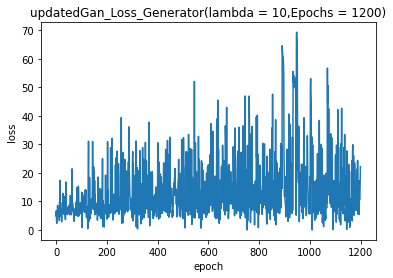

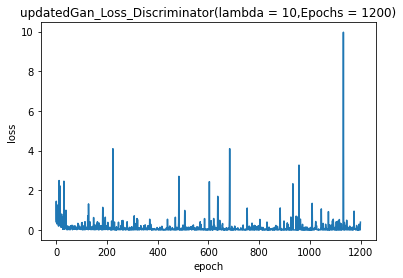

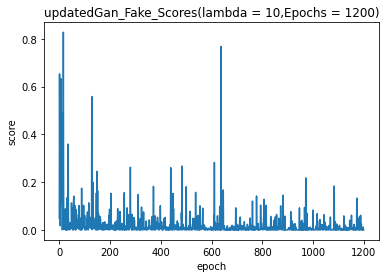

<Figure size 432x288 with 0 Axes>

In [18]:
""" Plot result """
iteration = np.arange(n_epochs)
plt.plot(iteration,lg)
plt.title("{0}_Loss_Generator(lambda = {1},Epochs = {2})".format(mode,tv_weight,n_epochs))
plt.xlabel("epoch")
plt.ylabel("loss")
plt.savefig("{0}_Loss_Generator(lambda = {1},Epochs = {2})".format(mode,tv_weight_jpg,n_epochs), bbox_inches='tight')
plt.show()
plt.clf()
plt.plot(iteration,ld)
plt.title("{0}_Loss_Discriminator(lambda = {1},Epochs = {2})".format(mode,tv_weight,n_epochs))
plt.xlabel("epoch")
plt.ylabel("loss")
plt.savefig("{0}_Loss_Discriminator(lambda = {1},Epochs = {2})".format(mode,tv_weight_jpg,n_epochs), bbox_inches='tight')
plt.show()
plt.clf()
plt.plot(iteration,fake_scores)
plt.title("{0}_Fake_Scores(lambda = {1},Epochs = {2})".format(mode,tv_weight,n_epochs))
plt.xlabel("epoch")
plt.ylabel("score")
plt.savefig("{0}_Fake_Scores(lambda = {1},Epochs = {2})".format(mode,tv_weight_jpg,n_epochs), bbox_inches='tight')
plt.show()
plt.clf()
